# Clustering with handcrafted techniques

This notebook performs handcrafted clustering for some distances and clustering techniques. The first part defines general functions, then there is a section for each of the approaches followed.

In [3]:
import os

import numpy as np
import pandas as pd

#from scipy.spatial.distance import cdist
#from scipy.sparse import csr_matrix

import matplotlib.pyplot as plt
import seaborn as sns
#from mpl_toolkits.mplot3d import Axes3D

from hdbscan import BranchDetector
import dbcv
from sklearn.metrics import silhouette_score

import pickle
import json

import warnings

In [1]:
# Importing a custom module in a different file
import sys
sys.path.append('C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code')
import constants
import hdbscan_experiment
import kmedoids_experiment
import utils_models
import description_clusters
import distances_calculations

c:\Users\camal\anaconda3\envs\skmob_updated_h3\lib\site-packages\tslearn\bases\bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [77]:
import importlib
importlib.reload(hdbscan_experiment)
importlib.reload(kmedoids_experiment)
importlib.reload(utils_models)
importlib.reload(description_clusters)
importlib.reload(distances_calculations)

<module 'distances_calculations' from 'C:\\Camilo\\Estudio\\Padova\\Master thesis\\master-thesis-code\\distances_calculations.py'>

Assigning the path to read the tables that serve as input for the models.

In [4]:
path_preprocessed_model_inputs = r'..\..\Datasets\Processed\model_inputs_preprocessed'

Assigning the path to read the tables for describing the clusters.

In [5]:
path_tables_for_description = r'..\..\Datasets\Processed\tables_for_description'

Assigning the path to read the distance embeddings for clustering.

In [6]:
path_distances_embeddings_overall = r'..\..\Datasets\Processed\distances_embeddings'

Assigning the path to write the cluster description plots.

In [7]:
path_cluster_description_overall = r'..\reports\figures\9-clusters-description-handcrafted'

Assigning the path to write the trajectories general measures with the clustering labels.

In [8]:
path_clustering_results_tables =r'..\..\Datasets\Processed\clustering_results'

## Global procedures

### Preliminaries

Read the full trajectories with added information for cluster description.

In [9]:
# Read the general features table
trajectory_general_measures_night = pd.read_csv(os.path.join(path_preprocessed_model_inputs,'trajectory_general_measures_night.csv'))

In [10]:
# Read the sequence of stops table
sequence_stops_night_filtered = pd.read_csv(os.path.join(path_preprocessed_model_inputs,'sequence_stops_night_filtered.csv'))

In [11]:
# List of columns that need to be parsed as dates
datetime_columns = ['datetime', 'time_window_5min', 'time_window_15min']

columns_to_load = ['uid','tid','lng','lat','h3_cell',
                   'vendor_name', 'stage_renamed'] + datetime_columns

# Read the trajectories
trajectories_events_night_extra_info = pd.read_csv(os.path.join(path_tables_for_description,'trajectories_events_night_extra_info.csv'), 
                                                   usecols=columns_to_load,
                                                   dtype={'vendor_name': str})

# Add the timezone information so that the times are handled correctly
for col in datetime_columns:
    trajectories_events_night_extra_info[col] =  pd.to_datetime(trajectories_events_night_extra_info[col]).dt.tz_convert('Europe/Madrid')

# Convert the column into a categorical column with the specified order for the plots
trajectories_events_night_extra_info['stage_renamed'] = pd.Categorical(trajectories_events_night_extra_info['stage_renamed'],
                                                                       categories=['SonarClub', 'SonarPub', 'SonarLab x Printworks', 'SonarCar',
                                                                      'Restaurants', 'Bumper cars', 'Bar: Restaurants-Bumper cars', 'Entrance/Cashless'],
                                                                       ordered=True
                                                                       )

In [12]:
# Read the lookup table for trajectories with no events
id_trajectories_no_events_lookup = pd.read_csv(os.path.join(path_tables_for_description,'id_trajectories_no_events_lookup.csv'))

In [13]:
# Read the lookup table for event ids
id_events_lookup = pd.read_csv(os.path.join(path_tables_for_description,'id_events_lookup.csv'))

Definition of functions needed afterwards.

In [14]:
# Generate a logarithmic range for values based on provided minimum and maximum bounds.
def generate_linear_range_list(min_val, max_val, num_values=5):
    return np.linspace(min_val, max_val, num=num_values, dtype=int).tolist()

In [15]:
# Generate a logarithmic range for values based on provided minimum and maximum bounds.
def generate_log_range_list(min_val, max_val, num_values=5):
    return np.logspace(np.log10(min_val), np.log10(max_val), num=5, dtype=int).tolist()

### Deciding the night for clustering

Can be both, which combines both nights into a single dataset (assumes that trajectories between both nights can] be comparable), night 1 or night 2.

In [16]:
night_interest = 1

As different nights have different events, and the `trajectory_general_measures_night` has the scores given by each user to each event as columns, I can define a function to include only the events related to each night.

In [17]:
def exclude_event_scores_night(trajectory_general_measures_df, id_events_lookup_df, night):
    id_events_other_night = id_events_lookup_df.loc[id_events_lookup_df['tid']!=night]
    columns_score_exclude = ('adj_score_' + id_events_other_night['event_id']).to_list()

    trajectory_general_measures_df = trajectory_general_measures_df.drop(columns=columns_score_exclude)

    print(f'Columns excluded: \n{columns_score_exclude}')
    return trajectory_general_measures_df

In [18]:
if night_interest=='both':
    # Definition of the path to read the embeddings for the specific case
    path_distances_embeddings = os.path.join(path_distances_embeddings_overall,'both')

    # Definition of the path to write the description plots for the specific case
    path_cluster_description = os.path.join(path_cluster_description_overall,'both')

    print('Both nights are included in the examined datasets.')
elif night_interest in (1,2):
    # Filter the dataframes for the night of interest
    trajectory_general_measures_night = trajectory_general_measures_night.loc[trajectory_general_measures_night['tid']==night_interest]
    trajectories_events_night_extra_info = trajectories_events_night_extra_info.loc[trajectories_events_night_extra_info['tid']==night_interest]
    sequence_stops_night_filtered = sequence_stops_night_filtered.loc[sequence_stops_night_filtered['tid']==night_interest]
    
    # Exclude the score columns not related to the night of interest
    trajectory_general_measures_night = exclude_event_scores_night(trajectory_general_measures_df=trajectory_general_measures_night,
                                                                   id_events_lookup_df=id_events_lookup,
                                                                   night=night_interest)
    
    # Definition of the path to read the embeddings for the specific case
    path_distances_embeddings = os.path.join(path_distances_embeddings_overall,f'night_{night_interest}')

    # Definition of the path to write the description plots for the specific case
    path_cluster_description = os.path.join(path_cluster_description_overall,f'night_{night_interest}')

    print(f'Night {night_interest} was selected for examination.\n')
else:
    raise Exception("`night_interest` must be 'both', 1 or 2.")

print(f"\nNights in the examined trajectory_general_measures_night: {trajectory_general_measures_night['tid'].unique()}.")
print(f"Nights in the examined trajectories_events_night_extra_info: {trajectories_events_night_extra_info['tid'].unique()}.")
print(f"Nights in the examined sequence_stops_night_filtered: {sequence_stops_night_filtered['tid'].unique()}.")

Columns excluded: 
['adj_score_ev_25', 'adj_score_ev_26', 'adj_score_ev_27', 'adj_score_ev_28', 'adj_score_ev_29', 'adj_score_ev_30', 'adj_score_ev_31', 'adj_score_ev_32', 'adj_score_ev_33', 'adj_score_ev_34', 'adj_score_ev_35', 'adj_score_ev_36', 'adj_score_ev_37', 'adj_score_ev_38', 'adj_score_ev_39', 'adj_score_ev_40', 'adj_score_ev_41', 'adj_score_ev_42', 'adj_score_ev_43', 'adj_score_ev_44', 'adj_score_ev_45', 'adj_score_ev_46', 'adj_score_ev_47', 'adj_score_ev_48', 'adj_score_ev_49', 'adj_score_ev_50']
Night 1 was selected for examination.


Nights in the examined trajectory_general_measures_night: [1].
Nights in the examined trajectories_events_night_extra_info: [1].
Nights in the examined sequence_stops_night_filtered: [1].


In [19]:
print(f'Shape of trajectory_general_measures_df: {trajectory_general_measures_night.shape}')
print(f'Shape of trajectories_events_night_extra_info: {trajectories_events_night_extra_info.shape}')
print(f'Shape of sequence_stops_night_filtered: {sequence_stops_night_filtered.shape}')

Shape of trajectory_general_measures_df: (1780, 54)
Shape of trajectories_events_night_extra_info: (4681560, 10)
Shape of sequence_stops_night_filtered: (9845, 15)


### Deciding to include trajectories with no events or not

THis boolean variable controls whether the trajectories with no events are included or not in the computation of the matrices.

In [20]:
include_trajs_no_events = False

In [21]:
def exclude_rows(df, exclude_lookup):
    """
    Excludes rows from a DataFrame based on matching uid and tid combinations in the lookup DataFrame.
    """
    mask = ~df.set_index(['uid', 'tid']).index.isin(exclude_lookup.set_index(['uid', 'tid']).index)
    return df[mask]

In [22]:
if include_trajs_no_events == True:
   print('Trajectories with no events are included in the examined datasets')
elif include_trajs_no_events == False:
   trajectory_general_measures_night = exclude_rows(trajectory_general_measures_night, id_trajectories_no_events_lookup)
   trajectories_events_night_extra_info = exclude_rows(trajectories_events_night_extra_info, id_trajectories_no_events_lookup)
   sequence_stops_night_filtered = exclude_rows(sequence_stops_night_filtered, id_trajectories_no_events_lookup)

   print('Trajectories with no events are excluded from the examined datasets.')
else:
   raise Exception('`include_trajs_no_events` must be a boolean value')

print(f'Unique trajectories in trajectory_general_measures_night: {trajectory_general_measures_night.shape[0]}')
print(f"Unique trajectories in trajectories_events_night_extra_info: {trajectories_events_night_extra_info[['uid','tid']].drop_duplicates().shape[0]}")
print(f"Unique trajectories in sequence_stops_night_filtered: {sequence_stops_night_filtered[['uid','tid']].drop_duplicates().shape[0]}")

Trajectories with no events are excluded from the examined datasets.
Unique trajectories in trajectory_general_measures_night: 1580
Unique trajectories in trajectories_events_night_extra_info: 1580
Unique trajectories in sequence_stops_night_filtered: 1580


### Reading the distances experiment settings

In [23]:
distances_embeddings_settings_filename = os.path.join(path_distances_embeddings,"distances_embeddings_settings.json")
with open(distances_embeddings_settings_filename, 'r') as file:
    distances_embeddings_settings = json.load(file)


print(f'distances_embeddings_settings: \n{distances_embeddings_settings}')

distances_embeddings_settings: 
{'night_interest': 1, 'include_trajs_no_events': False, 'n_trajectories_dist_notebook': 1580, 'n_neighbors_umap': 25, 'n_components_umap_clustering': 5}


In [24]:
if distances_embeddings_settings['n_trajectories_dist_notebook'] == trajectory_general_measures_night.shape[0]:
    n_trajectories = distances_embeddings_settings['n_trajectories_dist_notebook']
else:
    raise Exception('There is an inconsistency in `n_trajectories` with respect to the `distances_embeddings_settings`')

Definition of the settings from `distances_embeddings_settings` for clustering and visualization.

In [25]:
n_neighbors_umap = distances_embeddings_settings['n_neighbors_umap']
n_components_umap_clustering = distances_embeddings_settings['n_components_umap_clustering']

### Columns settings for the description

Selecting the columns to extract a summary table.

In [26]:
columns_interest_distribution = ['observations_user_night_original','timespan_festival_mins', 
                                'average_cell_density',
                                'num_attended_events', 
                                'distance_straight_line', 'radius_of_gyration',
                                'total_stops_duration_mins',
                                
                                # Durations by genre
                                'duration_electronic_accessible_share','duration_electronic_hypnotic_share', 'duration_other_genres_share',
                                'duration_no_event_share', 
                                'avg_adj_score_electronic_accessible','avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
                                
                                # Durations by location type
                                'duration_bar_restaurant_share', 'duration_other_share','duration_stage_share',
                                
                                # Durations by stage
                                'duration_SonarClub_share', 'duration_SonarPub_share', 
                                'duration_SonarLab x Printworks_share', 'duration_SonarCar_share', 
                                'duration_Restaurants_share', 'duration_Bumper cars_share',
                                'duration_Bar: Restaurants-Bumper cars_share', 'duration_Entrance/Cashless_share']

Extract the vendor names and joining them to the general measures table (just for description after clustering)

In [27]:
vendor_names = trajectories_events_night_extra_info[['uid','tid','vendor_name']].drop_duplicates()
vendor_names.shape

(1580, 3)

In [28]:
trajectory_general_measures_night = pd.merge(trajectory_general_measures_night, 
                                             vendor_names,
                                             on=['uid','tid'],
                                             how='left')
trajectory_general_measures_night.shape

(1580, 55)

## TW euclidean and GF

### 2D UMAP embeddings (TW)

Read the embeddings extracted from the various distances for clustering and visualization.

The 2D UMAP embeddings are obtained for visualization.

In [29]:
umaps_tw_2d_final_filename = os.path.join(path_distances_embeddings,f'umaps_tw_2d_{n_neighbors_umap}neighbors.pkl')

In [30]:
with open(umaps_tw_2d_final_filename, 'rb') as f:
    umaps_tw_2d_final = pickle.load(f)
    print(f'Loaded UMAP distance embeddings from {umaps_tw_2d_final_filename}')

Loaded UMAP distance embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_tw_2d_25neighbors.pkl


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\distances_calculations.py:584: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  scatter = ax.scatter(embedding[:, 0], embedding[:, 1],


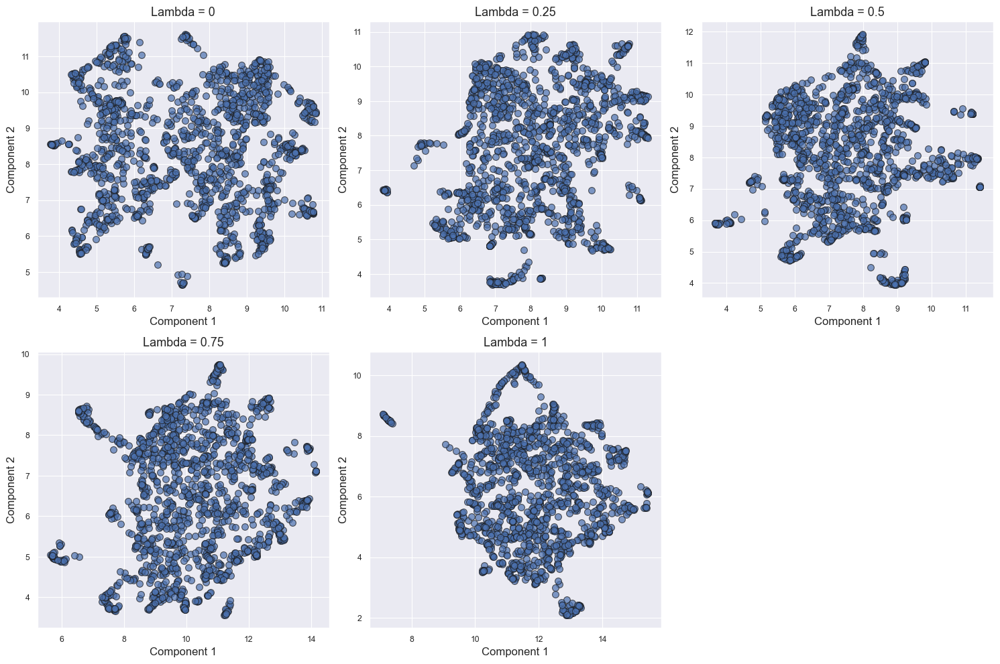

In [31]:
# Check the visualization of embeddings for this distance
distances_calculations.plot_multiple_embeddings(multi_distances_embeddings=umaps_tw_2d_final, cols=3)

### Higher-Dimensional UMAP Embeddings

Reading the higher-dimensional umap embeddings for clustering.

In [32]:
umaps_tw_higher_d_final_filename = os.path.join(path_distances_embeddings,f'umaps_tw_{n_components_umap_clustering}d_{n_neighbors_umap}neighbors.pkl')

In [33]:
with open(umaps_tw_higher_d_final_filename, 'rb') as f:
        umaps_tw_higher_d_final = pickle.load(f)
        print(f'Loaded UMAP embeddings from {umaps_tw_higher_d_final_filename}')

Loaded UMAP embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_tw_5d_25neighbors.pkl


### HDBSCAN

#### Experiment settings

Creating an instance of the HDBSCANExperiment class, which defines the settings for performing a set of iterations of clustering runs while varying the parameters.

As a rule of thumb to later define the other hyperparameters, I try values from 1% to 5% of the data, which spread on a logarithmic scale.

In [34]:
min_cluster_sizes = generate_log_range_list(min_val = round(n_trajectories*0.01), max_val= 0.05 * n_trajectories, num_values=5)

I set `min_samples` to be proportions of `min_cluster_size`to see what works best.

In [35]:
min_samples_proportions = [0.16, 0.33, 0.66, 0.83, 1]

In [36]:
hdbscan_TW = hdbscan_experiment.HDBSCANExperiment(multi_distances_embeddings=umaps_tw_higher_d_final,
                                                  min_cluster_sizes=min_cluster_sizes,
                                                  min_samples_proportions=min_samples_proportions)

print(f'Lambda values for consideration: {list(hdbscan_TW.multi_distances_embeddings.keys())}')
print(f'min_cluster_size values for consideration: {hdbscan_TW.min_cluster_sizes}')
print(f'min_samples_proportion values for consideration: {hdbscan_TW.min_samples_proportions}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
min_cluster_size values for consideration: [16, 23, 35, 52, 78]
min_samples_proportion values for consideration: [0.16, 0.33, 0.66, 0.83, 1]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [37]:
hdbscan_TW.run_multi_hdbscan()

print('\HDBSCAN for TW euclidean -  labels and counts:')
for key, labels in hdbscan_TW.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. HDBSCAN labels_dict was updated.
\HDBSCAN for TW euclidean -  labels and counts:
(0, 16, 0.16) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32],
      dtype=int64), array([349,  16,  24,  22,  35,  41,  57,  44,  60,  19,  38,  23,  18,
        56,  69,  16,  24,  21,  23,  57,  78,  22,  61,  35,  42,  16,
        17,  50,  18,  19,  36,  27,  92,  55], dtype=int64))
(0, 16, 0.33) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24], dtype=int64), array([345,  16,  24,  22,  44,  35,  40,  53,  54,  58,

#### Cluster evaluation

##### DBCV scores

It is a score that serves as an internal relative validation index for density-based, arbitrarily shaped clusters, so it is useful to determine good candidates for the same family of HDBSCAN runs. However, the final clustering evaluation should be carefully examined.

In [38]:
hdbscan_TW.compute_hdbscan_dbcv_scores()

print('\nHDBSCAN for TW euclidean - DBCV scores:')
hdbscan_TW.dbcv_scores_dict

DBCV scores computation is done. HDBSCAN dbcv_scores_dict was updated

HDBSCAN for TW euclidean - DBCV scores:


{(0, 16, 0.16): 0.43226883778468594,
 (0, 16, 0.33): 0.43382745424415753,
 (0, 16, 0.66): 0.5022021280080844,
 (0, 16, 0.83): 0.4764836283626293,
 (0, 16, 1): 0.5049081917457021,
 (0, 23, 0.16): 0.3144756741421562,
 (0, 23, 0.33): 0.4728589925454016,
 (0, 23, 0.66): 0.5096544096565402,
 (0, 23, 0.83): 0.5064559240174273,
 (0, 23, 1): 0.4626452280823299,
 (0, 35, 0.16): 0.3102323596972171,
 (0, 35, 0.33): 0.46737531717454783,
 (0, 35, 0.66): 0.4509668192013403,
 (0, 35, 0.83): 0.3991785415107116,
 (0, 35, 1): 0.4075171002685277,
 (0, 52, 0.16): 0.2659725467320413,
 (0, 52, 0.33): 0.39458076974835266,
 (0, 52, 0.66): 0.3883929427659446,
 (0, 52, 0.83): 0.36469213838085135,
 (0, 52, 1): 0.1948579889320825,
 (0, 78, 0.16): 0.40343190139282087,
 (0, 78, 0.33): 0.38324342608038026,
 (0, 78, 0.66): 0.16127412246116407,
 (0, 78, 0.83): 0.2225587558081373,
 (0, 78, 1): 0.26310479729878855,
 (0.25, 16, 0.16): 0.42180266557903723,
 (0.25, 16, 0.33): 0.36139809819489704,
 (0.25, 16, 0.66): 0.49427

##### Silhouette scores

Running the function that computes the silhouette scores for the set of parameters and updates the object's attributes. This measure is computed to have a rough idea about how this clustering technique behaves with respect to K-Medoids, but it is worth mentioning that this score is more appropiate for glopular clusters, not density based clusters, so the numeric comparison should not be trusted blindly.

In [39]:
hdbscan_TW.compute_hdbscan_silhouette_scores()

print('\nHDBSCAN for TW euclidean - silhouette scores:')
hdbscan_TW.silhouette_scores_dict

Silhouette scores computation is done. HDBSCAN silhouette_scores_dict was updated

HDBSCAN for TW euclidean - silhouette scores:


{(0, 16, 0.16): 0.26245114,
 (0, 16, 0.33): 0.2567748,
 (0, 16, 0.66): 0.19307424,
 (0, 16, 0.83): 0.18393056,
 (0, 16, 1): 0.22393219,
 (0, 23, 0.16): 0.27742407,
 (0, 23, 0.33): 0.235777,
 (0, 23, 0.66): 0.20075965,
 (0, 23, 0.83): 0.21961017,
 (0, 23, 1): 0.14295201,
 (0, 35, 0.16): 0.18419865,
 (0, 35, 0.33): 0.21001813,
 (0, 35, 0.66): 0.13595724,
 (0, 35, 0.83): 0.14930414,
 (0, 35, 1): 0.117409796,
 (0, 52, 0.16): 0.15595819,
 (0, 52, 0.33): -0.040845085,
 (0, 52, 0.66): -0.043200355,
 (0, 52, 0.83): -0.02135523,
 (0, 52, 1): -0.008196851,
 (0, 78, 0.16): -0.035849422,
 (0, 78, 0.33): -0.04298892,
 (0, 78, 0.66): 0.025444608,
 (0, 78, 0.83): 0.054317866,
 (0, 78, 1): 0.021899983,
 (0.25, 16, 0.16): 0.27694586,
 (0.25, 16, 0.33): 0.33081263,
 (0.25, 16, 0.66): 0.2809864,
 (0.25, 16, 0.83): 0.20812324,
 (0.25, 16, 1): 0.24394993,
 (0.25, 23, 0.16): 0.30807978,
 (0.25, 23, 0.33): 0.24736036,
 (0.25, 23, 0.66): 0.23013254,
 (0.25, 23, 0.83): 0.17306426,
 (0.25, 23, 1): 0.20549558,
 

##### Balanced clustering scores

There seems to be a homogeneity between instances that makes the algorithms cluster many samples into the same group which is not informative. It is more informative to get more balanced clusters.
This has to be manually assessed in terms of relevance and interpretability of the clusters, but to obtain a metric for finding good candidates, a score that combines the clustering quality and homogeneity can be computed, with a weighted value that controls the importance of each aspect of the clustering:


$$
combined\_score = (w \cdot rescaled\_dbcv) + ((1 - w) \cdot entropy)
$$



In [40]:
# Compute the entropy of each clustering result
hdbscan_TW.compute_normalized_entropy()

print('\nHDBSCAN for TW euclidean - normalized entropies:')
hdbscan_TW.normalized_entropies_dict

Normalized entropy computation is done. HDBSCAN normalized_entropies_dict was updated

HDBSCAN for TW euclidean - normalized entropies:


{(0, 16, 0.16): 0.9613383892081813,
 (0, 16, 0.33): 0.9088320064958495,
 (0, 16, 0.66): 0.9697287890669765,
 (0, 16, 0.83): 0.9680611218062326,
 (0, 16, 1): 0.9505376704792657,
 (0, 23, 0.16): 0.9209369278361865,
 (0, 23, 0.33): 0.9313378980959014,
 (0, 23, 0.66): 0.9562765943135308,
 (0, 23, 0.83): 0.9495199412023915,
 (0, 23, 1): 0.9494524325955338,
 (0, 35, 0.16): 0.8400350567326509,
 (0, 35, 0.33): 0.9643905544706602,
 (0, 35, 0.66): 0.9253844211129041,
 (0, 35, 0.83): 0.941910598162271,
 (0, 35, 1): 0.9411018293334743,
 (0, 52, 0.16): 0.8223400778460657,
 (0, 52, 0.33): 0.3668592490407474,
 (0, 52, 0.66): 0.3809465857053901,
 (0, 52, 0.83): 0.38774318105598654,
 (0, 52, 1): 0.856381996648272,
 (0, 78, 0.16): 0.3584467747033072,
 (0, 78, 0.33): 0.37142707700314104,
 (0, 78, 0.66): 0.9051399997047649,
 (0, 78, 0.83): 0.9973806632063373,
 (0, 78, 1): 0.9814538950336537,
 (0.25, 16, 0.16): 0.9714965373381534,
 (0.25, 16, 0.33): 0.9227661755236612,
 (0.25, 16, 0.66): 0.9287433233132301

In [41]:
# Rescale the DBCV of each clustering result
hdbscan_TW.rescale_dbcv_scores()

print('\nHDBSCAN for TW euclidean - rescaled DBCV:')
hdbscan_TW.rescaled_dbcv_scores_dict

Rescaling of DBCV is done. HDBSCAN rescaled_dbcv_scores_dict was updated

HDBSCAN for TW euclidean - rescaled DBCV:


{(0, 16, 0.16): 0.716134418892343,
 (0, 16, 0.33): 0.7169137271220788,
 (0, 16, 0.66): 0.7511010640040422,
 (0, 16, 0.83): 0.7382418141813146,
 (0, 16, 1): 0.7524540958728511,
 (0, 23, 0.16): 0.6572378370710781,
 (0, 23, 0.33): 0.7364294962727008,
 (0, 23, 0.66): 0.75482720482827,
 (0, 23, 0.83): 0.7532279620087137,
 (0, 23, 1): 0.7313226140411649,
 (0, 35, 0.16): 0.6551161798486085,
 (0, 35, 0.33): 0.7336876585872739,
 (0, 35, 0.66): 0.7254834096006701,
 (0, 35, 0.83): 0.6995892707553558,
 (0, 35, 1): 0.7037585501342638,
 (0, 52, 0.16): 0.6329862733660206,
 (0, 52, 0.33): 0.6972903848741763,
 (0, 52, 0.66): 0.6941964713829722,
 (0, 52, 0.83): 0.6823460691904257,
 (0, 52, 1): 0.5974289944660413,
 (0, 78, 0.16): 0.7017159506964105,
 (0, 78, 0.33): 0.6916217130401902,
 (0, 78, 0.66): 0.580637061230582,
 (0, 78, 0.83): 0.6112793779040686,
 (0, 78, 1): 0.6315523986493943,
 (0.25, 16, 0.16): 0.7109013327895186,
 (0.25, 16, 0.33): 0.6806990490974485,
 (0.25, 16, 0.66): 0.747135826331156,
 (0

In [288]:
# Compute the balanced score

hdbscan_TW.compute_balanced_clustering_score(weight=0.5)

print('\nHDBSCAN for TW euclidean - ranked balanced clustering score:')
hdbscan_TW.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. HDBSCAN ranked_balanced_clustering_scores_dict was updated

HDBSCAN for TW euclidean - ranked balanced clustering score:


{(0.25, 16, 0.83): 0.8632510490937778,
 (0, 16, 0.66): 0.8604149265355093,
 (0, 23, 0.66): 0.8555518995709004,
 (0.5, 16, 0.83): 0.8546431102998133,
 (0.5, 16, 0.66): 0.8533434270194713,
 (0, 16, 0.83): 0.8531514679937736,
 (0, 16, 1): 0.8514958831760584,
 (0, 23, 0.83): 0.8513739516055525,
 (0.25, 16, 1): 0.8496651936725033,
 (0, 35, 0.33): 0.8490391065289671,
 (0.5, 16, 1): 0.8460630820855921,
 (0.75, 16, 0.66): 0.8455657471550868,
 (0.25, 16, 0.16): 0.841198935063836,
 (0.25, 23, 0.66): 0.8408109867576283,
 (0.75, 16, 0.33): 0.8405916783034358,
 (0, 23, 1): 0.8403875233183493,
 (1, 16, 0.33): 0.8389993205403168,
 (0, 16, 0.16): 0.8387364040502621,
 (0.25, 16, 0.66): 0.8379395748221931,
 (0.5, 16, 0.33): 0.8348248623753862,
 (1, 16, 0.16): 0.8344919328053455,
 (0, 23, 0.33): 0.8338836971843011,
 (1, 78, 0.16): 0.8285896978948706,
 (0.5, 16, 0.16): 0.8262259808760701,
 (0.75, 23, 0.16): 0.8261231315583464,
 (1, 23, 0.16): 0.8257531235340414,
 (0, 35, 0.66): 0.8254339153567871,
 (0.5, 

##### Best parameters based on the scores

Selecting the best parameters based on the DBCV score, the silhouette score and the balanced clustering score.

In [289]:
hdbscan_TW.update_best_params_and_score()

HDBSCAN updated best_parameters_silhouette are (1, 16, 0.66) with silhouette score = 0.5486147999763489
HDBSCAN updated best_parameters_dbcv are (1, 16, 0.66) with DBCV score = 0.945734504595864
HDBSCAN updated best_parameters_bcs are (0.25, 16, 0.83) with BCS score = 0.8632510490937778


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the HDBSCAN instance with the best parameters for DBCV (TW euclidean):
[0 1]


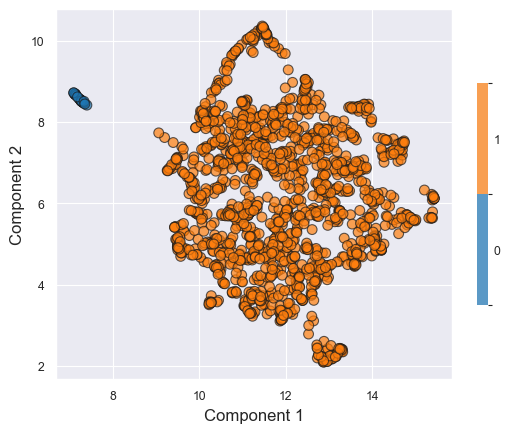

In [44]:
print('Unique labels for the HDBSCAN instance with the best parameters for DBCV (TW euclidean):')
print(np.unique(hdbscan_TW.labels_dict[hdbscan_TW.best_parameters_dbcv]))


best_lambda = hdbscan_TW.best_parameters_dbcv[0]
distances_calculations.plot_embeddings(umaps_tw_2d_final[best_lambda]['embeddings'], 
                                       labels=hdbscan_TW.labels_dict[hdbscan_TW.best_parameters_dbcv])

Unique labels for the HDBSCAN instance with the best parameters for BCS (TW euclidean):
[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26]


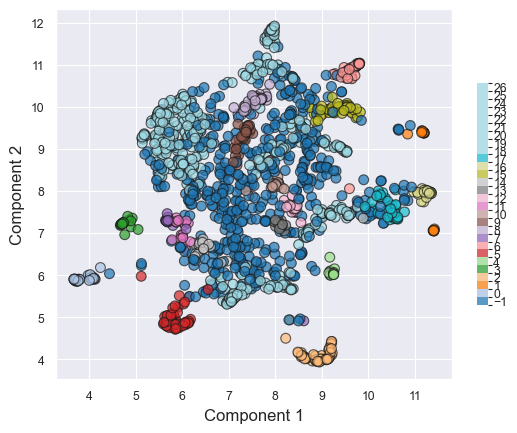

In [45]:
print('Unique labels for the HDBSCAN instance with the best parameters for BCS (TW euclidean):')
print(np.unique(hdbscan_TW.labels_dict[hdbscan_TW.best_parameters_bcs]))


best_lambda = hdbscan_TW.best_parameters_bcs[0]
distances_calculations.plot_embeddings(umaps_tw_2d_final[best_lambda]['embeddings'], labels=hdbscan_TW.labels_dict[hdbscan_TW.best_parameters_bcs])

#### Description of the clusters

##### Selecting the results to examine

In [46]:
trajectory_general_measures_night['hdbscan_tw_labels'] = hdbscan_TW.labels_dict[hdbscan_TW.best_parameters_dbcv]

##### Summary statistics by clusters

In [47]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='hdbscan_tw_labels',
                                             decimals=5)

hdbscan_tw_labels,0,1
count,36.00000,1544.00000
"(tid, mean)",1.00000,1.00000
"(tid, std)",0.00000,0.00000
"(tid, min)",1.00000,1.00000
"(tid, max)",1.00000,1.00000
...,...,...
"(adj_score_ev_24, max)",0.00581,0.35145
"(hdbscan_tw_labels, mean)",0.00000,1.00000
"(hdbscan_tw_labels, std)",0.00000,0.00000
"(hdbscan_tw_labels, min)",0.00000,1.00000


##### Arrival and departure times

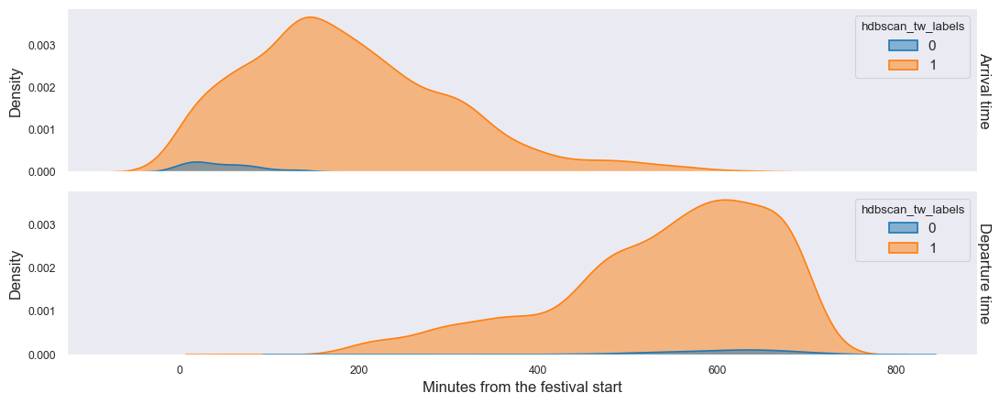

In [48]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='hdbscan_tw_labels')

#####  Distributions per column of interest

In [49]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [50]:
"""for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_tw_labels', interest_col=col_interest)"""

"for col_interest in columns_interest_distribution:\n    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_tw_labels', interest_col=col_interest)"

##### Scatter plots with regression

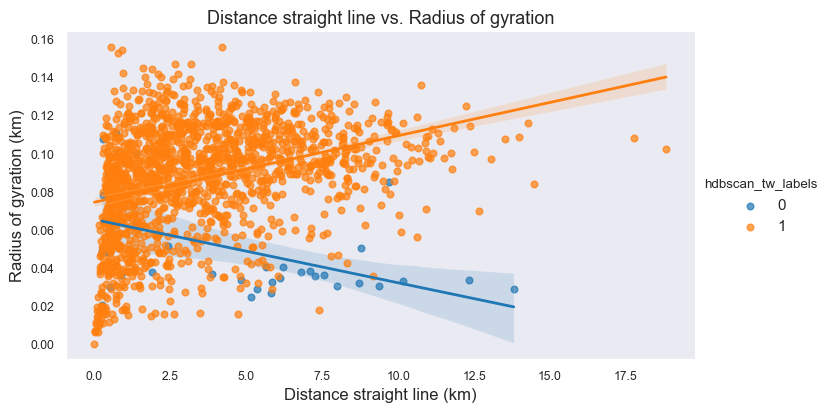

In [51]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_tw_labels')


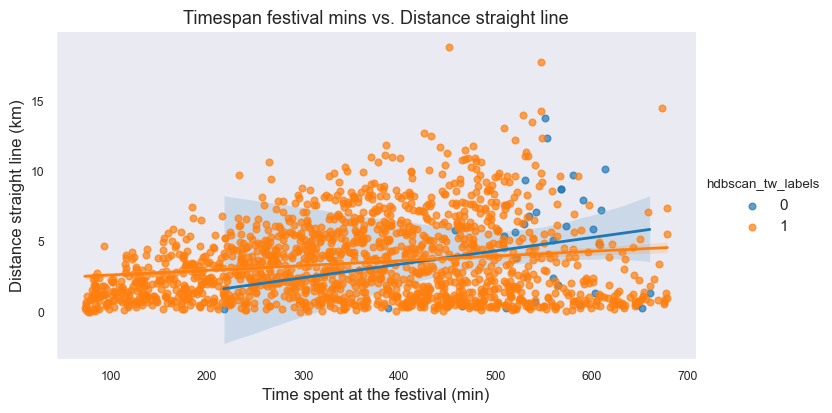

In [52]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='hdbscan_tw_labels')

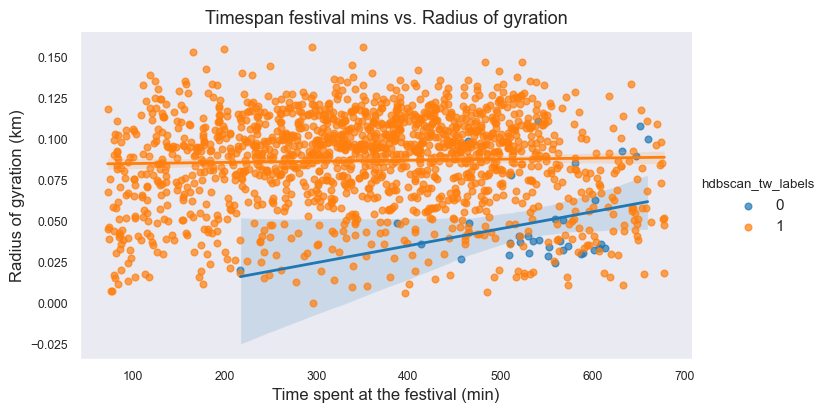

In [53]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_tw_labels')

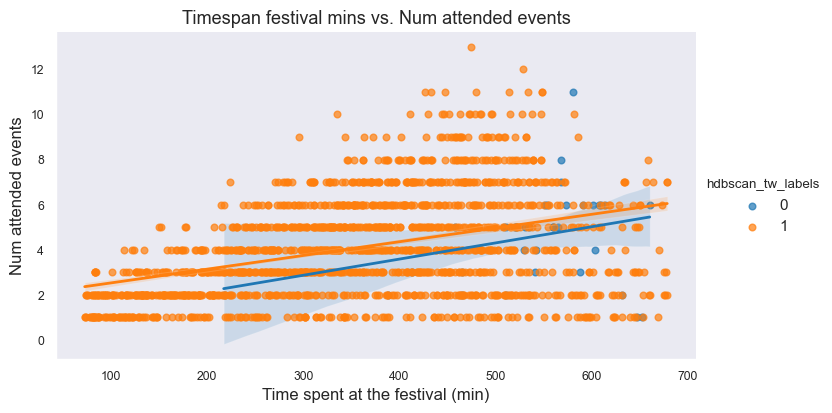

In [54]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='hdbscan_tw_labels')

##### Event rankings by cluster

In [55]:
"""description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='hdbscan_tw_labels')"""

"description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,\n                                                     clusters_col='hdbscan_tw_labels')"

In [56]:
"""description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='hdbscan_tw_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)"""

"description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,\n                                              clusters_col='hdbscan_tw_labels',\n                                              path_to_save=path_cluster_description,\n                                              show_plot=False)"

##### H3 counts plots per cluster

In [57]:
"""# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','hdbscan_tw_labels']],
                                                on=['uid','tid'],
                                                how='left')"""

"# Join the cluster labels to the full trajectory\ntrajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,\n                                                trajectory_general_measures_night[['uid','tid','hdbscan_tw_labels']],\n                                                on=['uid','tid'],\n                                                how='left')"

Plotting the observation counts by H3 cell and cluster.

In [58]:
"""description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='hdbscan_tw_labels', 
                                                     path_to_save=path_cluster_description)"""

"description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                     clusters_col='hdbscan_tw_labels', \n                                                     path_to_save=path_cluster_description)"

Plotting the user counts by H3 cell timeline by cluster.

In [59]:
"""description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='hdbscan_tw_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)"""

"description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                            clusters_col='hdbscan_tw_labels',\n                                                            window_duration='15min',\n                                                            path_to_save=path_cluster_description)"

##### Vendor name proportion

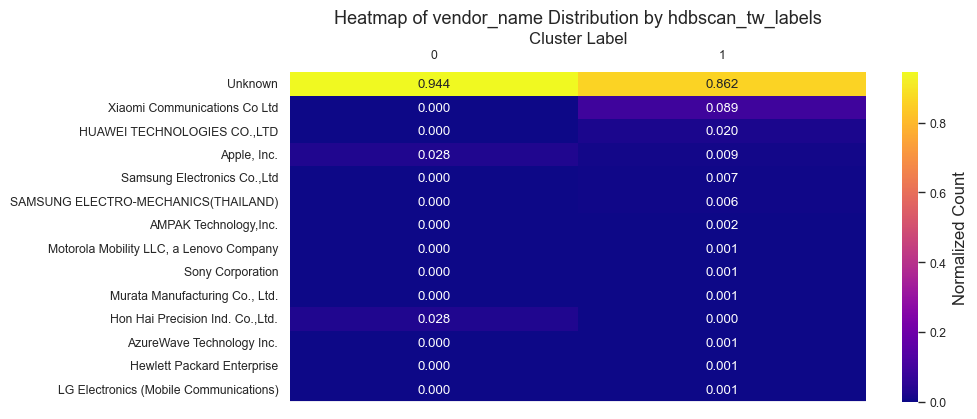

In [60]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'hdbscan_tw_labels')

##### People counts heatmap by cluster

In [61]:
"""description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='hdbscan_tw_labels')"""

"description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,\n                                                               clusters_col='hdbscan_tw_labels')"

### K Medoids

#### Experiment settings

Creating an instance of the KMedoidsExperiment class, which defines the settings for performing a set of iterations of clustering runs while varying the parameters.

In [62]:
kmedoids_TW = kmedoids_experiment.KMedoidsExperiment(multi_distances_embeddings=umaps_tw_higher_d_final,
                                                     k_values=list(range(2,11)))

print(f'Lambda values for consideration: {list(kmedoids_TW.multi_distances_embeddings.keys())}')
print(f'k values for consideration: {kmedoids_TW.k_values}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
k values for consideration: [2, 3, 4, 5, 6, 7, 8, 9, 10]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [63]:
kmedoids_TW.run_multi_kmedoids()

print('\nK-medoids for TW euclidean - labels:')
for key, labels in kmedoids_TW.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. K-medoids labels_dict was updated.

K-medoids for TW euclidean - labels:
(0, 2) (array([0, 1], dtype=int64), array([722, 858], dtype=int64))
(0, 3) (array([0, 1, 2], dtype=int64), array([713, 484, 383], dtype=int64))
(0, 4) (array([0, 1, 2, 3], dtype=int64), array([246, 441, 354, 539], dtype=int64))
(0, 5) (array([0, 1, 2, 3, 4], dtype=int64), array([319, 302, 318, 297, 344], dtype=int64))
(0, 6) (array([0, 1, 2, 3, 4, 5], dtype=int64), array([311, 318, 280, 104, 279, 288], dtype=int64))
(0, 7) (array([0, 1, 2, 3, 4, 5, 6], dtype=int64), array([267, 224, 271, 106, 130, 254, 328], dtype=int64))
(0, 8) (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([106, 163, 271, 

#### Cluster evaluation

Running the function that computes the silhouette scores for the set of parameters and updates the object's attributes.

##### Silhouette scores

In [64]:
kmedoids_TW.compute_kmedoids_silhouette_scores()

print('\K-medoids for TW euclidean - silhouette scores:')
kmedoids_TW.silhouette_scores_dict

Silhouette scores computation is done. K-medoids silhouette_scores_dict was updated
\K-medoids for TW euclidean - silhouette scores:


{(0, 2): 0.36522403,
 (0, 3): 0.34327763,
 (0, 4): 0.3204717,
 (0, 5): 0.3352023,
 (0, 6): 0.3564392,
 (0, 7): 0.3415144,
 (0, 8): 0.34066564,
 (0, 9): 0.30625242,
 (0, 10): 0.33565137,
 (0.25, 2): 0.36999586,
 (0.25, 3): 0.27639064,
 (0.25, 4): 0.31300688,
 (0.25, 5): 0.30555448,
 (0.25, 6): 0.27543667,
 (0.25, 7): 0.32627842,
 (0.25, 8): 0.33660066,
 (0.25, 9): 0.31649032,
 (0.25, 10): 0.34959447,
 (0.5, 2): 0.31002015,
 (0.5, 3): 0.24488008,
 (0.5, 4): 0.29870093,
 (0.5, 5): 0.26991403,
 (0.5, 6): 0.2931529,
 (0.5, 7): 0.28780478,
 (0.5, 8): 0.30991066,
 (0.5, 9): 0.33698028,
 (0.5, 10): 0.3073904,
 (0.75, 2): 0.2833601,
 (0.75, 3): 0.26817492,
 (0.75, 4): 0.2464537,
 (0.75, 5): 0.2709177,
 (0.75, 6): 0.16767687,
 (0.75, 7): 0.2437176,
 (0.75, 8): 0.27399188,
 (0.75, 9): 0.29232338,
 (0.75, 10): 0.27928406,
 (1, 2): 0.27510342,
 (1, 3): 0.26559094,
 (1, 4): 0.24903259,
 (1, 5): 0.25040856,
 (1, 6): 0.26057556,
 (1, 7): 0.25255293,
 (1, 8): 0.22705206,
 (1, 9): 0.21492717,
 (1, 10): 

##### DBCV scores

For completeness, the DBCV is. also computed for K-medoids.

In [65]:
kmedoids_TW.compute_kmedoids_dbcv_scores()

print('\K-medoids for TW euclidean - DBCV scores:')
kmedoids_TW.dbcv_scores_dict

DBCV scores computation is done. K-medoids dbcv_scores_dict was updated
\K-medoids for TW euclidean - DBCV scores:


{(0, 2): -0.937277443924815,
 (0, 3): -0.8551005265469294,
 (0, 4): -0.9577558213527934,
 (0, 5): -0.9781889260116,
 (0, 6): -0.9614399235858858,
 (0, 7): -0.8649345287310484,
 (0, 8): -0.8928913778801046,
 (0, 9): -0.81309805520873,
 (0, 10): -0.8309604355374174,
 (0.25, 2): -0.9329020770322894,
 (0.25, 3): -0.9472235280377583,
 (0.25, 4): -0.9210198446601177,
 (0.25, 5): -0.9526834213943889,
 (0.25, 6): -0.9330515417983404,
 (0.25, 7): -0.8717685221045248,
 (0.25, 8): -0.9024517890481313,
 (0.25, 9): -0.8615475776683563,
 (0.25, 10): -0.8348861544182091,
 (0.5, 2): -0.9048828314348557,
 (0.5, 3): -0.9893368065014555,
 (0.5, 4): -0.9515222185456146,
 (0.5, 5): -0.9553929334875849,
 (0.5, 6): -0.90074477458893,
 (0.5, 7): -0.9472512013004528,
 (0.5, 8): -0.8891368809598759,
 (0.5, 9): -0.8179443023368316,
 (0.5, 10): -0.8060614790644025,
 (0.75, 2): -0.9970214369580318,
 (0.75, 3): -0.9764415665092779,
 (0.75, 4): -0.965419295677226,
 (0.75, 5): -0.9627627569291459,
 (0.75, 6): -0.9664

##### Balanced clustering scores

There seems to be a homogeneity between instances that makes the algorithms cluster many samples into the same group which is not informative. It is more informative to get more balanced clusters.
This has to be manually assessed in terms of relevance and interpretability of the clusters, but to obtain a metric for finding good candidates, a score that combines the clustering quality and homogeneity can be computed, with a weighted value that controls the importance of each aspect of the clustering:


$$
combined\_score = (w \cdot rescaled\_silhouette) + ((1 - w) \cdot entropy)
$$



In [66]:
# Compute the entropy of each clustering result
kmedoids_TW.compute_normalized_entropy()

print('\nK-medoids for TW euclidean - normalized entropies:')
kmedoids_TW.normalized_entropies_dict

Normalized entropy computation is done. K-medoids normalized_entropies_dict was updated

K-medoids for TW euclidean - normalized entropies:


{(0, 2): 0.9946488671232326,
 (0, 3): 0.9694150601313486,
 (0, 4): 0.9722287416723273,
 (0, 5): 0.9991648398625894,
 (0, 6): 0.9737893780610896,
 (0, 7): 0.9696126269736051,
 (0, 8): 0.9721463643741429,
 (0, 9): 0.95828610740803,
 (0, 10): 0.9127617776171814,
 (0.25, 2): 0.9690693211068367,
 (0.25, 3): 0.9966753546370568,
 (0.25, 4): 0.9785876885577449,
 (0.25, 5): 0.9425601257275836,
 (0.25, 6): 0.9087919313706236,
 (0.25, 7): 0.9446776185987439,
 (0.25, 8): 0.9224917496603418,
 (0.25, 9): 0.9289622453506926,
 (0.25, 10): 0.9299265361231569,
 (0.5, 2): 0.9609389091282499,
 (0.5, 3): 0.9977895556415405,
 (0.5, 4): 0.9962132884472787,
 (0.5, 5): 0.9500909979466263,
 (0.5, 6): 0.96065690882598,
 (0.5, 7): 0.9764394109944442,
 (0.5, 8): 0.9667116366717697,
 (0.5, 9): 0.9725838636989262,
 (0.5, 10): 0.9797568164509945,
 (0.75, 2): 0.9849263867669423,
 (0.75, 3): 0.9627891997355943,
 (0.75, 4): 0.9841153076008375,
 (0.75, 5): 0.9780070167310267,
 (0.75, 6): 0.9091199354627774,
 (0.75, 7): 0

In [67]:
# Rescale the silhouette of each clustering result
kmedoids_TW.rescale_silhouette_scores()

print('\nK-medoids for TW euclidean - rescaled silhouette:')
kmedoids_TW.rescaled_silhouette_scores_dict

Rescaling of silhouette is done. K-medoids rescaled_silhouette_scores_dict was updated

K-medoids for TW euclidean - rescaled silhouette:


{(0, 2): 0.6826120167970657,
 (0, 3): 0.6716388165950775,
 (0, 4): 0.6602358520030975,
 (0, 5): 0.667601153254509,
 (0, 6): 0.6782196015119553,
 (0, 7): 0.6707572042942047,
 (0, 8): 0.6703328192234039,
 (0, 9): 0.6531262099742889,
 (0, 10): 0.6678256839513779,
 (0.25, 2): 0.6849979311227798,
 (0.25, 3): 0.6381953209638596,
 (0.25, 4): 0.656503438949585,
 (0.25, 5): 0.6527772396802902,
 (0.25, 6): 0.6377183347940445,
 (0.25, 7): 0.663139209151268,
 (0.25, 8): 0.6683003306388855,
 (0.25, 9): 0.6582451611757278,
 (0.25, 10): 0.6747972369194031,
 (0.5, 2): 0.6550100743770599,
 (0.5, 3): 0.6224400401115417,
 (0.5, 4): 0.6493504643440247,
 (0.5, 5): 0.6349570155143738,
 (0.5, 6): 0.6465764492750168,
 (0.5, 7): 0.6439023911952972,
 (0.5, 8): 0.6549553275108337,
 (0.5, 9): 0.6684901416301727,
 (0.5, 10): 0.6536951959133148,
 (0.75, 2): 0.641680046916008,
 (0.75, 3): 0.6340874582529068,
 (0.75, 4): 0.6232268512248993,
 (0.75, 5): 0.6354588568210602,
 (0.75, 6): 0.5838384330272675,
 (0.75, 7): 0

In [290]:
# Compute the balanced score

kmedoids_TW.compute_balanced_clustering_score(weight=0.5)

print('\K-medoids for TW euclidean - ranked balanced clustering score:')
kmedoids_TW.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. K-medoids ranked_balanced_clustering_scores_dict was updated
\K-medoids for TW euclidean - ranked balanced clustering score:


{(0, 2): 0.8386304419601491,
 (0, 5): 0.8333829965585492,
 (0.25, 2): 0.8270336261148084,
 (0, 6): 0.8260044897865224,
 (0.5, 4): 0.8227818763956517,
 (0, 8): 0.8212395917987734,
 (0.5, 9): 0.8205370026645495,
 (0, 3): 0.820526938363213,
 (0, 7): 0.8201849156339049,
 (0.25, 4): 0.8175455637536649,
 (0.25, 3): 0.8174353378004582,
 (0.5, 10): 0.8167260061821546,
 (0, 4): 0.8162322968377125,
 (1, 2): 0.8156065745147275,
 (0.75, 2): 0.8133032168414751,
 (0.5, 8): 0.8108334820913017,
 (0.5, 7): 0.8101709010948708,
 (0.5, 3): 0.8101147978765411,
 (1, 3): 0.8080515023743994,
 (0.5, 2): 0.8079744917526549,
 (0.75, 5): 0.8067329367760434,
 (0, 9): 0.8057061586911595,
 (0.25, 7): 0.8039084138750059,
 (0.75, 4): 0.8036710794128684,
 (0.5, 6): 0.8036166790504984,
 (0.25, 10): 0.80236188652128,
 (0.75, 3): 0.7984383289942505,
 (0.25, 5): 0.797668682703937,
 (0.25, 8): 0.7953960401496136,
 (0.25, 9): 0.7936037032632102,
 (0.5, 5): 0.7925240067305,
 (1, 7): 0.7918676329749202,
 (0, 10): 0.79029373078

Selecting the best parameters based on the silhouette score.

In [291]:
kmedoids_TW.update_best_params_and_score()

K-medoids updated best_parameters are (0.25, 2) with silhouette score = 0.3699958622455597
K-medoids updated best_parameters_bcs are (0, 2) with BCS score = 0.8386304419601491


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the K-medoids instance with the best parameters (TW euclidean):
[0 1]


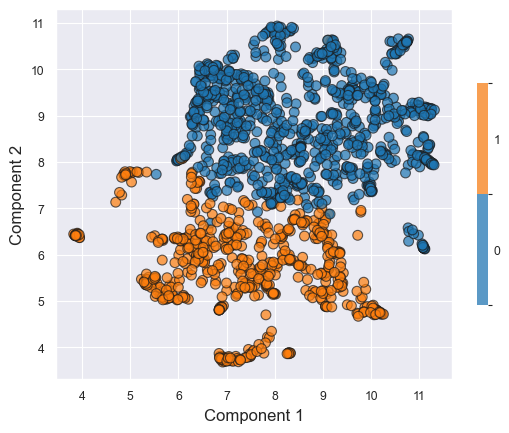

In [70]:
print('Unique labels for the K-medoids instance with the best parameters (TW euclidean):')
print(np.unique(kmedoids_TW.labels_dict[kmedoids_TW.best_parameters_silhouette]))


best_lambda = kmedoids_TW.best_parameters_silhouette[0]
distances_calculations.plot_embeddings(umaps_tw_2d_final[best_lambda]['embeddings'], 
                                       labels=kmedoids_TW.labels_dict[kmedoids_TW.best_parameters_silhouette])

#### Description of the clusters

##### Selecting the results to examine

In [71]:
trajectory_general_measures_night['kmedoids_tw_labels'] = kmedoids_TW.labels_dict[kmedoids_TW.best_parameters_silhouette]

##### Summary statistics by clusters

In [72]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='kmedoids_tw_labels',
                                             decimals=5)

kmedoids_tw_labels,0,1
count,953.0,627.0
"(tid, mean)",1.0,1.0
"(tid, std)",0.0,0.0
"(tid, min)",1.0,1.0
"(tid, max)",1.0,1.0
...,...,...
"(hdbscan_tw_labels, max)",1.0,1.0
"(kmedoids_tw_labels, mean)",0.0,1.0
"(kmedoids_tw_labels, std)",0.0,0.0
"(kmedoids_tw_labels, min)",0.0,1.0


##### Arrival and departure times

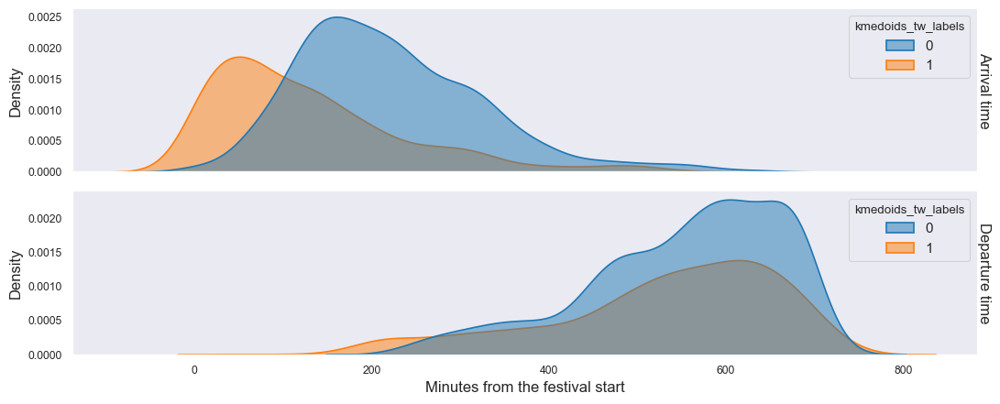

In [73]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='kmedoids_tw_labels')

#####  Distributions per column of interest

In [74]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [75]:
"""for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='kmedoids_tw_labels', interest_col=col_interest)"""

"for col_interest in columns_interest_distribution:\n    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='kmedoids_tw_labels', interest_col=col_interest)"

##### Scatter plots with regression

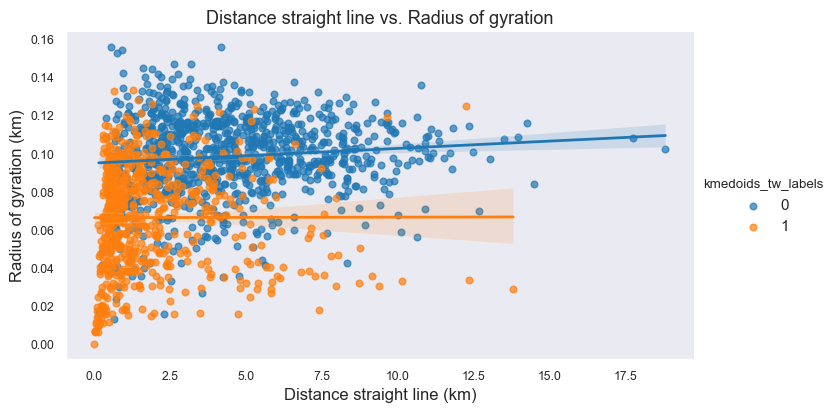

In [76]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_tw_labels')


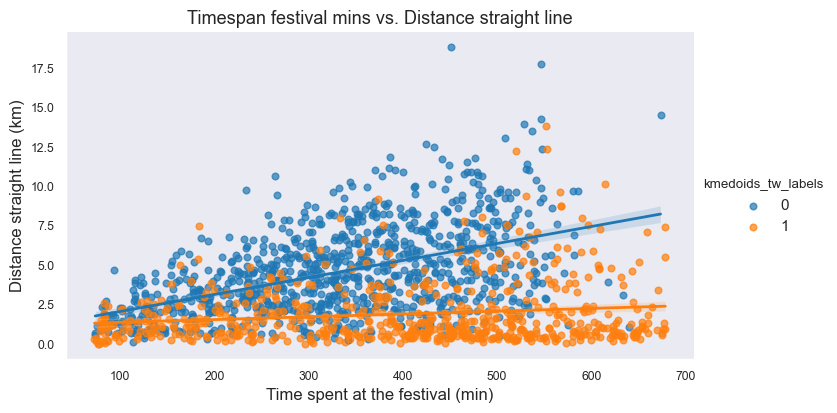

In [77]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='kmedoids_tw_labels')

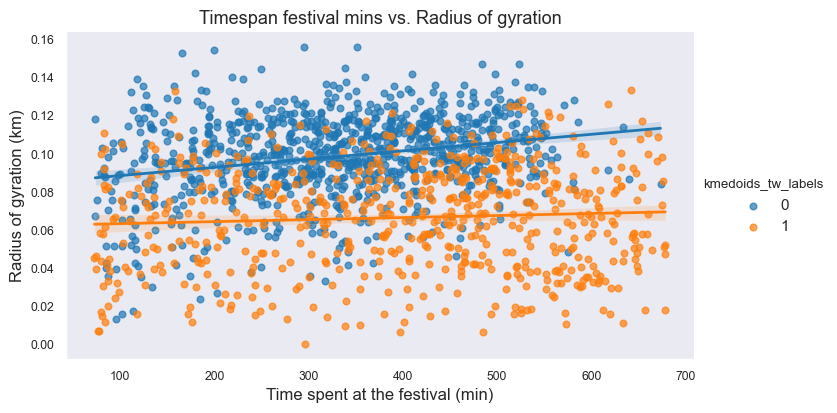

In [78]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_tw_labels')

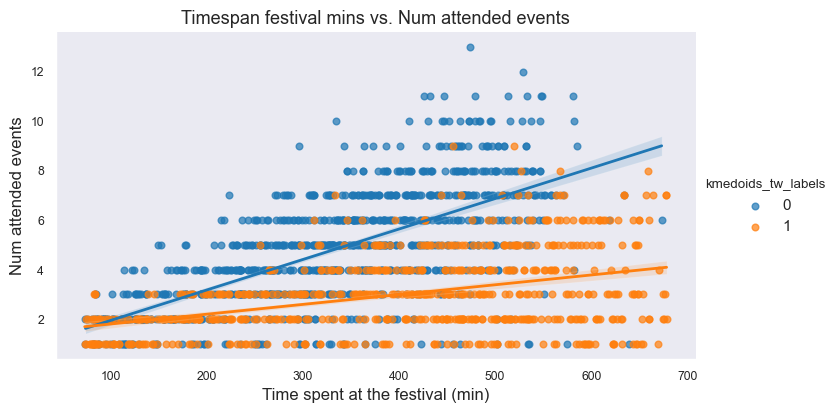

In [79]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='kmedoids_tw_labels')

##### Event rankings by cluster

In [80]:
"""description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='kmedoids_tw_labels')"""

"description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,\n                                                     clusters_col='kmedoids_tw_labels')"

In [81]:
"""description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='kmedoids_tw_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)"""

"description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,\n                                              clusters_col='kmedoids_tw_labels',\n                                              path_to_save=path_cluster_description,\n                                              show_plot=False)"

##### H3 counts plots per cluster

In [82]:
"""# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','kmedoids_tw_labels']],
                                                on=['uid','tid'],
                                                how='left')"""

"# Join the cluster labels to the full trajectory\ntrajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,\n                                                trajectory_general_measures_night[['uid','tid','kmedoids_tw_labels']],\n                                                on=['uid','tid'],\n                                                how='left')"

Plotting the observation counts by H3 cell and cluster.

In [83]:
"""description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='kmedoids_tw_labels', 
                                                     path_to_save=path_cluster_description)"""

"description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                     clusters_col='kmedoids_tw_labels', \n                                                     path_to_save=path_cluster_description)"

Plotting the user counts by H3 cell timeline by cluster.

In [84]:
"""description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='kmedoids_tw_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)"""

"description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                            clusters_col='kmedoids_tw_labels',\n                                                            window_duration='15min',\n                                                            path_to_save=path_cluster_description)"

##### Vendor name proportion

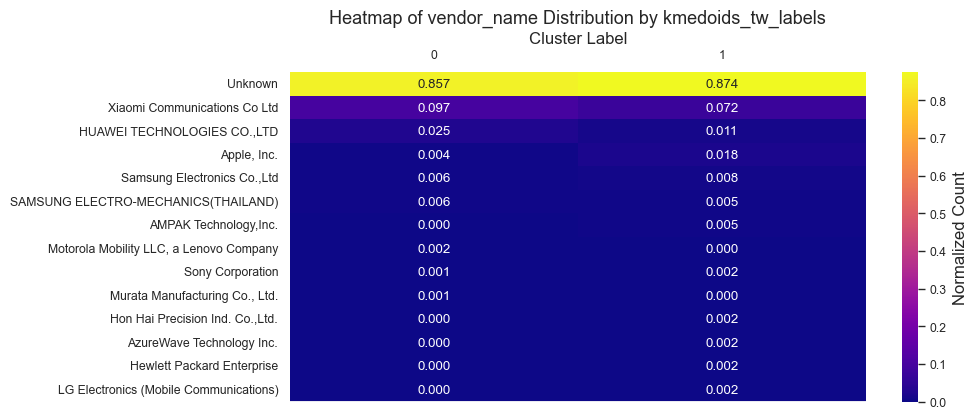

In [85]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'kmedoids_tw_labels')

##### People counts heatmap by cluster

In [86]:
"""description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='kmedoids_tw_labels')"""

"description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,\n                                                               clusters_col='kmedoids_tw_labels')"

## TW PCA euclidean and GF

### 2D UMAP embeddings (TW PCA)

As with the time window euclidean distances, the 2D UMAP embeddings are obtained for visualization.

In [87]:
umaps_tw_pca_2d_final_filename = os.path.join(path_distances_embeddings,f'umaps_tw_pca_2d_{n_neighbors_umap}neighbors.pkl')

In [88]:
with open(umaps_tw_pca_2d_final_filename, 'rb') as f:
    umaps_tw_pca_2d_final = pickle.load(f)
    print(f'Loaded UMAP distance embeddings from {umaps_tw_pca_2d_final_filename}')

Loaded UMAP distance embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_tw_pca_2d_25neighbors.pkl


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\distances_calculations.py:584: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  scatter = ax.scatter(embedding[:, 0], embedding[:, 1],


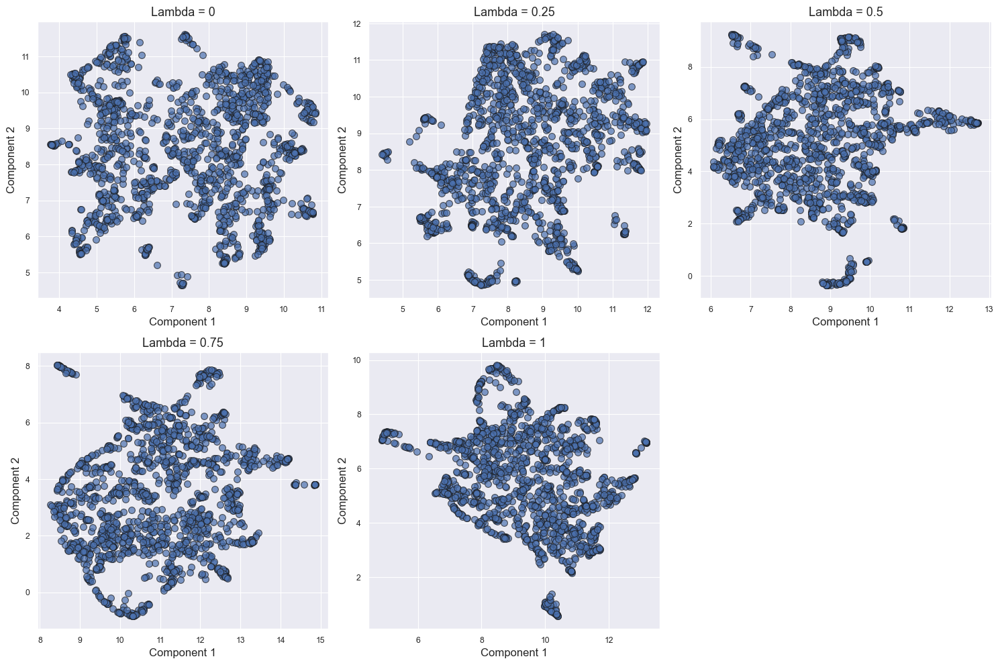

In [89]:
distances_calculations.plot_multiple_embeddings(multi_distances_embeddings=umaps_tw_pca_2d_final, cols=3)

### Higher-Dimensional UMAP Embeddings

Also, as with the time window euclidean distances, the same higher-dimensional umap embedding is used for clustering.

In [90]:
umaps_tw_pca_higher_d_final_filename = os.path.join(path_distances_embeddings,f'umaps_tw_pca_{n_components_umap_clustering}d_{n_neighbors_umap}neighbors.pkl')

In [91]:
with open(umaps_tw_pca_higher_d_final_filename, 'rb') as f:
        umaps_tw_pca_higher_d_final = pickle.load(f)
        print(f'Loaded UMAP embeddings from {umaps_tw_pca_higher_d_final_filename}')

Loaded UMAP embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_tw_pca_5d_25neighbors.pkl


### HDBSCAN

#### Experiment settings

I work with the same hyperparameter options that I used for the time window euclidean distances.

As a rule of thumb to later define the other hyperparameters, I try values from 1% to 5% of the data, which spread on a logarithmic scale.

In [92]:
min_cluster_sizes = generate_log_range_list(min_val = round(n_trajectories*0.01), max_val= 0.05 * n_trajectories, num_values=5)

I set `min_samples` to be proportions of `min_cluster_size`to see what works best.

In [93]:
min_samples_proportions = [0.16, 0.33, 0.66, 0.83, 1]

Note: this part is quite manual and depends on the visual assessment of the results obtained.

In [94]:
hdbscan_TW_PCA = hdbscan_experiment.HDBSCANExperiment(multi_distances_embeddings=umaps_tw_pca_higher_d_final,
                                                   min_cluster_sizes=min_cluster_sizes,
                                                   min_samples_proportions=min_samples_proportions)

print(f'Lambda values for consideration: {list(hdbscan_TW_PCA.multi_distances_embeddings.keys())}')
print(f'min_cluster_size values for consideration: {hdbscan_TW_PCA.min_cluster_sizes}')
print(f'min_samples_proportion values for consideration: {hdbscan_TW_PCA.min_samples_proportions}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
min_cluster_size values for consideration: [16, 23, 35, 52, 78]
min_samples_proportion values for consideration: [0.16, 0.33, 0.66, 0.83, 1]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [95]:
hdbscan_TW_PCA.run_multi_hdbscan()

print('\nHDBSCAN labels and counts:')
for key, labels in hdbscan_TW_PCA.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. HDBSCAN labels_dict was updated.

HDBSCAN labels and counts:
(0, 16, 0.16) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32],
      dtype=int64), array([349,  16,  24,  22,  35,  41,  57,  44,  60,  19,  38,  23,  18,
        56,  69,  16,  24,  21,  23,  57,  78,  22,  61,  35,  42,  16,
        17,  50,  18,  19,  36,  27,  92,  55], dtype=int64))
(0, 16, 0.33) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24], dtype=int64), array([345,  16,  24,  22,  44,  35,  40,  53,  54,  58,  18,  36,  56,
    

#### Cluster evaluation

##### DBCV scores

In [96]:
hdbscan_TW_PCA.compute_hdbscan_dbcv_scores()

print('\nHDBSCAN for TW_PCA - DBCV scores:')
hdbscan_TW_PCA.dbcv_scores_dict

DBCV scores computation is done. HDBSCAN dbcv_scores_dict was updated

HDBSCAN for TW_PCA - DBCV scores:


{(0, 16, 0.16): 0.43226883778468594,
 (0, 16, 0.33): 0.43382745424415753,
 (0, 16, 0.66): 0.5022021280080844,
 (0, 16, 0.83): 0.4764836283626293,
 (0, 16, 1): 0.5049081917457021,
 (0, 23, 0.16): 0.3144756741421562,
 (0, 23, 0.33): 0.4728589925454016,
 (0, 23, 0.66): 0.5096544096565402,
 (0, 23, 0.83): 0.5064559240174273,
 (0, 23, 1): 0.4626452280823299,
 (0, 35, 0.16): 0.3102323596972171,
 (0, 35, 0.33): 0.46737531717454783,
 (0, 35, 0.66): 0.4509668192013403,
 (0, 35, 0.83): 0.3991785415107116,
 (0, 35, 1): 0.4075171002685277,
 (0, 52, 0.16): 0.2659725467320413,
 (0, 52, 0.33): 0.39458076974835266,
 (0, 52, 0.66): 0.3883929427659446,
 (0, 52, 0.83): 0.36469213838085135,
 (0, 52, 1): 0.1948579889320825,
 (0, 78, 0.16): 0.40343190139282087,
 (0, 78, 0.33): 0.38324342608038026,
 (0, 78, 0.66): 0.16127412246116407,
 (0, 78, 0.83): 0.2225587558081373,
 (0, 78, 1): 0.26310479729878855,
 (0.25, 16, 0.16): 0.4738190982703738,
 (0.25, 16, 0.33): 0.5070147388583806,
 (0.25, 16, 0.66): 0.4553835

##### Silhouette scores

In [97]:
hdbscan_TW_PCA.compute_hdbscan_silhouette_scores()

print('\nHDBSCAN for TW_PCA - silhouette scores:')
hdbscan_TW_PCA.silhouette_scores_dict

Silhouette scores computation is done. HDBSCAN silhouette_scores_dict was updated

HDBSCAN for TW_PCA - silhouette scores:


{(0, 16, 0.16): 0.26245114,
 (0, 16, 0.33): 0.2567748,
 (0, 16, 0.66): 0.19307424,
 (0, 16, 0.83): 0.18393056,
 (0, 16, 1): 0.22393219,
 (0, 23, 0.16): 0.27742407,
 (0, 23, 0.33): 0.235777,
 (0, 23, 0.66): 0.20075965,
 (0, 23, 0.83): 0.21961017,
 (0, 23, 1): 0.14295201,
 (0, 35, 0.16): 0.18419865,
 (0, 35, 0.33): 0.21001813,
 (0, 35, 0.66): 0.13595724,
 (0, 35, 0.83): 0.14930414,
 (0, 35, 1): 0.117409796,
 (0, 52, 0.16): 0.15595819,
 (0, 52, 0.33): -0.040845085,
 (0, 52, 0.66): -0.043200355,
 (0, 52, 0.83): -0.02135523,
 (0, 52, 1): -0.008196851,
 (0, 78, 0.16): -0.035849422,
 (0, 78, 0.33): -0.04298892,
 (0, 78, 0.66): 0.025444608,
 (0, 78, 0.83): 0.054317866,
 (0, 78, 1): 0.021899983,
 (0.25, 16, 0.16): 0.3048538,
 (0.25, 16, 0.33): 0.26363173,
 (0.25, 16, 0.66): 0.28877586,
 (0.25, 16, 0.83): 0.30967796,
 (0.25, 16, 1): 0.27438906,
 (0.25, 23, 0.16): 0.24305432,
 (0.25, 23, 0.33): 0.1899005,
 (0.25, 23, 0.66): 0.27212676,
 (0.25, 23, 0.83): 0.26002523,
 (0.25, 23, 1): 0.13306783,
 (

##### Balanced clustering scores

In [98]:
# Compute the entropy of each clustering result
hdbscan_TW_PCA.compute_normalized_entropy()

print('\nHDBSCAN for TW_PCA - normalized entropies:')
hdbscan_TW_PCA.normalized_entropies_dict

Normalized entropy computation is done. HDBSCAN normalized_entropies_dict was updated

HDBSCAN for TW_PCA - normalized entropies:


{(0, 16, 0.16): 0.9613383892081813,
 (0, 16, 0.33): 0.9088320064958495,
 (0, 16, 0.66): 0.9697287890669765,
 (0, 16, 0.83): 0.9680611218062326,
 (0, 16, 1): 0.9505376704792657,
 (0, 23, 0.16): 0.9209369278361865,
 (0, 23, 0.33): 0.9313378980959014,
 (0, 23, 0.66): 0.9562765943135308,
 (0, 23, 0.83): 0.9495199412023915,
 (0, 23, 1): 0.9494524325955338,
 (0, 35, 0.16): 0.8400350567326509,
 (0, 35, 0.33): 0.9643905544706602,
 (0, 35, 0.66): 0.9253844211129041,
 (0, 35, 0.83): 0.941910598162271,
 (0, 35, 1): 0.9411018293334743,
 (0, 52, 0.16): 0.8223400778460657,
 (0, 52, 0.33): 0.3668592490407474,
 (0, 52, 0.66): 0.3809465857053901,
 (0, 52, 0.83): 0.38774318105598654,
 (0, 52, 1): 0.856381996648272,
 (0, 78, 0.16): 0.3584467747033072,
 (0, 78, 0.33): 0.37142707700314104,
 (0, 78, 0.66): 0.9051399997047649,
 (0, 78, 0.83): 0.9973806632063373,
 (0, 78, 1): 0.9814538950336537,
 (0.25, 16, 0.16): 0.9615339510497533,
 (0.25, 16, 0.33): 0.9633919486004918,
 (0.25, 16, 0.66): 0.9165869725808817

In [99]:
# Rescale the DBCV of each clustering result
hdbscan_TW_PCA.rescale_dbcv_scores()

print('\nHDBSCAN for TW_PCA - rescaled DBCV:')
hdbscan_TW_PCA.rescaled_dbcv_scores_dict

Rescaling of DBCV is done. HDBSCAN rescaled_dbcv_scores_dict was updated

HDBSCAN for TW_PCA - rescaled DBCV:


{(0, 16, 0.16): 0.716134418892343,
 (0, 16, 0.33): 0.7169137271220788,
 (0, 16, 0.66): 0.7511010640040422,
 (0, 16, 0.83): 0.7382418141813146,
 (0, 16, 1): 0.7524540958728511,
 (0, 23, 0.16): 0.6572378370710781,
 (0, 23, 0.33): 0.7364294962727008,
 (0, 23, 0.66): 0.75482720482827,
 (0, 23, 0.83): 0.7532279620087137,
 (0, 23, 1): 0.7313226140411649,
 (0, 35, 0.16): 0.6551161798486085,
 (0, 35, 0.33): 0.7336876585872739,
 (0, 35, 0.66): 0.7254834096006701,
 (0, 35, 0.83): 0.6995892707553558,
 (0, 35, 1): 0.7037585501342638,
 (0, 52, 0.16): 0.6329862733660206,
 (0, 52, 0.33): 0.6972903848741763,
 (0, 52, 0.66): 0.6941964713829722,
 (0, 52, 0.83): 0.6823460691904257,
 (0, 52, 1): 0.5974289944660413,
 (0, 78, 0.16): 0.7017159506964105,
 (0, 78, 0.33): 0.6916217130401902,
 (0, 78, 0.66): 0.580637061230582,
 (0, 78, 0.83): 0.6112793779040686,
 (0, 78, 1): 0.6315523986493943,
 (0.25, 16, 0.16): 0.7369095491351869,
 (0.25, 16, 0.33): 0.7535073694291903,
 (0.25, 16, 0.66): 0.7276917551198785,
 (

In [292]:
# Compute the balanced score

hdbscan_TW_PCA.compute_balanced_clustering_score(weight=0.5)

print('\nHDBSCAN for TW_PCA - ranked balanced clustering score:')
hdbscan_TW_PCA.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. HDBSCAN ranked_balanced_clustering_scores_dict was updated

HDBSCAN for TW_PCA - ranked balanced clustering score:


{(0.75, 16, 0.66): 0.8851357295307978,
 (0.75, 16, 0.83): 0.8741839375012643,
 (0.75, 23, 0.33): 0.8735649147458251,
 (0.75, 16, 0.33): 0.8731820420863995,
 (1, 16, 0.16): 0.8718583295846092,
 (1, 16, 0.66): 0.8711313116107736,
 (0.75, 23, 0.16): 0.8696468504974857,
 (1, 16, 0.33): 0.8685155270569931,
 (0.5, 16, 0.66): 0.8643814273124177,
 (0.75, 16, 1): 0.8637272096811187,
 (0.75, 16, 0.16): 0.8606119400820146,
 (0, 16, 0.66): 0.8604149265355093,
 (0.75, 23, 0.66): 0.8588226416144661,
 (0.25, 16, 0.33): 0.858449659014841,
 (0.5, 16, 0.33): 0.8565676670172755,
 (0.25, 23, 0.66): 0.856444232274518,
 (0.25, 35, 0.33): 0.8556090465829536,
 (0, 23, 0.66): 0.8555518995709004,
 (0.25, 16, 1): 0.8554779426922334,
 (0, 16, 0.83): 0.8531514679937736,
 (0.25, 23, 0.83): 0.85279549594232,
 (0.25, 23, 0.33): 0.8525577768888165,
 (0, 16, 1): 0.8514958831760584,
 (0, 23, 0.83): 0.8513739516055525,
 (0.25, 16, 0.16): 0.8492217500924701,
 (0, 35, 0.33): 0.8490391065289671,
 (0.5, 23, 0.33): 0.84837703

##### Best parameters based on the scores

Selecting the best parameters based on the DBCV score, the silhouette score and the balanced clustering score.

In [293]:
hdbscan_TW_PCA.update_best_params_and_score()

HDBSCAN updated best_parameters_silhouette are (0.75, 23, 1) with silhouette score = 0.44917529821395874
HDBSCAN updated best_parameters_dbcv are (0.75, 23, 1) with DBCV score = 0.8700558755514219
HDBSCAN updated best_parameters_bcs are (0.75, 16, 0.66) with BCS score = 0.8851357295307978


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the HDBSCAN instance with the best parameters with DBCV (TW_PCA):
[0 1]


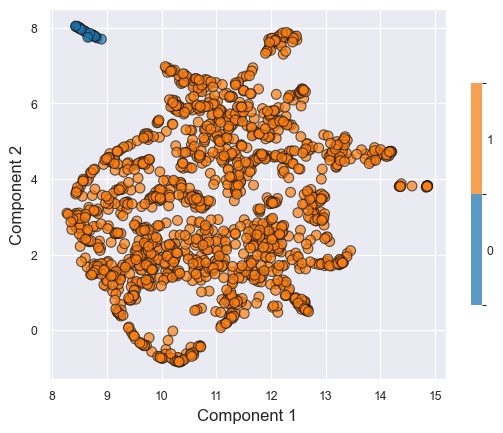

In [102]:
print('Unique labels for the HDBSCAN instance with the best parameters with DBCV (TW_PCA):')
print(np.unique(hdbscan_TW_PCA.labels_dict[hdbscan_TW_PCA.best_parameters_dbcv]))


best_lambda = hdbscan_TW_PCA.best_parameters_dbcv[0]
distances_calculations.plot_embeddings(umaps_tw_pca_2d_final[best_lambda]['embeddings'], labels=hdbscan_TW_PCA.labels_dict[hdbscan_TW_PCA.best_parameters_dbcv])

Unique labels for the HDBSCAN instance with the best parameters with BCS (TW_PCA):
[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29]


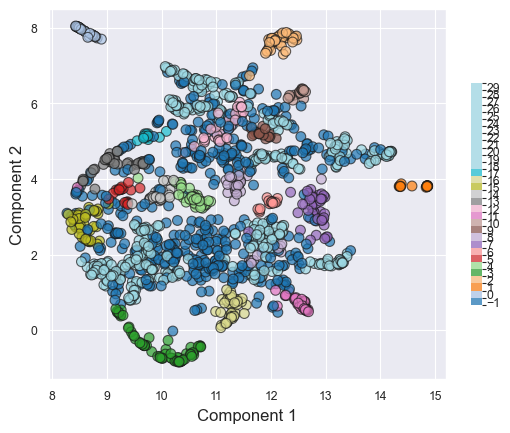

In [103]:
print('Unique labels for the HDBSCAN instance with the best parameters with BCS (TW_PCA):')
print(np.unique(hdbscan_TW_PCA.labels_dict[hdbscan_TW_PCA.best_parameters_bcs]))


best_lambda = hdbscan_TW_PCA.best_parameters_bcs[0]
distances_calculations.plot_embeddings(umaps_tw_pca_2d_final[best_lambda]['embeddings'], labels=hdbscan_TW_PCA.labels_dict[hdbscan_TW_PCA.best_parameters_bcs])

#### Description of the clusters

##### Selecting the results to examine

In [104]:
trajectory_general_measures_night['hdbscan_tw_pca_labels'] = hdbscan_TW_PCA.labels_dict[hdbscan_TW_PCA.best_parameters_dbcv]

##### Summary statistics by clusters

In [105]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='hdbscan_tw_pca_labels',
                                             decimals=5)

hdbscan_tw_pca_labels,0,1
count,39.0,1541.0
"(tid, mean)",1.0,1.0
"(tid, std)",0.0,0.0
"(tid, min)",1.0,1.0
"(tid, max)",1.0,1.0
...,...,...
"(kmedoids_tw_labels, max)",1.0,1.0
"(hdbscan_tw_pca_labels, mean)",0.0,1.0
"(hdbscan_tw_pca_labels, std)",0.0,0.0
"(hdbscan_tw_pca_labels, min)",0.0,1.0


##### Arrival and departure times

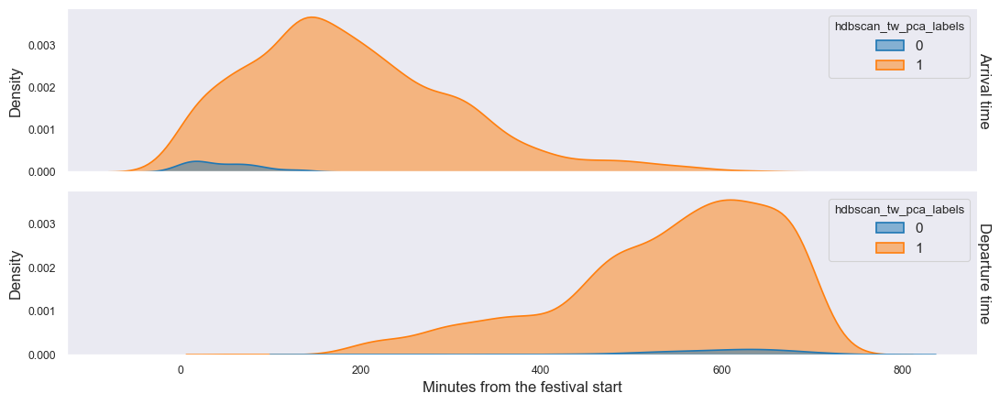

In [106]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='hdbscan_tw_pca_labels')

#####  Distributions per column of interest

In [107]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [108]:
"""for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, 
                                                    clusters_col='hdbscan_tw_pca_labels', 
                                                    interest_col=col_interest)"""

"for col_interest in columns_interest_distribution:\n    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, \n                                                    clusters_col='hdbscan_tw_pca_labels', \n                                                    interest_col=col_interest)"

##### Scatter plots with regression

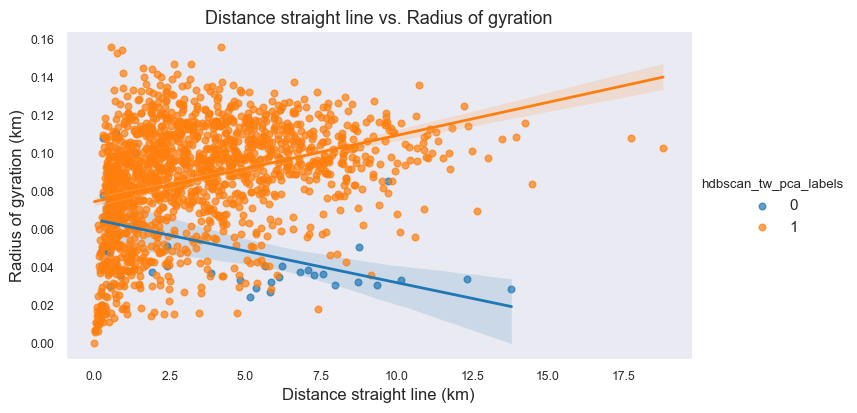

In [109]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_tw_pca_labels')


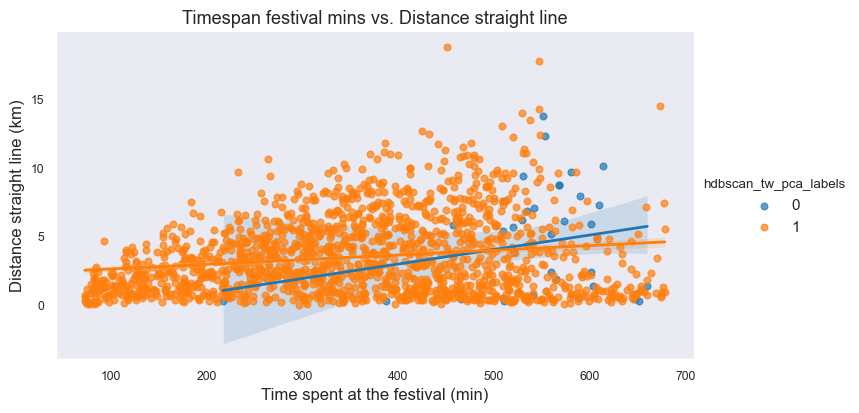

In [110]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='hdbscan_tw_pca_labels')

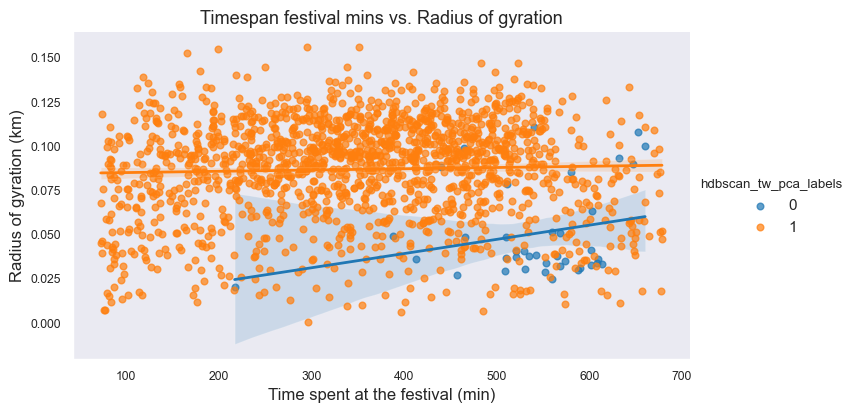

In [111]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_tw_pca_labels')

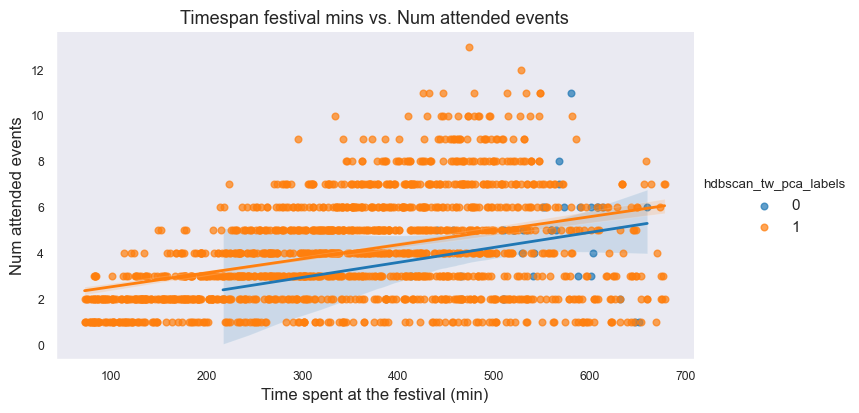

In [112]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='hdbscan_tw_pca_labels')

##### Event rankings by cluster

In [113]:
"""description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='hdbscan_tw_pca_labels')"""

"description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,\n                                                     clusters_col='hdbscan_tw_pca_labels')"

In [114]:
"""description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='hdbscan_tw_pca_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)"""

"description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,\n                                              clusters_col='hdbscan_tw_pca_labels',\n                                              path_to_save=path_cluster_description,\n                                              show_plot=False)"

- H3 counts plots per cluster

In [115]:
"""# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','hdbscan_tw_pca_labels']],
                                                on=['uid','tid'],
                                                how='left')"""

"# Join the cluster labels to the full trajectory\ntrajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,\n                                                trajectory_general_measures_night[['uid','tid','hdbscan_tw_pca_labels']],\n                                                on=['uid','tid'],\n                                                how='left')"

Plotting the observation counts by H3 cell and cluster.

In [116]:
"""description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='hdbscan_tw_pca_labels', 
                                                     path_to_save=path_cluster_description)"""

"description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                     clusters_col='hdbscan_tw_pca_labels', \n                                                     path_to_save=path_cluster_description)"

Plotting the user counts by H3 cell timeline by cluster.

In [117]:
"""description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='hdbscan_tw_pca_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)"""

"description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                            clusters_col='hdbscan_tw_pca_labels',\n                                                            window_duration='15min',\n                                                            path_to_save=path_cluster_description)"

##### Vendor name proportion

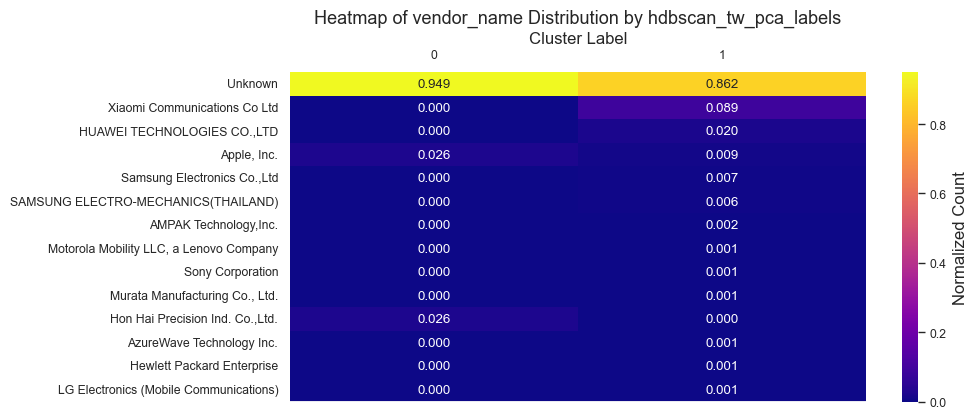

In [118]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'hdbscan_tw_pca_labels')


##### People counts heatmap by cluster

In [119]:
"""description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='hdbscan_tw_pca_labels')"""

"description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,\n                                                               clusters_col='hdbscan_tw_pca_labels')"

### K Medoids

#### Experiment settings

I work with the same hyperparameter options that I used for the time window euclidean distances.

In [120]:
kmedoids_TW_PCA = kmedoids_experiment.KMedoidsExperiment(multi_distances_embeddings=umaps_tw_pca_higher_d_final,
                                                     k_values=list(range(2,11)))

print(f'Lambda values for consideration: {list(kmedoids_TW_PCA.multi_distances_embeddings.keys())}')
print(f'k values for consideration: {kmedoids_TW_PCA.k_values}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
k values for consideration: [2, 3, 4, 5, 6, 7, 8, 9, 10]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [121]:
kmedoids_TW_PCA.run_multi_kmedoids()

print('\nK-medoids for DTW - labels:')
for key, labels in kmedoids_TW_PCA.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. K-medoids labels_dict was updated.

K-medoids for DTW - labels:
(0, 2) (array([0, 1], dtype=int64), array([722, 858], dtype=int64))
(0, 3) (array([0, 1, 2], dtype=int64), array([713, 484, 383], dtype=int64))
(0, 4) (array([0, 1, 2, 3], dtype=int64), array([246, 441, 354, 539], dtype=int64))
(0, 5) (array([0, 1, 2, 3, 4], dtype=int64), array([319, 302, 318, 297, 344], dtype=int64))
(0, 6) (array([0, 1, 2, 3, 4, 5], dtype=int64), array([311, 318, 280, 104, 279, 288], dtype=int64))
(0, 7) (array([0, 1, 2, 3, 4, 5, 6], dtype=int64), array([267, 224, 271, 106, 130, 254, 328], dtype=int64))
(0, 8) (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([106, 163, 271, 255, 120,

#### Cluster evaluation

##### Silhouette scores

In [122]:
kmedoids_TW_PCA.compute_kmedoids_silhouette_scores()

print('\K-medoids for DTW - silhouette scores:')
kmedoids_TW_PCA.silhouette_scores_dict

Silhouette scores computation is done. K-medoids silhouette_scores_dict was updated
\K-medoids for DTW - silhouette scores:


{(0, 2): 0.36522403,
 (0, 3): 0.34327763,
 (0, 4): 0.3204717,
 (0, 5): 0.3352023,
 (0, 6): 0.3564392,
 (0, 7): 0.3415144,
 (0, 8): 0.34066564,
 (0, 9): 0.30625242,
 (0, 10): 0.33565137,
 (0.25, 2): 0.37000296,
 (0.25, 3): 0.2829259,
 (0.25, 4): 0.30284953,
 (0.25, 5): 0.271183,
 (0.25, 6): 0.2888129,
 (0.25, 7): 0.27013406,
 (0.25, 8): 0.24263835,
 (0.25, 9): 0.24197553,
 (0.25, 10): 0.3096737,
 (0.5, 2): 0.35890627,
 (0.5, 3): 0.28282154,
 (0.5, 4): 0.22522846,
 (0.5, 5): 0.20740387,
 (0.5, 6): 0.21745215,
 (0.5, 7): 0.23004846,
 (0.5, 8): 0.24057078,
 (0.5, 9): 0.21761695,
 (0.5, 10): 0.2877837,
 (0.75, 2): 0.36293134,
 (0.75, 3): 0.28066376,
 (0.75, 4): 0.2522575,
 (0.75, 5): 0.2114289,
 (0.75, 6): 0.27773848,
 (0.75, 7): 0.25700092,
 (0.75, 8): 0.25674045,
 (0.75, 9): 0.27515525,
 (0.75, 10): 0.32382098,
 (1, 2): 0.32617697,
 (1, 3): 0.28537184,
 (1, 4): 0.2322803,
 (1, 5): 0.26358953,
 (1, 6): 0.25212803,
 (1, 7): 0.2191224,
 (1, 8): 0.25662273,
 (1, 9): 0.2769435,
 (1, 10): 0.300

##### DBCV scores

For completeness, the DBCV is. also computed for K-medoids.

In [123]:
kmedoids_TW_PCA.compute_kmedoids_dbcv_scores()

print('\K-medoids for TW_PCA - DBCV scores:')
kmedoids_TW_PCA.dbcv_scores_dict

DBCV scores computation is done. K-medoids dbcv_scores_dict was updated
\K-medoids for TW_PCA - DBCV scores:


{(0, 2): -0.937277443924815,
 (0, 3): -0.8551005265469294,
 (0, 4): -0.9577558213527934,
 (0, 5): -0.9781889260116,
 (0, 6): -0.9614399235858858,
 (0, 7): -0.8649345287310484,
 (0, 8): -0.8928913778801046,
 (0, 9): -0.81309805520873,
 (0, 10): -0.8309604355374174,
 (0.25, 2): -0.9800538568807743,
 (0.25, 3): -0.9622224143014044,
 (0.25, 4): -0.9217518977920529,
 (0.25, 5): -0.9684071418040718,
 (0.25, 6): -0.9065472748250916,
 (0.25, 7): -0.8648801801438951,
 (0.25, 8): -0.9010896194812957,
 (0.25, 9): -0.8792729965134932,
 (0.25, 10): -0.8472492149781443,
 (0.5, 2): -0.9408697125499846,
 (0.5, 3): -0.965798368983608,
 (0.5, 4): -0.9723104793087953,
 (0.5, 5): -0.9697264557540738,
 (0.5, 6): -0.9792086739578593,
 (0.5, 7): -0.9267349162995954,
 (0.5, 8): -0.9165393343603351,
 (0.5, 9): -0.8749498574541118,
 (0.5, 10): -0.7690815202121091,
 (0.75, 2): -0.9739467597108128,
 (0.75, 3): -0.973122268664558,
 (0.75, 4): -0.9706744615205789,
 (0.75, 5): -0.9631517573316849,
 (0.75, 6): -0.968

##### Balanced clustering scores

In [124]:
# Compute the entropy of each clustering result
kmedoids_TW_PCA.compute_normalized_entropy()

print('\nK-medoids for TW_PCA - normalized entropies:')
kmedoids_TW_PCA.normalized_entropies_dict

Normalized entropy computation is done. K-medoids normalized_entropies_dict was updated

K-medoids for TW_PCA - normalized entropies:


{(0, 2): 0.9946488671232326,
 (0, 3): 0.9694150601313486,
 (0, 4): 0.9722287416723273,
 (0, 5): 0.9991648398625894,
 (0, 6): 0.9737893780610896,
 (0, 7): 0.9696126269736051,
 (0, 8): 0.9721463643741429,
 (0, 9): 0.95828610740803,
 (0, 10): 0.9127617776171814,
 (0.25, 2): 0.9893215867675924,
 (0.25, 3): 0.9967381858660501,
 (0.25, 4): 0.964971030601746,
 (0.25, 5): 0.971690482874105,
 (0.25, 6): 0.9426028909208203,
 (0.25, 7): 0.9316043584160721,
 (0.25, 8): 0.9213447874538606,
 (0.25, 9): 0.9080158314930978,
 (0.25, 10): 0.9404476187449788,
 (0.5, 2): 0.9643076711218308,
 (0.5, 3): 0.977380257508917,
 (0.5, 4): 0.9658758410395564,
 (0.5, 5): 0.9834957929919778,
 (0.5, 6): 0.977134946253232,
 (0.5, 7): 0.9723468626013769,
 (0.5, 8): 0.966649870319518,
 (0.5, 9): 0.9582712956977266,
 (0.5, 10): 0.9448994190052266,
 (0.75, 2): 0.959635359511475,
 (0.75, 3): 0.8903788754048159,
 (0.75, 4): 0.9599166609309353,
 (0.75, 5): 0.9672065009872167,
 (0.75, 6): 0.9463284361105759,
 (0.75, 7): 0.947

In [125]:
# Rescale the silhouette of each clustering result
kmedoids_TW_PCA.rescale_silhouette_scores()

print('\nK-medoids for TW_PCA - rescaled silhouette:')
kmedoids_TW_PCA.rescaled_silhouette_scores_dict

Rescaling of silhouette is done. K-medoids rescaled_silhouette_scores_dict was updated

K-medoids for TW_PCA - rescaled silhouette:


{(0, 2): 0.6826120167970657,
 (0, 3): 0.6716388165950775,
 (0, 4): 0.6602358520030975,
 (0, 5): 0.667601153254509,
 (0, 6): 0.6782196015119553,
 (0, 7): 0.6707572042942047,
 (0, 8): 0.6703328192234039,
 (0, 9): 0.6531262099742889,
 (0, 10): 0.6678256839513779,
 (0.25, 2): 0.685001477599144,
 (0.25, 3): 0.6414629518985748,
 (0.25, 4): 0.651424765586853,
 (0.25, 5): 0.6355915069580078,
 (0.25, 6): 0.6444064527750015,
 (0.25, 7): 0.635067030787468,
 (0.25, 8): 0.6213191747665405,
 (0.25, 9): 0.6209877654910088,
 (0.25, 10): 0.6548368483781815,
 (0.5, 2): 0.6794531345367432,
 (0.5, 3): 0.641410768032074,
 (0.5, 4): 0.6126142293214798,
 (0.5, 5): 0.6037019342184067,
 (0.5, 6): 0.6087260767817497,
 (0.5, 7): 0.6150242313742638,
 (0.5, 8): 0.6202853918075562,
 (0.5, 9): 0.6088084727525711,
 (0.5, 10): 0.6438918560743332,
 (0.75, 2): 0.681465670466423,
 (0.75, 3): 0.6403318792581558,
 (0.75, 4): 0.6261287480592728,
 (0.75, 5): 0.6057144477963448,
 (0.75, 6): 0.6388692408800125,
 (0.75, 7): 0.6

In [296]:
# Compute the balanced score

kmedoids_TW_PCA.compute_balanced_clustering_score(weight=0.5)

print('\K-medoids for TW_PCA - ranked balanced clustering score:')
kmedoids_TW_PCA.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. K-medoids ranked_balanced_clustering_scores_dict was updated
\K-medoids for TW_PCA - ranked balanced clustering score:


{(0, 2): 0.8386304419601491,
 (0.25, 2): 0.8371615321833682,
 (0, 5): 0.8333829965585492,
 (0, 6): 0.8260044897865224,
 (0.5, 2): 0.821880402829287,
 (0, 8): 0.8212395917987734,
 (0.75, 2): 0.820550514988949,
 (0, 3): 0.820526938363213,
 (0, 7): 0.8201849156339049,
 (1, 3): 0.8194460333681571,
 (1, 2): 0.8191544089404135,
 (0.25, 3): 0.8191005688823125,
 (0, 4): 0.8162322968377125,
 (1, 10): 0.8126799626308403,
 (0.5, 3): 0.8093955127704955,
 (1, 9): 0.8084168373067016,
 (0.25, 4): 0.8081978980942995,
 (0, 9): 0.8057061586911595,
 (1, 5): 0.8048511733393577,
 (0.25, 5): 0.8036409949160563,
 (0.75, 10): 0.8016703144834415,
 (1, 6): 0.8006942904283814,
 (1, 8): 0.8006763756603881,
 (1, 7): 0.7983903493044083,
 (0.25, 10): 0.7976422335615801,
 (0.75, 8): 0.7956845487835273,
 (0.5, 10): 0.7943956375397798,
 (0.5, 7): 0.7936855469878203,
 (0.5, 5): 0.7935988636051923,
 (0.25, 6): 0.7935046718479108,
 (0.5, 8): 0.7934676310635371,
 (0.75, 4): 0.793022704495104,
 (0.5, 6): 0.7929305115174909,

Selecting the best parameters based on the silhouette score.

In [297]:
kmedoids_TW_PCA.update_best_params_and_score()

K-medoids updated best_parameters are (0.25, 2) with silhouette score = 0.37000295519828796
K-medoids updated best_parameters_bcs are (0, 2) with BCS score = 0.8386304419601491


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the K-medoids instance with the best parameters (TW PCA):
[0 1]


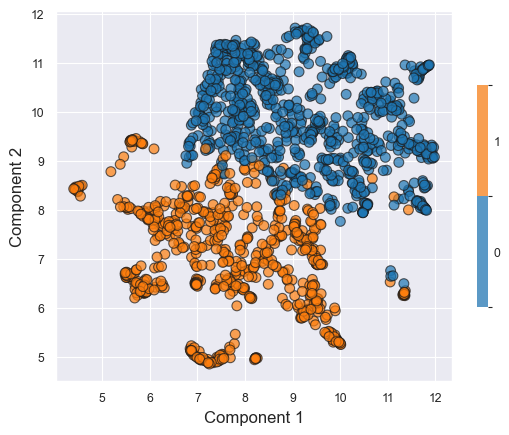

In [128]:
print('Unique labels for the K-medoids instance with the best parameters (TW PCA):')
print(np.unique(kmedoids_TW_PCA.labels_dict[kmedoids_TW_PCA.best_parameters_silhouette]))


best_lambda = kmedoids_TW_PCA.best_parameters_silhouette[0]
distances_calculations.plot_embeddings(umaps_tw_pca_2d_final[best_lambda]['embeddings'], 
                                       labels=kmedoids_TW_PCA.labels_dict[kmedoids_TW_PCA.best_parameters_silhouette])

#### Description of the clusters

##### Selecting the results to examine

In [129]:
trajectory_general_measures_night['kmedoids_twpca_labels'] = kmedoids_TW_PCA.labels_dict[kmedoids_TW_PCA.best_parameters_silhouette]

##### Summary statistics by clusters

In [130]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='kmedoids_twpca_labels',
                                             decimals=5)

kmedoids_twpca_labels,0,1
count,886.0,694.0
"(tid, mean)",1.0,1.0
"(tid, std)",0.0,0.0
"(tid, min)",1.0,1.0
"(tid, max)",1.0,1.0
...,...,...
"(hdbscan_tw_pca_labels, max)",1.0,1.0
"(kmedoids_twpca_labels, mean)",0.0,1.0
"(kmedoids_twpca_labels, std)",0.0,0.0
"(kmedoids_twpca_labels, min)",0.0,1.0


##### Arrival and departure times

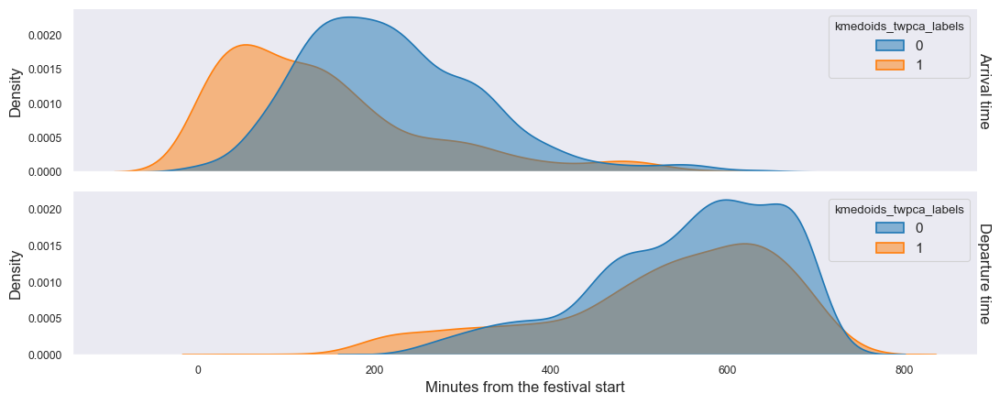

In [131]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='kmedoids_twpca_labels')

#####  Distributions per column of interest

In [132]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [133]:
"""for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='kmedoids_twpca_labels', interest_col=col_interest)"""

"for col_interest in columns_interest_distribution:\n    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='kmedoids_twpca_labels', interest_col=col_interest)"

##### Scatter plots with regression

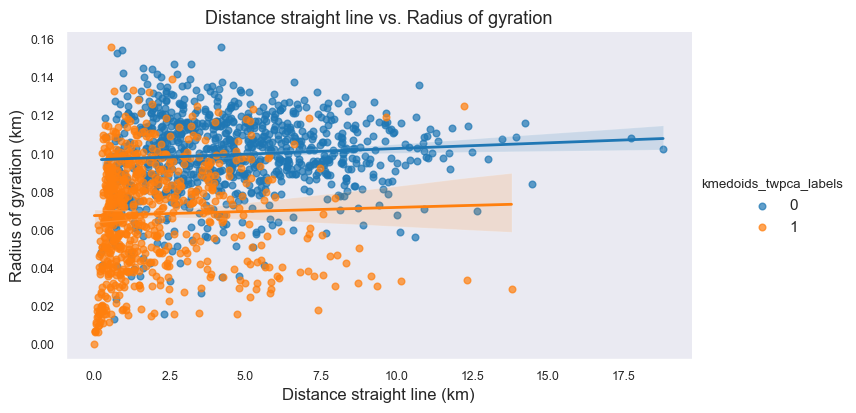

In [134]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_twpca_labels')


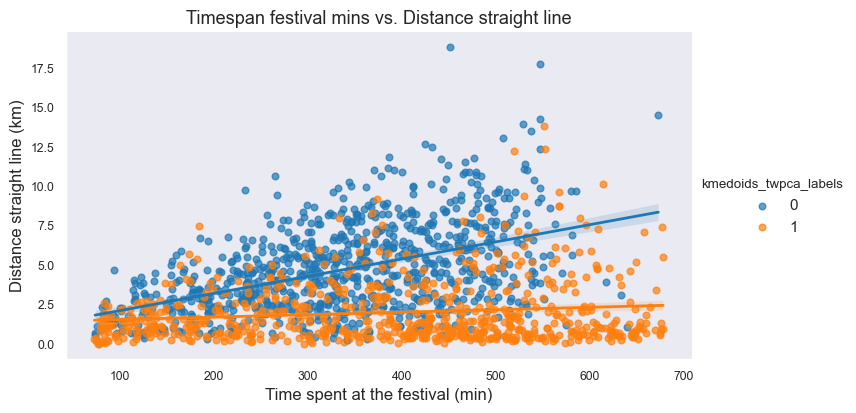

In [135]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='kmedoids_twpca_labels')

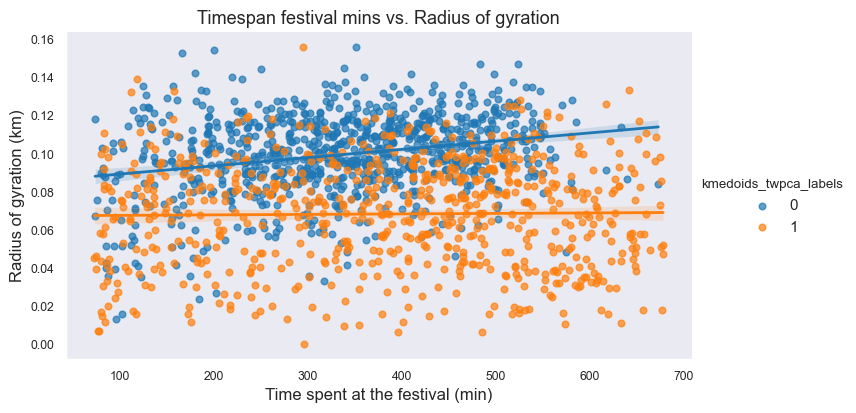

In [136]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_twpca_labels')

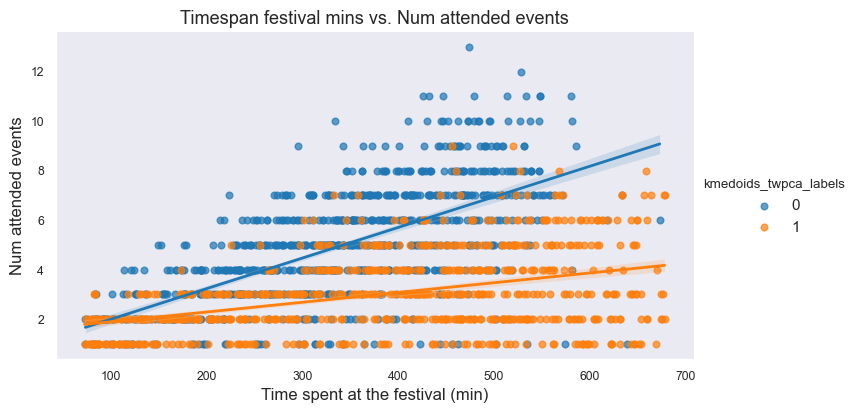

In [137]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='kmedoids_twpca_labels')

##### Event rankings by cluster

In [138]:
"""description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='kmedoids_twpca_labels')"""

"description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,\n                                                     clusters_col='kmedoids_twpca_labels')"

In [139]:
"""description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='kmedoids_twpca_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)"""

"description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,\n                                              clusters_col='kmedoids_twpca_labels',\n                                              path_to_save=path_cluster_description,\n                                              show_plot=False)"

##### H3 counts plots per cluster

In [140]:
"""# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','kmedoids_twpca_labels']],
                                                on=['uid','tid'],
                                                how='left')"""

"# Join the cluster labels to the full trajectory\ntrajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,\n                                                trajectory_general_measures_night[['uid','tid','kmedoids_twpca_labels']],\n                                                on=['uid','tid'],\n                                                how='left')"

Plotting the observation counts by H3 cell and cluster.

In [141]:
"""description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='kmedoids_twpca_labels', 
                                                     path_to_save=path_cluster_description)"""

"description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                     clusters_col='kmedoids_twpca_labels', \n                                                     path_to_save=path_cluster_description)"

Plotting the user counts by H3 cell timeline by cluster.

In [142]:
"""description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='kmedoids_twpca_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)"""

"description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                            clusters_col='kmedoids_twpca_labels',\n                                                            window_duration='15min',\n                                                            path_to_save=path_cluster_description)"

##### Vendor name proportion

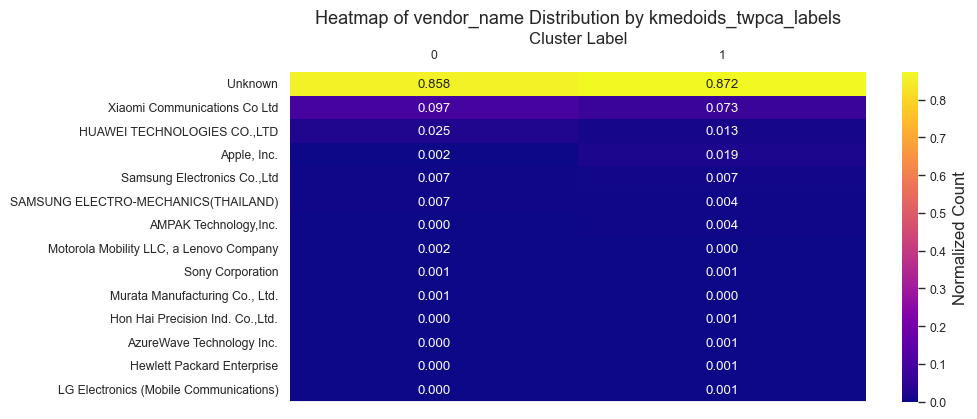

In [143]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'kmedoids_twpca_labels')


##### People counts heatmap by cluster

In [144]:
"""description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='kmedoids_twpca_labels')"""

"description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,\n                                                               clusters_col='kmedoids_twpca_labels')"

## DTW and GF

### 2D UMAP embeddings (DTW)

As with the time window euclidean distances, the 2D UMAP embeddings are obtained for visualization.

In [32]:
umaps_dtw_2d_final_filename = os.path.join(path_distances_embeddings,f'umaps_dtw_2d_{n_neighbors_umap}neighbors.pkl')

In [33]:
with open(umaps_dtw_2d_final_filename, 'rb') as f:
    umaps_dtw_2d_final = pickle.load(f)
    print(f'Loaded UMAP distance embeddings from {umaps_dtw_2d_final_filename}')

Loaded UMAP distance embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_dtw_2d_25neighbors.pkl


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\distances_calculations.py:600: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  scatter = ax.scatter(embedding[:, 0], embedding[:, 1],


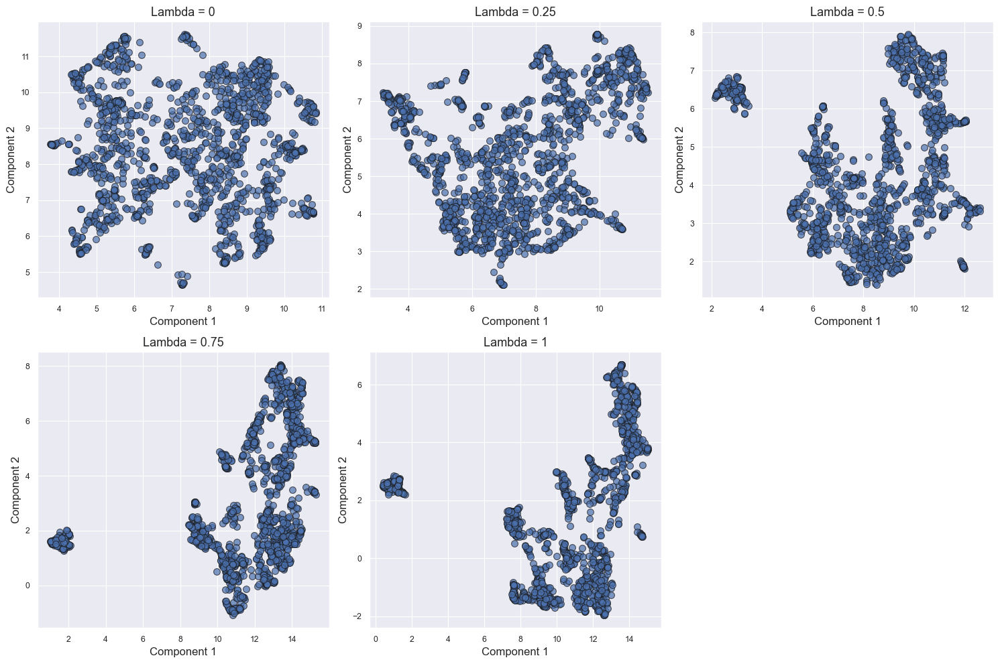

In [34]:
distances_calculations.plot_multiple_embeddings(multi_distances_embeddings=umaps_dtw_2d_final, cols=3)

### Higher-Dimensional UMAP Embeddings

Also, as with the time window euclidean distances, the same higher-dimensional umap embedding is used for clustering.

In [35]:
umaps_dtw_higher_d_final_filename = os.path.join(path_distances_embeddings,f'umaps_dtw_{n_components_umap_clustering}d_{n_neighbors_umap}neighbors.pkl')

In [36]:
with open(umaps_dtw_higher_d_final_filename, 'rb') as f:
        umaps_dtw_higher_d_final = pickle.load(f)
        print(f'Loaded UMAP embeddings from {umaps_dtw_higher_d_final_filename}')

Loaded UMAP embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_dtw_5d_25neighbors.pkl


### HDBSCAN

#### Experiment settings

I work with the same hyperparameter options that I used for the time window euclidean distances.

As a rule of thumb to later define the other hyperparameters, I try values from 1% to 5% of the data, which spread on a logarithmic scale.

In [37]:
min_cluster_sizes = generate_log_range_list(min_val = round(n_trajectories*0.01), max_val= 0.05 * n_trajectories, num_values=5)

I set `min_samples` to be proportions of `min_cluster_size`to see what works best.

In [38]:
min_samples_proportions = [0.16, 0.33, 0.66, 0.83, 1]

In [39]:
hdbscan_DTW = hdbscan_experiment.HDBSCANExperiment(multi_distances_embeddings=umaps_dtw_higher_d_final,
                                                   min_cluster_sizes=min_cluster_sizes,
                                                   min_samples_proportions=min_samples_proportions)

print(f'Lambda values for consideration: {list(hdbscan_DTW.multi_distances_embeddings.keys())}')
print(f'min_cluster_size values for consideration: {hdbscan_DTW.min_cluster_sizes}')
print(f'min_samples_proportion values for consideration: {hdbscan_DTW.min_samples_proportions}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
min_cluster_size values for consideration: [16, 23, 35, 52, 78]
min_samples_proportion values for consideration: [0.16, 0.33, 0.66, 0.83, 1]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [40]:
hdbscan_DTW.run_multi_hdbscan(hdbscan_params={'branch_detection_data':True})

print('\nHDBSCAN labels and counts:')
for key, labels in hdbscan_DTW.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. HDBSCAN labels_dict was updated.

HDBSCAN labels and counts:
(0, 16, 0.16) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32],
      dtype=int64), array([349,  16,  24,  22,  35,  41,  57,  44,  60,  19,  38,  23,  18,
        56,  69,  16,  24,  21,  23,  57,  78,  22,  61,  35,  42,  16,
        17,  50,  18,  19,  36,  27,  92,  55], dtype=int64))
(0, 16, 0.33) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24], dtype=int64), array([345,  16,  24,  22,  44,  35,  40,  53,  54,  58,  18,  36,  56,
    

#### Cluster evaluation

##### DBCV scores

In [41]:
hdbscan_DTW.compute_hdbscan_dbcv_scores()

print('\nHDBSCAN for DTW - DBCV scores:')
hdbscan_DTW.dbcv_scores_dict

DBCV scores computation is done. HDBSCAN dbcv_scores_dict was updated

HDBSCAN for DTW - DBCV scores:


{(0, 16, 0.16): 0.43226883778468594,
 (0, 16, 0.33): 0.43382745424415753,
 (0, 16, 0.66): 0.5022021280080844,
 (0, 16, 0.83): 0.4764836283626293,
 (0, 16, 1): 0.5049081917457021,
 (0, 23, 0.16): 0.3144756741421562,
 (0, 23, 0.33): 0.4728589925454016,
 (0, 23, 0.66): 0.5096544096565402,
 (0, 23, 0.83): 0.5064559240174273,
 (0, 23, 1): 0.4626452280823299,
 (0, 35, 0.16): 0.3102323596972171,
 (0, 35, 0.33): 0.46737531717454783,
 (0, 35, 0.66): 0.4509668192013403,
 (0, 35, 0.83): 0.3991785415107116,
 (0, 35, 1): 0.4075171002685277,
 (0, 52, 0.16): 0.2659725467320413,
 (0, 52, 0.33): 0.39458076974835266,
 (0, 52, 0.66): 0.3883929427659446,
 (0, 52, 0.83): 0.36469213838085135,
 (0, 52, 1): 0.1948579889320825,
 (0, 78, 0.16): 0.40343190139282087,
 (0, 78, 0.33): 0.38324342608038026,
 (0, 78, 0.66): 0.16127412246116407,
 (0, 78, 0.83): 0.2225587558081373,
 (0, 78, 1): 0.26310479729878855,
 (0.25, 16, 0.16): 0.41859088164720937,
 (0.25, 16, 0.33): 0.45323016749486944,
 (0.25, 16, 0.66): 0.57233

##### Silhouette scores

In [42]:
hdbscan_DTW.compute_hdbscan_silhouette_scores()

print('\nHDBSCAN for DTW - silhouette scores:')
hdbscan_DTW.silhouette_scores_dict

Silhouette scores computation is done. HDBSCAN silhouette_scores_dict was updated

HDBSCAN for DTW - silhouette scores:


{(0, 16, 0.16): 0.26245114,
 (0, 16, 0.33): 0.2567748,
 (0, 16, 0.66): 0.19307424,
 (0, 16, 0.83): 0.18393056,
 (0, 16, 1): 0.22393219,
 (0, 23, 0.16): 0.27742407,
 (0, 23, 0.33): 0.235777,
 (0, 23, 0.66): 0.20075965,
 (0, 23, 0.83): 0.21961017,
 (0, 23, 1): 0.14295201,
 (0, 35, 0.16): 0.18419865,
 (0, 35, 0.33): 0.21001813,
 (0, 35, 0.66): 0.13595724,
 (0, 35, 0.83): 0.14930414,
 (0, 35, 1): 0.117409796,
 (0, 52, 0.16): 0.15595819,
 (0, 52, 0.33): -0.040845085,
 (0, 52, 0.66): -0.043200355,
 (0, 52, 0.83): -0.02135523,
 (0, 52, 1): -0.008196851,
 (0, 78, 0.16): -0.035849422,
 (0, 78, 0.33): -0.04298892,
 (0, 78, 0.66): 0.025444608,
 (0, 78, 0.83): 0.054317866,
 (0, 78, 1): 0.021899983,
 (0.25, 16, 0.16): 0.17597935,
 (0.25, 16, 0.33): 0.17531055,
 (0.25, 16, 0.66): 0.25901186,
 (0.25, 16, 0.83): 0.23660885,
 (0.25, 16, 1): 0.22473407,
 (0.25, 23, 0.16): 0.14689045,
 (0.25, 23, 0.33): 0.2567,
 (0.25, 23, 0.66): 0.26809132,
 (0.25, 23, 0.83): 0.22899061,
 (0.25, 23, 1): 0.20298398,
 (0.

##### Balanced clustering scores

In [43]:
# Compute the entropy of each clustering result
hdbscan_DTW.compute_normalized_entropy()

print('\nHDBSCAN for DTW - normalized entropies:')
hdbscan_DTW.normalized_entropies_dict

Normalized entropy computation is done. HDBSCAN normalized_entropies_dict was updated

HDBSCAN for DTW - normalized entropies:


{(0, 16, 0.16): 0.9613383892081813,
 (0, 16, 0.33): 0.9088320064958495,
 (0, 16, 0.66): 0.9697287890669765,
 (0, 16, 0.83): 0.9680611218062326,
 (0, 16, 1): 0.9505376704792657,
 (0, 23, 0.16): 0.9209369278361865,
 (0, 23, 0.33): 0.9313378980959014,
 (0, 23, 0.66): 0.9562765943135308,
 (0, 23, 0.83): 0.9495199412023915,
 (0, 23, 1): 0.9494524325955338,
 (0, 35, 0.16): 0.8400350567326509,
 (0, 35, 0.33): 0.9643905544706602,
 (0, 35, 0.66): 0.9253844211129041,
 (0, 35, 0.83): 0.941910598162271,
 (0, 35, 1): 0.9411018293334743,
 (0, 52, 0.16): 0.8223400778460657,
 (0, 52, 0.33): 0.3668592490407474,
 (0, 52, 0.66): 0.3809465857053901,
 (0, 52, 0.83): 0.38774318105598654,
 (0, 52, 1): 0.856381996648272,
 (0, 78, 0.16): 0.3584467747033072,
 (0, 78, 0.33): 0.37142707700314104,
 (0, 78, 0.66): 0.9051399997047649,
 (0, 78, 0.83): 0.9973806632063373,
 (0, 78, 1): 0.9814538950336537,
 (0.25, 16, 0.16): 0.9727379643529819,
 (0.25, 16, 0.33): 0.9637498868952318,
 (0.25, 16, 0.66): 0.841255910981398,

In [44]:
# Rescale the DBCV of each clustering result
hdbscan_DTW.rescale_dbcv_scores()

print('\nHDBSCAN for DTW - rescaled DBCV:')
hdbscan_DTW.rescaled_dbcv_scores_dict

Rescaling of DBCV is done. HDBSCAN rescaled_dbcv_scores_dict was updated

HDBSCAN for DTW - rescaled DBCV:


{(0, 16, 0.16): 0.716134418892343,
 (0, 16, 0.33): 0.7169137271220788,
 (0, 16, 0.66): 0.7511010640040422,
 (0, 16, 0.83): 0.7382418141813146,
 (0, 16, 1): 0.7524540958728511,
 (0, 23, 0.16): 0.6572378370710781,
 (0, 23, 0.33): 0.7364294962727008,
 (0, 23, 0.66): 0.75482720482827,
 (0, 23, 0.83): 0.7532279620087137,
 (0, 23, 1): 0.7313226140411649,
 (0, 35, 0.16): 0.6551161798486085,
 (0, 35, 0.33): 0.7336876585872739,
 (0, 35, 0.66): 0.7254834096006701,
 (0, 35, 0.83): 0.6995892707553558,
 (0, 35, 1): 0.7037585501342638,
 (0, 52, 0.16): 0.6329862733660206,
 (0, 52, 0.33): 0.6972903848741763,
 (0, 52, 0.66): 0.6941964713829722,
 (0, 52, 0.83): 0.6823460691904257,
 (0, 52, 1): 0.5974289944660413,
 (0, 78, 0.16): 0.7017159506964105,
 (0, 78, 0.33): 0.6916217130401902,
 (0, 78, 0.66): 0.580637061230582,
 (0, 78, 0.83): 0.6112793779040686,
 (0, 78, 1): 0.6315523986493943,
 (0.25, 16, 0.16): 0.7092954408236047,
 (0.25, 16, 0.33): 0.7266150837474348,
 (0.25, 16, 0.66): 0.7861680369326702,
 (

In [45]:
# Compute the balanced score

hdbscan_DTW.compute_balanced_clustering_score(weight=0.5)

print('\nHDBSCAN for DTW - ranked balanced clustering score:')
hdbscan_DTW.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. HDBSCAN ranked_balanced_clustering_scores_dict was updated

HDBSCAN for DTW - ranked balanced clustering score:


{(0.75, 23, 0.83): 0.8920091579766898,
 (1, 23, 0.83): 0.8913521263079238,
 (1, 23, 0.33): 0.8913516333464555,
 (0.75, 23, 0.33): 0.88877195635031,
 (1, 23, 1): 0.8881949704444592,
 (1, 16, 1): 0.8865057285485538,
 (1, 23, 0.66): 0.8791918329059344,
 (0.75, 23, 0.66): 0.8774509988973208,
 (0.75, 23, 1): 0.8769480912522589,
 (1, 52, 0.16): 0.8763562114144315,
 (0.75, 16, 0.83): 0.8758510701929223,
 (0.75, 35, 0.16): 0.8736661913192598,
 (0.75, 35, 0.33): 0.8722225531522468,
 (0.5, 23, 0.83): 0.86924618432637,
 (0.75, 16, 1): 0.8682317018124711,
 (1, 35, 0.16): 0.867272078016426,
 (0.5, 23, 0.66): 0.8672696584237154,
 (1, 35, 1): 0.863981447650543,
 (0.5, 16, 0.33): 0.8628060652483254,
 (0.75, 23, 0.16): 0.8615233001993909,
 (0, 16, 0.66): 0.8604149265355093,
 (0.75, 16, 0.33): 0.8593174378705444,
 (0.5, 16, 1): 0.8587825043908982,
 (1, 16, 0.83): 0.8583759387816796,
 (1, 16, 0.66): 0.8560648347169008,
 (0.5, 16, 0.66): 0.8559300501749548,
 (0, 23, 0.66): 0.8555518995709004,
 (0, 16, 0.8

##### Best parameters based on the scores

Selecting the best parameters based on the DBCV score, the silhouette score and the balanced clustering score.

In [46]:
hdbscan_DTW.update_best_params_and_score()

HDBSCAN updated best_parameters_silhouette are (1, 35, 0.33) with silhouette score = 0.7461655139923096
HDBSCAN updated best_parameters_dbcv are (1, 35, 0.33) with DBCV score = 0.9521035934511429
HDBSCAN updated best_parameters_bcs are (0.75, 23, 0.83) with BCS score = 0.8920091579766898


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the HDBSCAN instance with the best parameters (DTW):
[0 1]


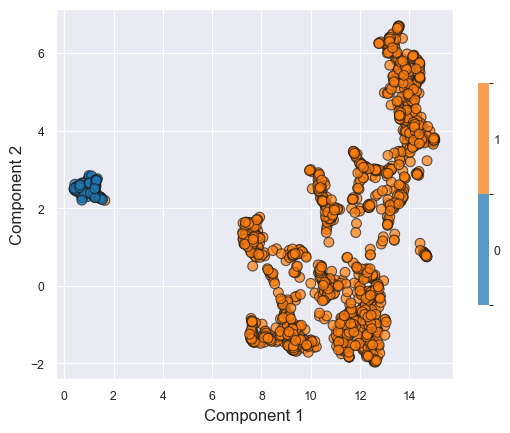

In [47]:
print('Unique labels for the HDBSCAN instance with the best parameters (DTW):')
print(np.unique(hdbscan_DTW.labels_dict[hdbscan_DTW.best_parameters_dbcv]))


best_lambda_dbcv = hdbscan_DTW.best_parameters_dbcv[0]
distances_calculations.plot_embeddings(umaps_dtw_2d_final[best_lambda_dbcv]['embeddings'], 
                                       labels=hdbscan_DTW.labels_dict[hdbscan_DTW.best_parameters_dbcv])

Unique labels for the HDBSCAN instance with the best parameters (DTW):
[-1  0  1  2  3  4  5  6  7  8  9 10 11]


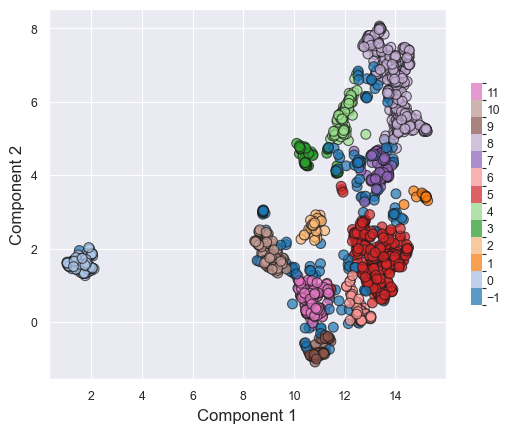

In [48]:
print('Unique labels for the HDBSCAN instance with the best parameters (DTW):')
print(np.unique(hdbscan_DTW.labels_dict[hdbscan_DTW.best_parameters_bcs]))


best_lambda_bcs = hdbscan_DTW.best_parameters_bcs[0]
distances_calculations.plot_embeddings(umaps_dtw_2d_final[best_lambda_bcs]['embeddings'], 
                                       labels=hdbscan_DTW.labels_dict[hdbscan_DTW.best_parameters_bcs])

#### Description of the clusters (without splitting branches)

##### Selecting the results to examine

In [49]:
trajectory_general_measures_night['hdbscan_dtw_bcs_labels'] = hdbscan_DTW.labels_dict[hdbscan_DTW.best_parameters_bcs]

##### Summary statistics by clusters

In [50]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='hdbscan_dtw_bcs_labels',
                                             decimals=5)

hdbscan_dtw_bcs_labels,-1,0,1,2,3,4,5,6,7,8,9,10,11
count,142.00000,128.00000,30.00000,36.00000,76.00000,86.00000,299.00000,67.00000,74.00000,330.00000,59.00000,119.00000,134.00000
proportion,0.08987,0.08101,0.01899,0.02278,0.04810,0.05443,0.18924,0.04241,0.04684,0.20886,0.03734,0.07532,0.08481
"(tid, mean)",1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
"(tid, std)",0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
"(tid, min)",1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(adj_score_ev_24, max)",0.03461,0.00000,0.00373,0.00000,0.01392,0.03034,0.01524,0.02680,0.03526,0.35145,0.04089,0.05928,0.02453
"(hdbscan_dtw_bcs_labels, mean)",-1.00000,0.00000,1.00000,2.00000,3.00000,4.00000,5.00000,6.00000,7.00000,8.00000,9.00000,10.00000,11.00000
"(hdbscan_dtw_bcs_labels, std)",0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
"(hdbscan_dtw_bcs_labels, min)",-1.00000,0.00000,1.00000,2.00000,3.00000,4.00000,5.00000,6.00000,7.00000,8.00000,9.00000,10.00000,11.00000


##### Arrival and departure times

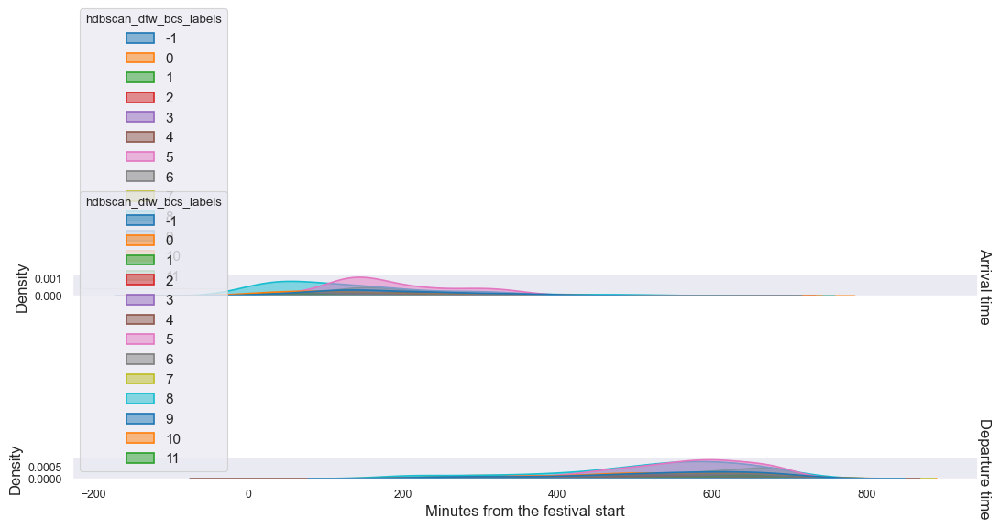

In [51]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='hdbscan_dtw_bcs_labels')

#####  Distributions per column of interest

In [52]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [53]:
"""for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_dtw_bcs_labels', interest_col=col_interest)"""

"for col_interest in columns_interest_distribution:\n    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_dtw_bcs_labels', interest_col=col_interest)"

##### Scatter plots with regression

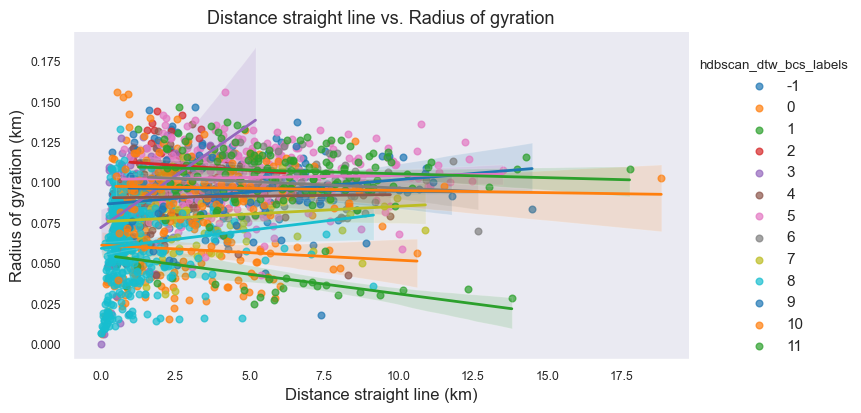

In [54]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_dtw_bcs_labels')


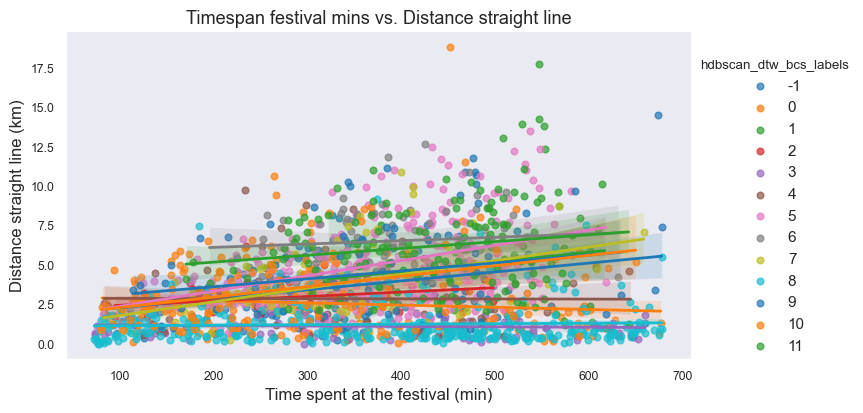

In [55]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='hdbscan_dtw_bcs_labels')

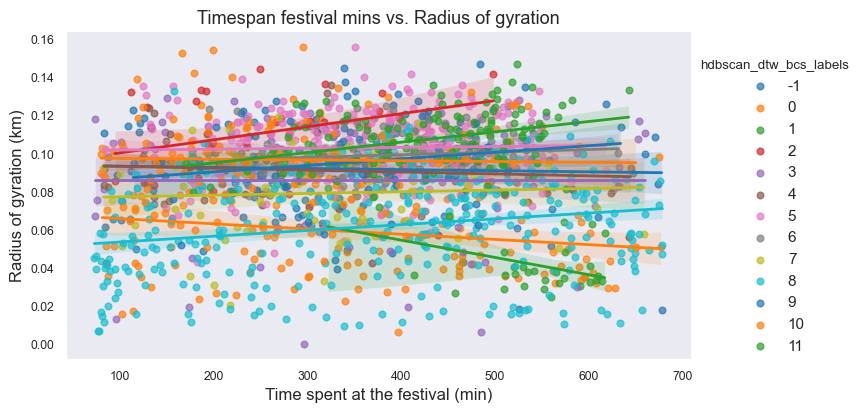

In [56]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_dtw_bcs_labels')

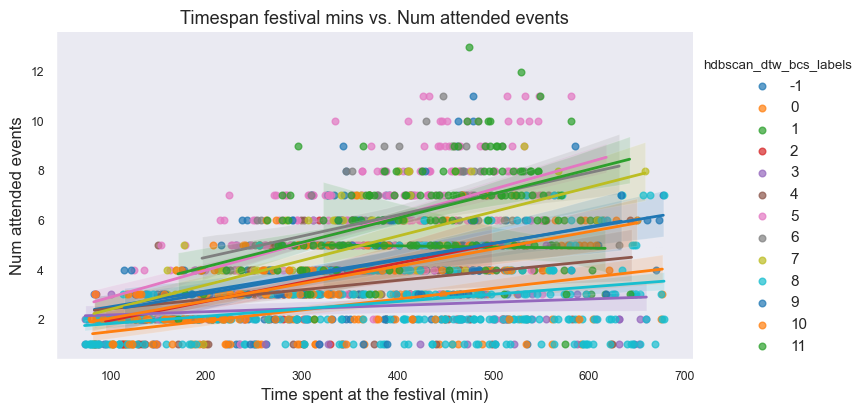

In [57]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='hdbscan_dtw_bcs_labels')

##### Event rankings by cluster

In [58]:
description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='hdbscan_dtw_bcs_labels')

,uid,tid,macaddr_randomized,stage,stage_area_m2,event_duration_timetable_mins,music_type,genre_grouped,views_youtube,event_title,time_at_event_mins,total_time_at_events_mins,total_time_at_stage_mins,score,total_audience_time_at_event_mins,general_factor,adj_score,event_id,hdbscan_dtw_bcs_labels
0,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarCar,2688,50.0,LIVE,other_genres,153053094.0,Soto Asa,21.400000,157.500000,44.883333,0.003027,2853.566667,5.358090,0.016220,ev_42,NaN
1,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarCar,2688,55.0,LIVE,electronic_hypnotic,10274.0,LaFrancesssa,23.483333,157.500000,44.883333,0.003322,2351.066667,5.069079,0.016839,ev_33,NaN
2,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,75.0,LIVE,electronic_hypnotic,164591762.0,Charlotte de Witte presents 'Overdrive',26.350000,157.500000,55.000000,0.003042,39179.266667,5.858700,0.017821,ev_37,NaN
3,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,90.0,DJ,electronic_hypnotic,1146541.0,Anetha,9.283333,157.500000,55.000000,0.001072,27966.066667,5.339222,0.005722,ev_31,NaN
4,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,90.0,LIVE,electronic_hypnotic,370125764.0,Paul Kalkbrenner,19.366667,157.500000,55.000000,0.002236,34417.550000,5.546797,0.012401,ev_27,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13801,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,60.0,LIVE,other_genres,29812785.0,CASISDEAD,46.516667,419.716667,419.716667,0.000264,3742.100000,4.219596,0.001114,ev_5,1.0
13802,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,90.0,DJ,electronic_accessible,3334941.0,salute,85.083333,419.716667,419.716667,0.000483,8976.516667,4.689096,0.002265,ev_13,1.0
13803,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,90.0,DJ,electronic_hypnotic,0.0,DJ Flight & MC Chickaboo,55.866667,419.716667,419.716667,0.000317,3364.683333,3.707818,0.001176,ev_24,1.0
13804,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,120.0,DJ,electronic_accessible,82644275.0,Eliza Rose b2b Dan Shake b2b Sally C,120.000000,419.716667,419.716667,0.000681,12793.283333,4.755723,0.003240,ev_8,1.0


In [59]:
description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='hdbscan_dtw_bcs_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)

C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_-1.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_0.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_1.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_2.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_3.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_4.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_5.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_6.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_7.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_8.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_9.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_10.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_bcs_11.pdf


##### H3 counts plots per cluster

In [60]:
"""# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','hdbscan_dtw_bcs_labels']],
                                                on=['uid','tid'],
                                                how='left')"""

"# Join the cluster labels to the full trajectory\ntrajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,\n                                                trajectory_general_measures_night[['uid','tid','hdbscan_dtw_bcs_labels']],\n                                                on=['uid','tid'],\n                                                how='left')"

Plotting the observation counts by H3 cell and cluster.

In [61]:
"""description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='hdbscan_dtw_bcs_labels', 
                                                     path_to_save=path_cluster_description)"""

"description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                     clusters_col='hdbscan_dtw_bcs_labels', \n                                                     path_to_save=path_cluster_description)"

Plotting the user counts by H3 cell timeline by cluster.

In [62]:
"""description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='hdbscan_dtw_bcs_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)"""

"description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                            clusters_col='hdbscan_dtw_bcs_labels',\n                                                            window_duration='15min',\n                                                            path_to_save=path_cluster_description)"

##### Vendor name proportion

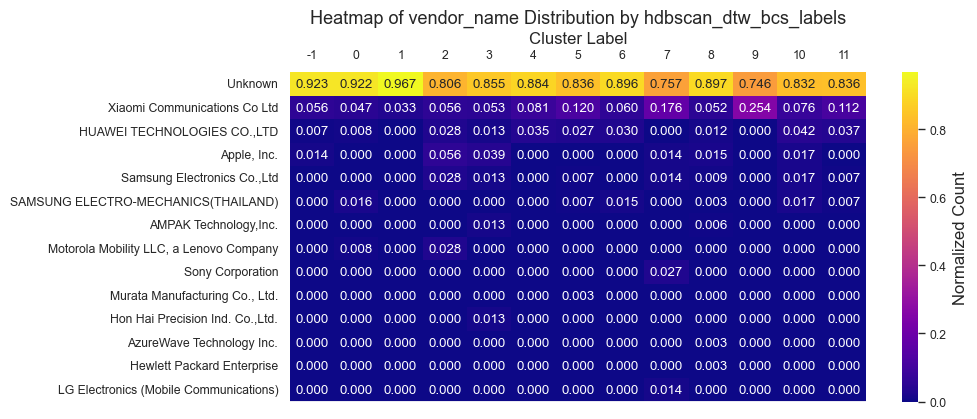

In [63]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'hdbscan_dtw_bcs_labels')


##### People counts heatmap by cluster

In [64]:
"""description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='hdbscan_dtw_bcs_labels')"""

"description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,\n                                                               clusters_col='hdbscan_dtw_bcs_labels')"

#### Branch examination

Note: this part is quite manual and depends on the visual assessment of the results obtained.

##### Selecting the best clusterer and detecting the branches

In [65]:
best_hdbscan_dtw_dbcv = hdbscan_DTW.hdbscan_instances_dict[hdbscan_DTW.best_parameters_dbcv]

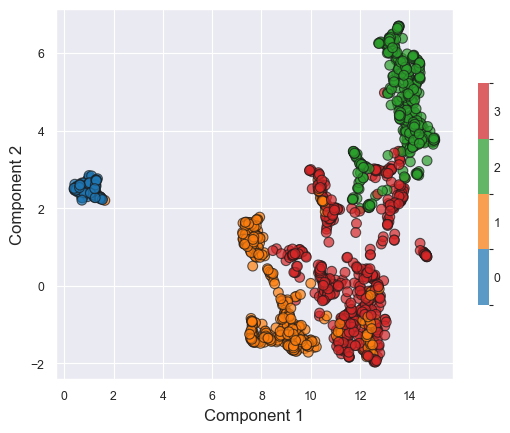

In [66]:
branch_detector_dtw_dbcv = (BranchDetector(#min_branch_size=122, 
                                 branch_selection_persistence=0.1, # Setting it to 1 gives the original cluster, and 0 gives the same clustering with a distorted branch tree
                                 branch_selection_method='eom',
                                 label_sides_as_branches=True,
                                 #max_branch_size=794
                                 ).fit(best_hdbscan_dtw_dbcv))

distances_calculations.plot_embeddings(umaps_dtw_2d_final[best_lambda_dbcv]['embeddings'], 
                                       labels=branch_detector_dtw_dbcv.labels_)

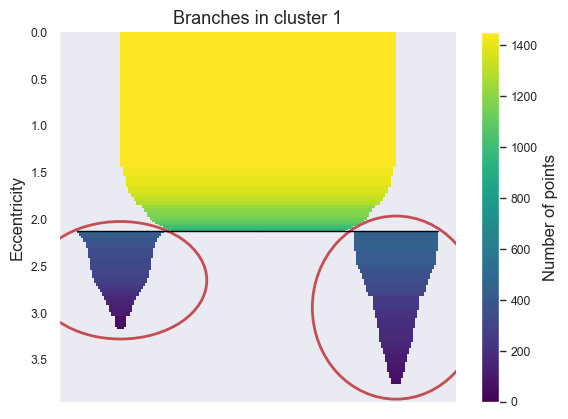

In [67]:
description_clusters.plot_branch_condensed_tree(branch_detector_dtw_dbcv)


In [68]:
# Size of the split cluster-branches (corresponding to the overall clustering labels)
np.unique(branch_detector_dtw_dbcv.labels_, return_counts=True)

(array([0, 1, 2, 3], dtype=int64), array([128, 455, 441, 556], dtype=int64))

##### Evaluating the branches numerically

In [69]:
print('\nHDBSCAN for DTW branches - DBCV scores:')
dtw_branches_DTW_dbcv_score = dbcv.dbcv(X=hdbscan_DTW.multi_distances_embeddings[best_lambda_dbcv]['embeddings'],
                                        y=branch_detector_dtw_dbcv.labels_)
print(dtw_branches_DTW_dbcv_score)


HDBSCAN for DTW branches - DBCV scores:
-0.829619654609833


In [70]:
print('\nHDBSCAN for DTW branches - Silhouette scores:')
dtw_branches_DTW_silhouette_score = silhouette_score(hdbscan_DTW.multi_distances_embeddings[best_lambda_dbcv]['embeddings'], 
                                                     branch_detector_dtw_dbcv.labels_, 
                                                     metric='euclidean')
print(dtw_branches_DTW_silhouette_score)


HDBSCAN for DTW branches - Silhouette scores:
0.3330741


##### Description of the branches

##### Selecting the results to examine

In [71]:
trajectory_general_measures_night['hdbscan_dtw_dbcv_branch_labels'] = branch_detector_dtw_dbcv.labels_

##### Summary statistics by clusters

In [72]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='hdbscan_dtw_dbcv_branch_labels',
                                             decimals=5)

hdbscan_dtw_dbcv_branch_labels,0,1,2,3
count,128.00000,455.00000,441.00000,556.0000
proportion,0.08101,0.28797,0.27911,0.3519
"(tid, mean)",1.00000,1.00000,1.00000,1.0000
"(tid, std)",0.00000,0.00000,0.00000,0.0000
"(tid, min)",1.00000,1.00000,1.00000,1.0000
...,...,...,...,...
"(hdbscan_dtw_bcs_labels, max)",0.00000,11.00000,8.00000,7.0000
"(hdbscan_dtw_dbcv_branch_labels, mean)",0.00000,1.00000,2.00000,3.0000
"(hdbscan_dtw_dbcv_branch_labels, std)",0.00000,0.00000,0.00000,0.0000
"(hdbscan_dtw_dbcv_branch_labels, min)",0.00000,1.00000,2.00000,3.0000


##### Parallel coordinates plot for the z-normalized features

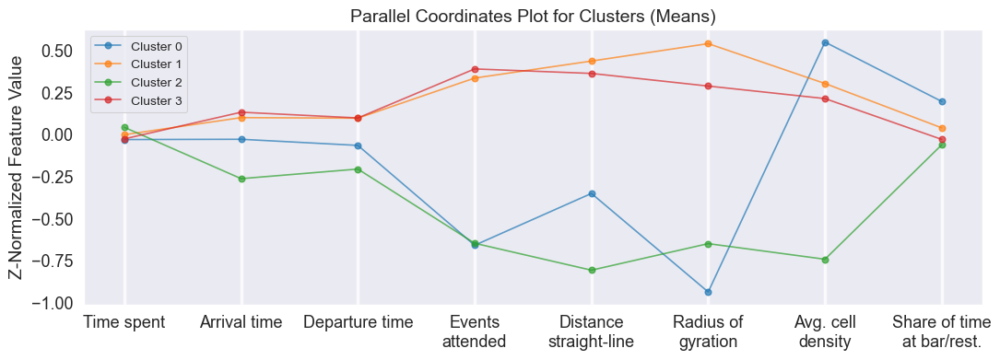

In [78]:
# Example usage:
feature_columns = ['timespan_festival_mins','arrival_festival_mins', 'departure_festival_mins',
                   'num_attended_events', 'distance_straight_line', 'radius_of_gyration', 
                   'average_cell_density', 'duration_bar_restaurant_share']

feature_labels = ['Time spent', 'Arrival time', 'Departure time',
                  'Events\nattended', 'Distance\nstraight-line', 'Radius of\ngyration',
                  'Avg. cell\ndensity', 'Share of time\nat bar/rest.']

description_clusters.plot_parallel_coordinates(df=trajectory_general_measures_night,
                                               cluster_col='hdbscan_dtw_dbcv_branch_labels',
                                               feature_columns=feature_columns,
                                               feature_labels=feature_labels,
                                               offset_colormap=0)

##### Arrival and departure times

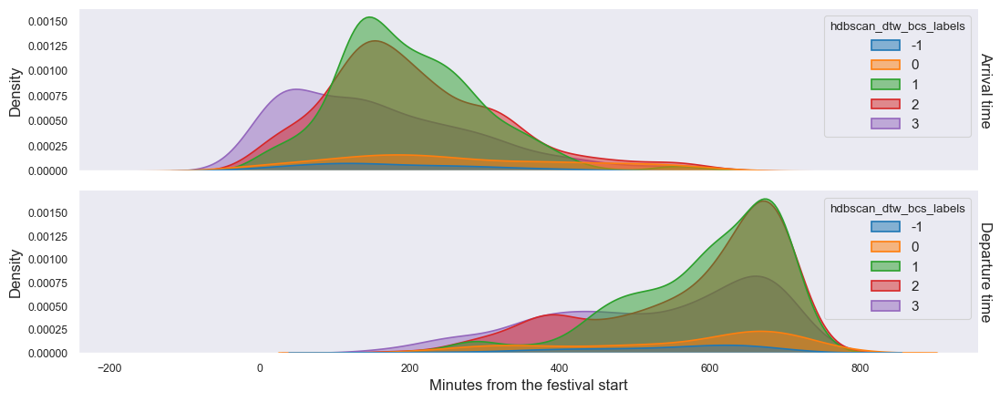

In [ ]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='hdbscan_dtw_bcs_labels')

##### Arrival and departure times

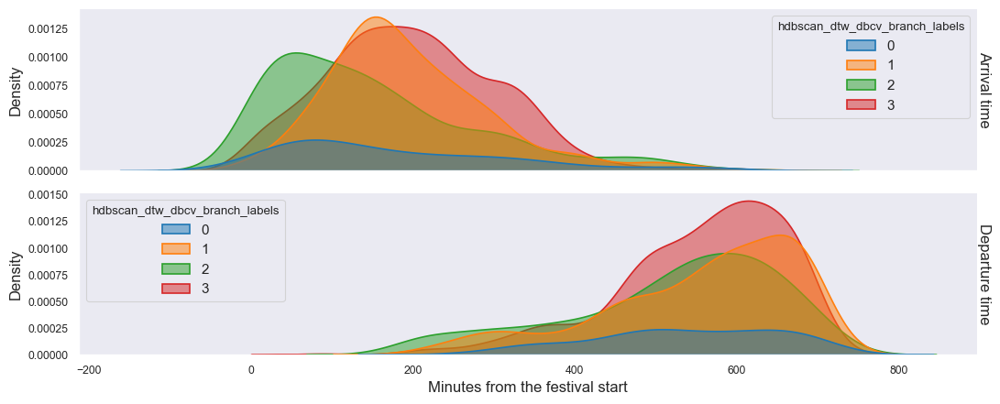

In [71]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, 
                                            clusters_col='hdbscan_dtw_dbcv_branch_labels')

#####  Distributions per column of interest

In [72]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [73]:
for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, 
                                                    clusters_col='hdbscan_dtw_dbcv_branch_labels', 
                                                    interest_col=col_interest)

##### Scatter plots with regression

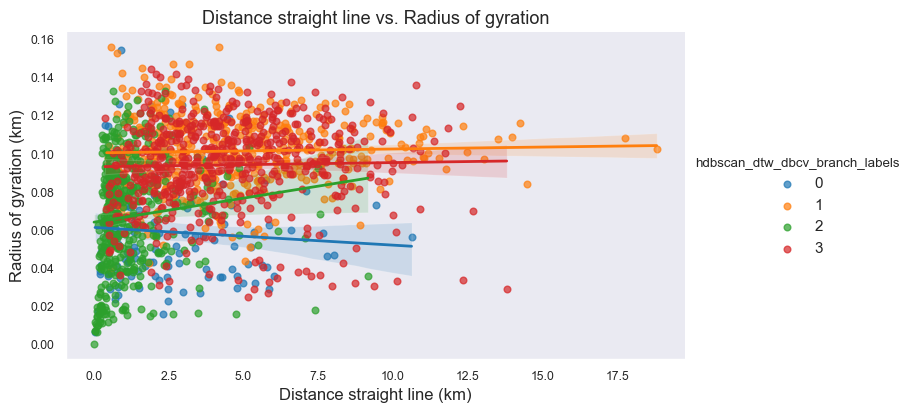

In [74]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_dtw_dbcv_branch_labels')


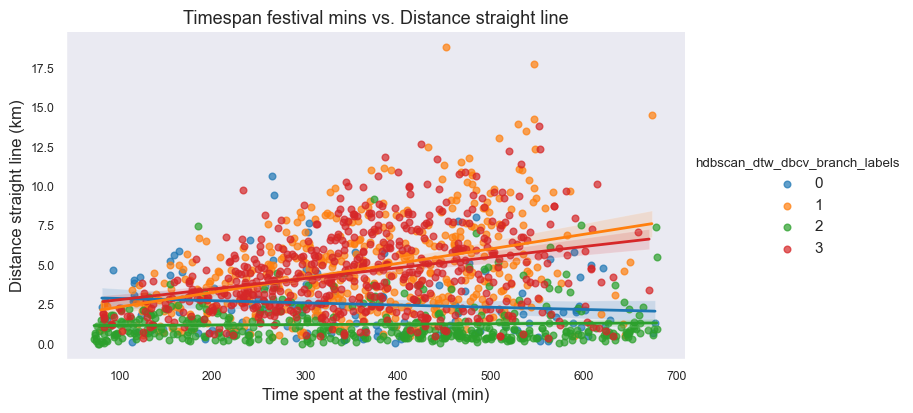

In [75]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='hdbscan_dtw_dbcv_branch_labels')

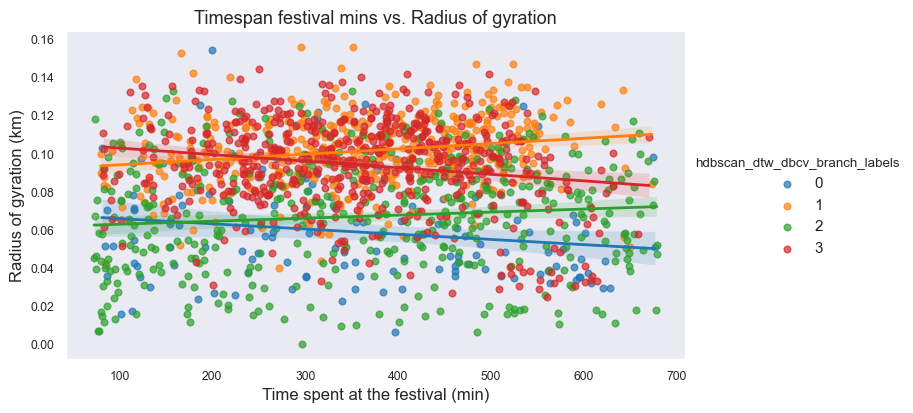

In [76]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_dtw_dbcv_branch_labels')

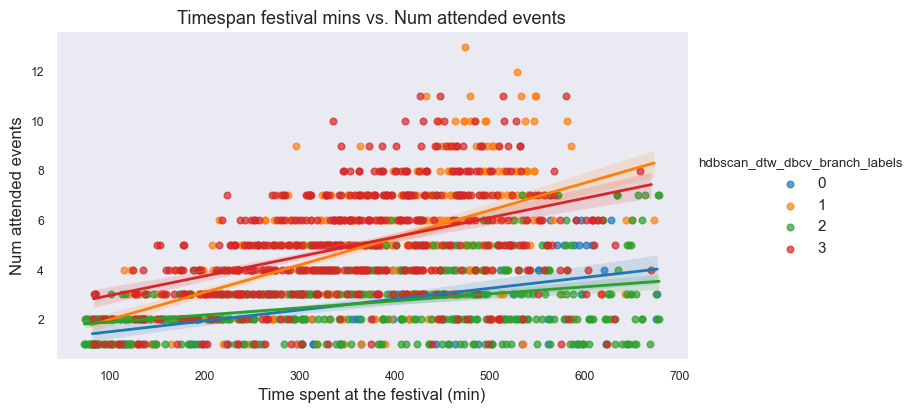

In [77]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='hdbscan_dtw_dbcv_branch_labels')

##### Event rankings by cluster

In [78]:
description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='hdbscan_dtw_dbcv_branch_labels')

,uid,tid,macaddr_randomized,stage,stage_area_m2,event_duration_timetable_mins,music_type,genre_grouped,views_youtube,event_title,time_at_event_mins,total_time_at_events_mins,total_time_at_stage_mins,score,total_audience_time_at_event_mins,general_factor,adj_score,event_id,hdbscan_dtw_dbcv_branch_labels
0,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarCar,2688,50.0,LIVE,other_genres,153053094.0,Soto Asa,21.400000,157.500000,44.883333,0.003027,2853.566667,5.358090,0.016220,ev_42,NaN
1,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarCar,2688,55.0,LIVE,electronic_hypnotic,10274.0,LaFrancesssa,23.483333,157.500000,44.883333,0.003322,2351.066667,5.069079,0.016839,ev_33,NaN
2,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,75.0,LIVE,electronic_hypnotic,164591762.0,Charlotte de Witte presents 'Overdrive',26.350000,157.500000,55.000000,0.003042,39179.266667,5.858700,0.017821,ev_37,NaN
3,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,90.0,DJ,electronic_hypnotic,1146541.0,Anetha,9.283333,157.500000,55.000000,0.001072,27966.066667,5.339222,0.005722,ev_31,NaN
4,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,90.0,LIVE,electronic_hypnotic,370125764.0,Paul Kalkbrenner,19.366667,157.500000,55.000000,0.002236,34417.550000,5.546797,0.012401,ev_27,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13801,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,60.0,LIVE,other_genres,29812785.0,CASISDEAD,46.516667,419.716667,419.716667,0.000264,3742.100000,4.219596,0.001114,ev_5,3.0
13802,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,90.0,DJ,electronic_accessible,3334941.0,salute,85.083333,419.716667,419.716667,0.000483,8976.516667,4.689096,0.002265,ev_13,3.0
13803,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,90.0,DJ,electronic_hypnotic,0.0,DJ Flight & MC Chickaboo,55.866667,419.716667,419.716667,0.000317,3364.683333,3.707818,0.001176,ev_24,3.0
13804,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,120.0,DJ,electronic_accessible,82644275.0,Eliza Rose b2b Dan Shake b2b Sally C,120.000000,419.716667,419.716667,0.000681,12793.283333,4.755723,0.003240,ev_8,3.0


In [79]:
description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='hdbscan_dtw_dbcv_branch_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)

C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_dbcv_branch_0.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_dbcv_branch_1.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_dbcv_branch_2.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_hdbscan_dtw_dbcv_branch_3.pdf


##### H3 counts plots per cluster

In [80]:
# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','hdbscan_dtw_dbcv_branch_labels']],
                                                on=['uid','tid'],
                                                how='left')

Plotting the observation counts by H3 cell and cluster.

In [81]:
description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='hdbscan_dtw_dbcv_branch_labels', 
                                                     path_to_save=path_cluster_description)

File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_hdbscan_dtw_dbcv_branch_0.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_hdbscan_dtw_dbcv_branch_1.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_hdbscan_dtw_dbcv_branch_2.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_hdbscan_dtw_dbcv_branch_3.html.


Plotting the user counts by H3 cell timeline by cluster.

In [82]:
description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='hdbscan_dtw_dbcv_branch_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)

File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_hdbscan_dtw_dbcv_branch_0.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_hdbscan_dtw_dbcv_branch_1.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_hdbscan_dtw_dbcv_branch_2.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_hdbscan_dtw_dbcv_branch_3.html.


##### Vendor name proportion

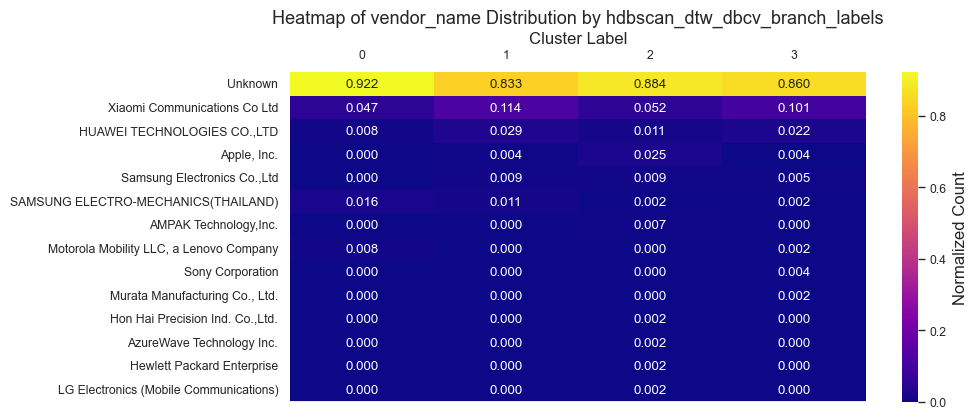

In [83]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'hdbscan_dtw_dbcv_branch_labels')

##### People counts heatmap by cluster

People count time window heatmaps for hdbscan_dtw_dbcv_branch_0


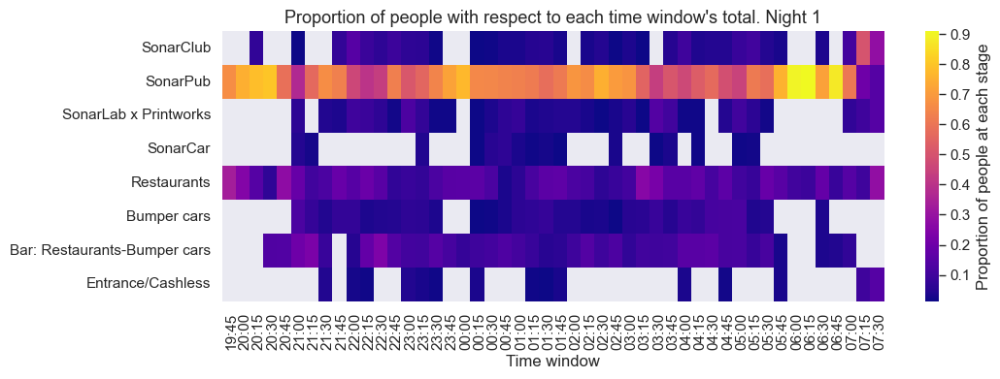

People count time window heatmaps for hdbscan_dtw_dbcv_branch_1


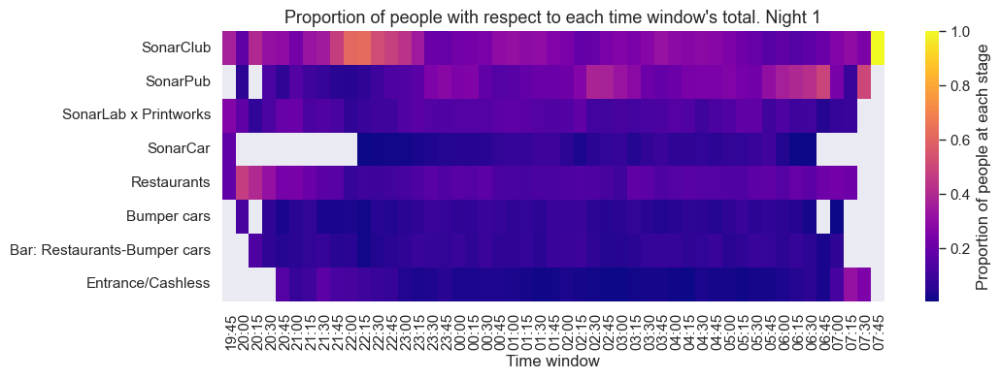

People count time window heatmaps for hdbscan_dtw_dbcv_branch_2


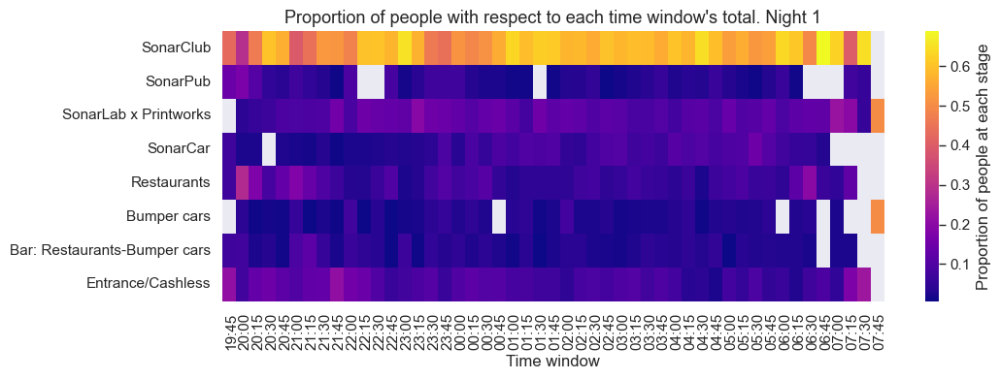

People count time window heatmaps for hdbscan_dtw_dbcv_branch_3


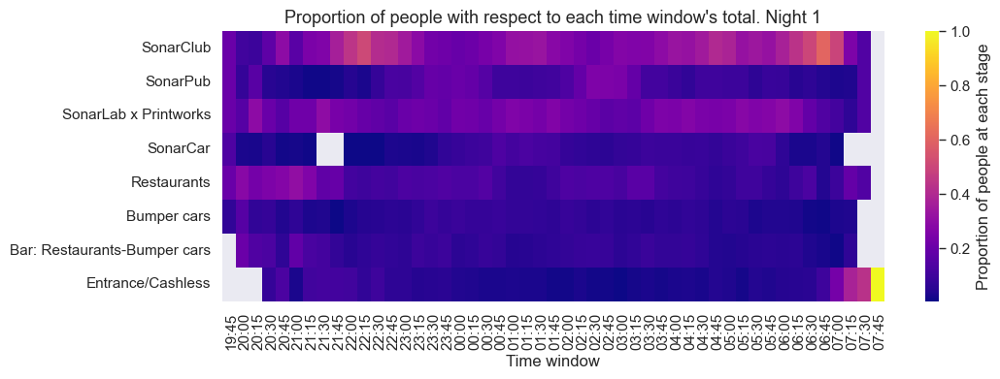

In [84]:
description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='hdbscan_dtw_dbcv_branch_labels')

##### Displaying some representative trajectories

Note: this part is quite manual and depends on the visual assessment of the results obtained.

###### Medoid extraction

In [199]:
# Extract the medoids and the medoid indices for each branch/cluster
medoid_indices_dtw_branches = description_clusters.get_medoids_indices(hdbscan_DTW.multi_distances_embeddings[best_lambda_dbcv]['embeddings'],
                                                                       branch_detector_dtw_dbcv.labels_)
print(f'Medoid indices: {medoid_indices_dtw_branches}')

Medoid indices: [322  77 395 421]


In [200]:
# Flag the medoid for each branch/cluster in the general table
medoid_flags = np.zeros(len(hdbscan_DTW.multi_distances_embeddings[best_lambda_dbcv]['embeddings']), dtype=bool)
medoid_flags[medoid_indices_dtw_branches] = True

trajectory_general_measures_night['hdbscan_dtw_dbcv_branch_medoid'] = medoid_flags

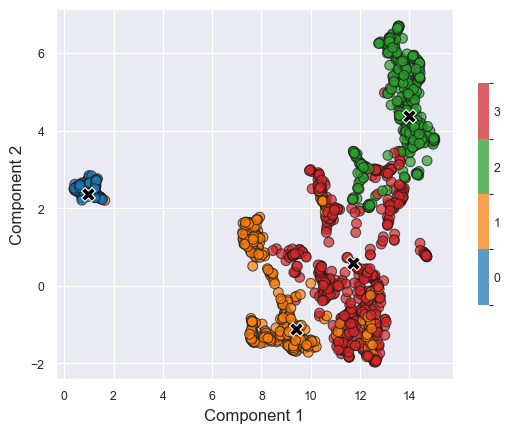

In [201]:
# Check medoids (Are marked with an x on the plot)
distances_calculations.plot_embeddings(umaps_dtw_2d_final[best_lambda_dbcv]['embeddings'], 
                                       labels=branch_detector_dtw_dbcv.labels_,
                                       medoid_indices=medoid_indices_dtw_branches)

Visualizing the resulting medoid trajectories.

In [202]:
# Suppress warnings only within this cell
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    description_clusters.plot_traj_medoid_clusters(path_to_save=path_cluster_description,
                                                   clusters_col='hdbscan_dtw_dbcv_branch_labels',
                                                   medoid_indices='hdbscan_dtw_dbcv_branch_medoid',
                                                   show_maps=False, plot_stops=False,
                                                   trajectory_general_measures_df=trajectory_general_measures_night, 
                                                   trajectories_events_df=trajectories_events_night_extra_info, 
                                                   sequence_stops_df=sequence_stops_night_filtered)

File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\traj_hdbscan_dtw_dbcv_branch_0_medoid.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\traj_hdbscan_dtw_dbcv_branch_1_medoid.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\traj_hdbscan_dtw_dbcv_branch_2_medoid.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\traj_hdbscan_dtw_dbcv_branch_3_medoid.html.


###### HDBSCAN exemplars

HDBSCAN provides "exemplars" directly: 
>Since HDBSCAN supports arbitrary shapes for clusters we cannot provide a single cluster exemplar per cluster. Instead a list is returned with each element of the list being a numpy array of exemplar points for a cluster – these points are the “most representative” points of the cluster.

In this case, the sparse medoid corresponds to cluster/branch 2, so I extract the exemplar as alternative and visualize it.

In [203]:
# Suppress warnings only within this cell
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    description_clusters.plot_exemplar_cluster(hdbscan_experiment=hdbscan_DTW,
                                               parameters_experiment=hdbscan_DTW.best_parameters_dbcv,
                                               cluster_id=1, exemplar_idx=2, # Cluster 1 of DBCV corresponds to branch 2
                                               filename_to_save=os.path.join(path_cluster_description,'traj_hdbscan_dtw_dbcv_branch_2_exemplar.html'),
                                               show_maps=False, plot_stops=False,
                                               trajectory_general_measures_df=trajectory_general_measures_night,
                                               trajectories_events_df=trajectories_events_night_extra_info,
                                               sequence_stops_df=sequence_stops_night_filtered)

Alternative for cluster 1:
The exemplar selected for cluster 1 has index: 1139
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\traj_hdbscan_dtw_dbcv_branch_2_exemplar.html.


### K Medoids

#### Experiment settings

I work with the same hyperparameter options that I used for the time window euclidean distances.

In [204]:
kmedoids_DTW = kmedoids_experiment.KMedoidsExperiment(multi_distances_embeddings=umaps_dtw_higher_d_final,
                                                     k_values=list(range(2,11)))

print(f'Lambda values for consideration: {list(kmedoids_DTW.multi_distances_embeddings.keys())}')
print(f'k values for consideration: {kmedoids_DTW.k_values}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
k values for consideration: [2, 3, 4, 5, 6, 7, 8, 9, 10]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [205]:
kmedoids_DTW.run_multi_kmedoids()

print('\nK-medoids for DTW - labels:')
for key, labels in kmedoids_DTW.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. K-medoids labels_dict was updated.

K-medoids for DTW - labels:
(0, 2) (array([0, 1], dtype=int64), array([722, 858], dtype=int64))
(0, 3) (array([0, 1, 2], dtype=int64), array([713, 484, 383], dtype=int64))
(0, 4) (array([0, 1, 2, 3], dtype=int64), array([246, 441, 354, 539], dtype=int64))
(0, 5) (array([0, 1, 2, 3, 4], dtype=int64), array([319, 302, 318, 297, 344], dtype=int64))
(0, 6) (array([0, 1, 2, 3, 4, 5], dtype=int64), array([311, 318, 280, 104, 279, 288], dtype=int64))
(0, 7) (array([0, 1, 2, 3, 4, 5, 6], dtype=int64), array([267, 224, 271, 106, 130, 254, 328], dtype=int64))
(0, 8) (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([106, 163, 271, 255, 120,

#### Cluster evaluation

##### Silhouette scores

In [206]:
kmedoids_DTW.compute_kmedoids_silhouette_scores()

print('\K-medoids for DTW - silhouette scores:')
kmedoids_DTW.silhouette_scores_dict

Silhouette scores computation is done. K-medoids silhouette_scores_dict was updated
\K-medoids for DTW - silhouette scores:


{(0, 2): 0.36522403,
 (0, 3): 0.34327763,
 (0, 4): 0.3204717,
 (0, 5): 0.3352023,
 (0, 6): 0.3564392,
 (0, 7): 0.3415144,
 (0, 8): 0.34066564,
 (0, 9): 0.30625242,
 (0, 10): 0.33565137,
 (0.25, 2): 0.38040903,
 (0.25, 3): 0.27469084,
 (0.25, 4): 0.26884627,
 (0.25, 5): 0.36586276,
 (0.25, 6): 0.38463578,
 (0.25, 7): 0.34103307,
 (0.25, 8): 0.2996224,
 (0.25, 9): 0.3642892,
 (0.25, 10): 0.3786418,
 (0.5, 2): 0.37206915,
 (0.5, 3): 0.1277537,
 (0.5, 4): 0.29425126,
 (0.5, 5): 0.43739632,
 (0.5, 6): 0.43019068,
 (0.5, 7): 0.45126465,
 (0.5, 8): 0.41302088,
 (0.5, 9): 0.39852446,
 (0.5, 10): 0.37707216,
 (0.75, 2): 0.4003785,
 (0.75, 3): 0.31575704,
 (0.75, 4): 0.2395952,
 (0.75, 5): 0.38218817,
 (0.75, 6): 0.4915483,
 (0.75, 7): 0.47531575,
 (0.75, 8): 0.41967157,
 (0.75, 9): 0.43464828,
 (0.75, 10): 0.45355415,
 (1, 2): 0.32755125,
 (1, 3): 0.26116747,
 (1, 4): 0.26821154,
 (1, 5): 0.30993512,
 (1, 6): 0.39328054,
 (1, 7): 0.39410573,
 (1, 8): 0.33086053,
 (1, 9): 0.33651745,
 (1, 10): 0

##### DBCV scores

For completeness, the DBCV is. also computed for K-medoids.

In [207]:
kmedoids_DTW.compute_kmedoids_dbcv_scores()

print('\K-medoids for DTW - DBCV scores:')
kmedoids_DTW.dbcv_scores_dict

DBCV scores computation is done. K-medoids dbcv_scores_dict was updated
\K-medoids for DTW - DBCV scores:


{(0, 2): -0.937277443924815,
 (0, 3): -0.8551005265469294,
 (0, 4): -0.9577558213527934,
 (0, 5): -0.9781889260116,
 (0, 6): -0.9614399235858858,
 (0, 7): -0.8649345287310484,
 (0, 8): -0.8928913778801046,
 (0, 9): -0.81309805520873,
 (0, 10): -0.8309604355374174,
 (0.25, 2): -0.9403147929576217,
 (0.25, 3): -0.8431085433689957,
 (0.25, 4): -0.9288043741816645,
 (0.25, 5): -0.9649865918731635,
 (0.25, 6): -0.9550836767042319,
 (0.25, 7): -0.807185606920512,
 (0.25, 8): -0.6823445733521811,
 (0.25, 9): -0.8006492279824838,
 (0.25, 10): -0.7672007754687238,
 (0.5, 2): -0.9951157337943201,
 (0.5, 3): -0.9533117153254617,
 (0.5, 4): -0.9947543013571244,
 (0.5, 5): -0.5996301312878798,
 (0.5, 6): -0.548280212633473,
 (0.5, 7): -0.4975860489681749,
 (0.5, 8): -0.7007438529326009,
 (0.5, 9): -0.46098030458609224,
 (0.5, 10): -0.4769647225757772,
 (0.75, 2): -0.9957530178324553,
 (0.75, 3): -0.9789189280988018,
 (0.75, 4): -0.9961809587559876,
 (0.75, 5): -0.9210419344017688,
 (0.75, 6): -0.80

##### Balanced clustering scores

In [208]:
# Compute the entropy of each clustering result
kmedoids_DTW.compute_normalized_entropy()

print('\nK-medoids for DTW - normalized entropies:')
kmedoids_DTW.normalized_entropies_dict

Normalized entropy computation is done. K-medoids normalized_entropies_dict was updated

K-medoids for DTW - normalized entropies:


{(0, 2): 0.9946488671232326,
 (0, 3): 0.9694150601313486,
 (0, 4): 0.9722287416723273,
 (0, 5): 0.9991648398625894,
 (0, 6): 0.9737893780610896,
 (0, 7): 0.9696126269736051,
 (0, 8): 0.9721463643741429,
 (0, 9): 0.95828610740803,
 (0, 10): 0.9127617776171814,
 (0.25, 2): 0.8835995285759058,
 (0.25, 3): 0.9814560393764189,
 (0.25, 4): 0.8065061586670662,
 (0.25, 5): 0.8648091908678754,
 (0.25, 6): 0.9048547238009793,
 (0.25, 7): 0.9392289086898623,
 (0.25, 8): 0.9367484082369636,
 (0.25, 9): 0.9591220161928002,
 (0.25, 10): 0.9738174673342412,
 (0.5, 2): 0.9713196201171864,
 (0.5, 3): 0.8134898570280625,
 (0.5, 4): 0.9818484927121889,
 (0.5, 5): 0.9654766139326147,
 (0.5, 6): 0.9497128160654146,
 (0.5, 7): 0.9594778133809939,
 (0.5, 8): 0.9677289400457072,
 (0.5, 9): 0.9207085205830395,
 (0.5, 10): 0.9139011921469141,
 (0.75, 2): 0.979456999850022,
 (0.75, 3): 0.9860091253707778,
 (0.75, 4): 0.8439003806843793,
 (0.75, 5): 0.91772135651756,
 (0.75, 6): 0.9587160765924659,
 (0.75, 7): 0.

In [209]:
# Rescale the silhouette of each clustering result
kmedoids_DTW.rescale_silhouette_scores()

print('\nK-medoids for DTW - rescaled silhouette:')
kmedoids_DTW.rescaled_silhouette_scores_dict

Rescaling of silhouette is done. K-medoids rescaled_silhouette_scores_dict was updated

K-medoids for DTW - rescaled silhouette:


{(0, 2): 0.6826120167970657,
 (0, 3): 0.6716388165950775,
 (0, 4): 0.6602358520030975,
 (0, 5): 0.667601153254509,
 (0, 6): 0.6782196015119553,
 (0, 7): 0.6707572042942047,
 (0, 8): 0.6703328192234039,
 (0, 9): 0.6531262099742889,
 (0, 10): 0.6678256839513779,
 (0.25, 2): 0.6902045160531998,
 (0.25, 3): 0.6373454183340073,
 (0.25, 4): 0.6344231367111206,
 (0.25, 5): 0.6829313784837723,
 (0.25, 6): 0.6923178881406784,
 (0.25, 7): 0.6705165356397629,
 (0.25, 8): 0.6498111933469772,
 (0.25, 9): 0.6821445971727371,
 (0.25, 10): 0.689320906996727,
 (0.5, 2): 0.6860345751047134,
 (0.5, 3): 0.5638768523931503,
 (0.5, 4): 0.647125631570816,
 (0.5, 5): 0.7186981588602066,
 (0.5, 6): 0.7150953412055969,
 (0.5, 7): 0.7256323248147964,
 (0.5, 8): 0.7065104395151138,
 (0.5, 9): 0.6992622315883636,
 (0.5, 10): 0.6885360777378082,
 (0.75, 2): 0.7001892477273941,
 (0.75, 3): 0.6578785181045532,
 (0.75, 4): 0.6197976022958755,
 (0.75, 5): 0.6910940855741501,
 (0.75, 6): 0.7457741498947144,
 (0.75, 7): 

In [294]:
# Compute the balanced score

kmedoids_DTW.compute_balanced_clustering_score(weight=0.5)

print('\K-medoids for DTW - ranked balanced clustering score:')
kmedoids_DTW.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. K-medoids ranked_balanced_clustering_scores_dict was updated
\K-medoids for DTW - ranked balanced clustering score:


{(0.75, 6): 0.8522451132435902,
 (0.5, 7): 0.8425550690978951,
 (0.5, 5): 0.8420873863964107,
 (0.75, 2): 0.839823123788708,
 (1, 6): 0.8392560623569169,
 (0, 2): 0.8386304419601491,
 (0.75, 7): 0.8379129352264756,
 (0.5, 8): 0.8371196897804105,
 (0, 5): 0.8333829965585492,
 (0.5, 6): 0.8324040786355058,
 (1, 7): 0.8317305312277592,
 (0.25, 10): 0.8315691871654841,
 (0.75, 10): 0.8304287281516267,
 (0.5, 2): 0.8286770976109499,
 (0.75, 8): 0.8283912180912825,
 (0, 6): 0.8260044897865224,
 (0.75, 3): 0.8219438217376656,
 (0, 8): 0.8212395917987734,
 (0.25, 9): 0.8206333066827687,
 (0, 3): 0.820526938363213,
 (0, 7): 0.8201849156339049,
 (1, 8): 0.8199996417620539,
 (0.75, 9): 0.8178014001529939,
 (0, 4): 0.8162322968377125,
 (0.5, 4): 0.8144870621415025,
 (1, 2): 0.812785674458697,
 (0.5, 9): 0.8099853760857016,
 (1, 3): 0.8097759132420361,
 (0.25, 3): 0.8094007288552131,
 (1, 5): 0.8073434646891308,
 (0, 9): 0.8057061586911595,
 (1, 4): 0.8049184947256591,
 (0.25, 7): 0.804872722164812

Selecting the best parameters based on the silhouette score.

In [295]:
kmedoids_DTW.update_best_params_and_score()

K-medoids updated best_parameters are (0.75, 6) with silhouette score = 0.4915482997894287
K-medoids updated best_parameters_bcs are (0.75, 6) with BCS score = 0.8522451132435902


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the K-medoids instance with the best parameters (DTW):
[0 1 2 3 4 5]


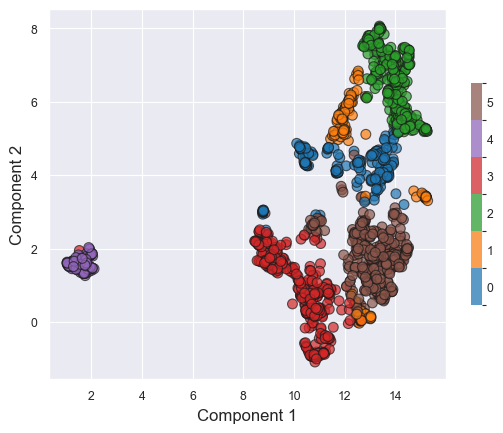

In [212]:
print('Unique labels for the K-medoids instance with the best parameters (DTW):')
print(np.unique(kmedoids_DTW.labels_dict[kmedoids_DTW.best_parameters_silhouette]))


best_lambda = kmedoids_DTW.best_parameters_silhouette[0]
distances_calculations.plot_embeddings(umaps_dtw_2d_final[best_lambda]['embeddings'], 
                                       labels=kmedoids_DTW.labels_dict[kmedoids_DTW.best_parameters_silhouette])

#### Description of the clusters

##### Selecting the results to examine

In [213]:
trajectory_general_measures_night['kmedoids_dtw_labels'] = kmedoids_DTW.labels_dict[kmedoids_DTW.best_parameters_silhouette]

##### Summary statistics by clusters

In [214]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='kmedoids_dtw_labels',
                                             decimals=5)

kmedoids_dtw_labels,0,1,2,3,4,5
count,209.0,167.0,336.0,367.0,128.0,373.0
"(tid, mean)",1.0,1.0,1.0,1.0,1.0,1.0
"(tid, std)",0.0,0.0,0.0,0.0,0.0,0.0
"(tid, min)",1.0,1.0,1.0,1.0,1.0,1.0
"(tid, max)",1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...
"(hdbscan_dtw_dbcv_branch_labels, max)",3.0,3.0,3.0,3.0,0.0,3.0
"(kmedoids_dtw_labels, mean)",0.0,1.0,2.0,3.0,4.0,5.0
"(kmedoids_dtw_labels, std)",0.0,0.0,0.0,0.0,0.0,0.0
"(kmedoids_dtw_labels, min)",0.0,1.0,2.0,3.0,4.0,5.0


##### Arrival and departure times

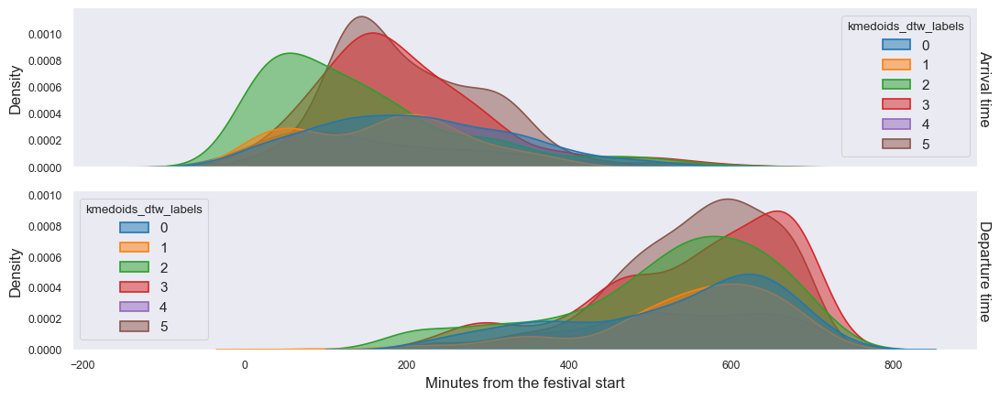

In [215]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='kmedoids_dtw_labels')

#####  Distributions per column of interest

In [216]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [217]:
for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='kmedoids_dtw_labels', interest_col=col_interest)

##### Scatter plots with regression

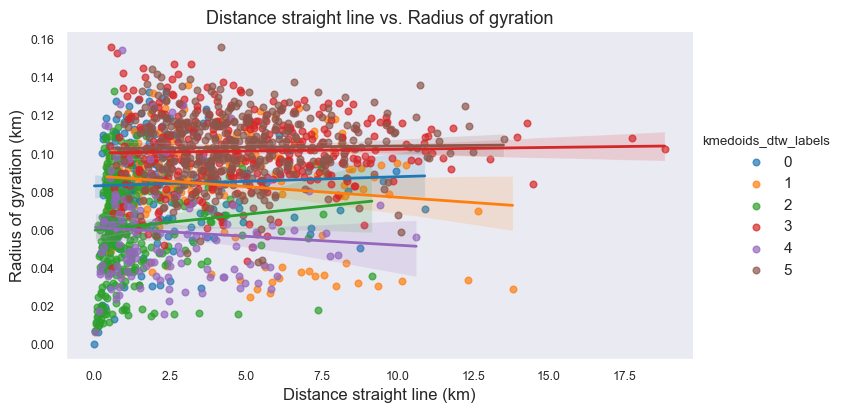

In [218]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_dtw_labels')


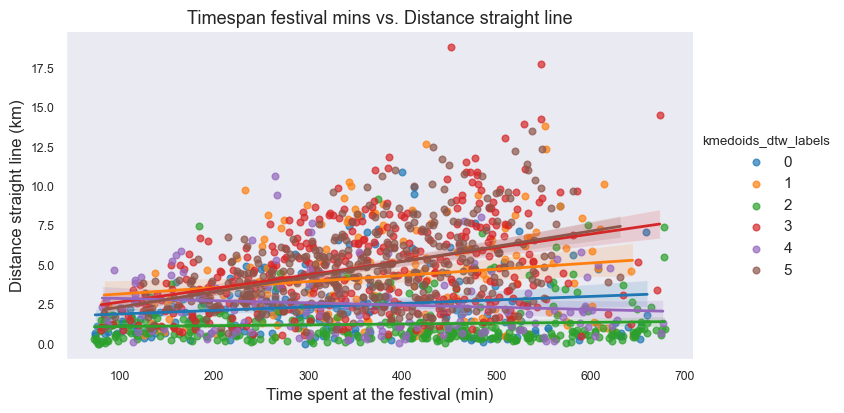

In [219]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='kmedoids_dtw_labels')

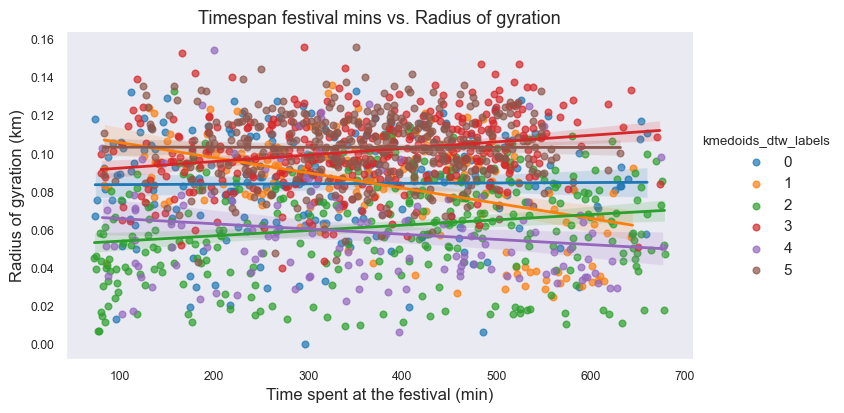

In [220]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_dtw_labels')

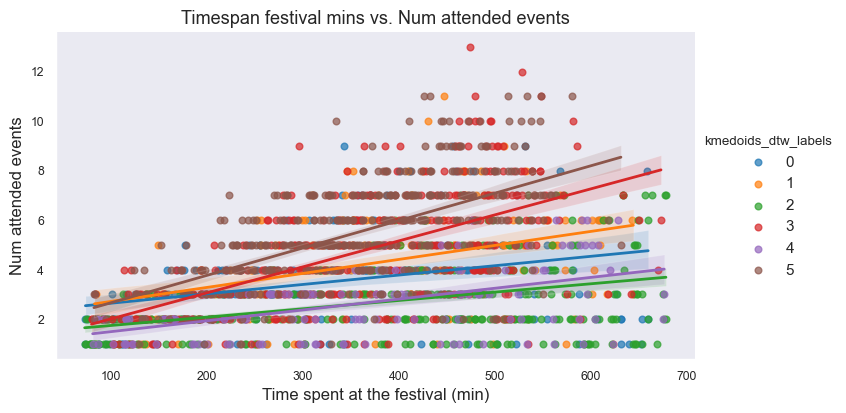

In [221]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='kmedoids_dtw_labels')

##### Event rankings by cluster

In [222]:
description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='kmedoids_dtw_labels')

,uid,tid,macaddr_randomized,stage,stage_area_m2,event_duration_timetable_mins,music_type,genre_grouped,views_youtube,event_title,time_at_event_mins,total_time_at_events_mins,total_time_at_stage_mins,score,total_audience_time_at_event_mins,general_factor,adj_score,event_id,kmedoids_dtw_labels
0,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarCar,2688,50.0,LIVE,other_genres,153053094.0,Soto Asa,21.400000,157.500000,44.883333,0.003027,2853.566667,5.358090,0.016220,ev_42,NaN
1,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarCar,2688,55.0,LIVE,electronic_hypnotic,10274.0,LaFrancesssa,23.483333,157.500000,44.883333,0.003322,2351.066667,5.069079,0.016839,ev_33,NaN
2,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,75.0,LIVE,electronic_hypnotic,164591762.0,Charlotte de Witte presents 'Overdrive',26.350000,157.500000,55.000000,0.003042,39179.266667,5.858700,0.017821,ev_37,NaN
3,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,90.0,DJ,electronic_hypnotic,1146541.0,Anetha,9.283333,157.500000,55.000000,0.001072,27966.066667,5.339222,0.005722,ev_31,NaN
4,00154bc5831501b8bd95273b1181d9330c3bf5f34b1961...,2,1,SonarClub,14914,90.0,LIVE,electronic_hypnotic,370125764.0,Paul Kalkbrenner,19.366667,157.500000,55.000000,0.002236,34417.550000,5.546797,0.012401,ev_27,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13801,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,60.0,LIVE,other_genres,29812785.0,CASISDEAD,46.516667,419.716667,419.716667,0.000264,3742.100000,4.219596,0.001114,ev_5,1.0
13802,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,90.0,DJ,electronic_accessible,3334941.0,salute,85.083333,419.716667,419.716667,0.000483,8976.516667,4.689096,0.002265,ev_13,1.0
13803,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,90.0,DJ,electronic_hypnotic,0.0,DJ Flight & MC Chickaboo,55.866667,419.716667,419.716667,0.000317,3364.683333,3.707818,0.001176,ev_24,1.0
13804,fff1c4c048bd5253bb7c3996ed466e303c6b8253a93dbe...,1,1,SonarLab x Printworks,9171,120.0,DJ,electronic_accessible,82644275.0,Eliza Rose b2b Dan Shake b2b Sally C,120.000000,419.716667,419.716667,0.000681,12793.283333,4.755723,0.003240,ev_8,1.0


In [223]:
description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='kmedoids_dtw_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)

C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_kmedoids_dtw_0.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_kmedoids_dtw_1.pdf
Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_kmedoids_dtw_2.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_kmedoids_dtw_3.pdf
Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_kmedoids_dtw_4.pdf


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\utils.py:553: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.



Ranking plot saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\rankings_kmedoids_dtw_5.pdf


##### H3 counts plots per cluster

In [224]:
# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','kmedoids_dtw_labels']],
                                                on=['uid','tid'],
                                                how='left')

Plotting the observation counts by H3 cell and cluster.

In [225]:
description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='kmedoids_dtw_labels', 
                                                     path_to_save=path_cluster_description)

File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_kmedoids_dtw_0.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_kmedoids_dtw_1.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_kmedoids_dtw_2.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_kmedoids_dtw_3.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_kmedoids_dtw_4.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_total_observations_kmedoids_dtw_5.html.


Plotting the user counts by H3 cell timeline by cluster.

In [226]:
description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='kmedoids_dtw_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)

File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_kmedoids_dtw_0.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_kmedoids_dtw_1.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_kmedoids_dtw_2.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_kmedoids_dtw_3.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_kmedoids_dtw_4.html.
File saved in ..\reports\figures\9-clusters-description-handcrafted\night_1\cell_user_counts_15min_windows_kmedoids_dtw_5.html.


##### Vendor name proportion

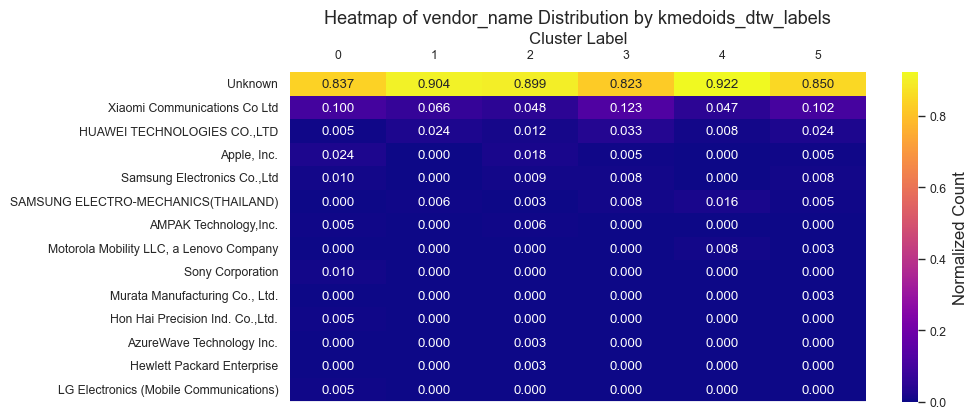

In [227]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'kmedoids_dtw_labels')


##### People counts heatmap by cluster

People count time window heatmaps for kmedoids_dtw_0


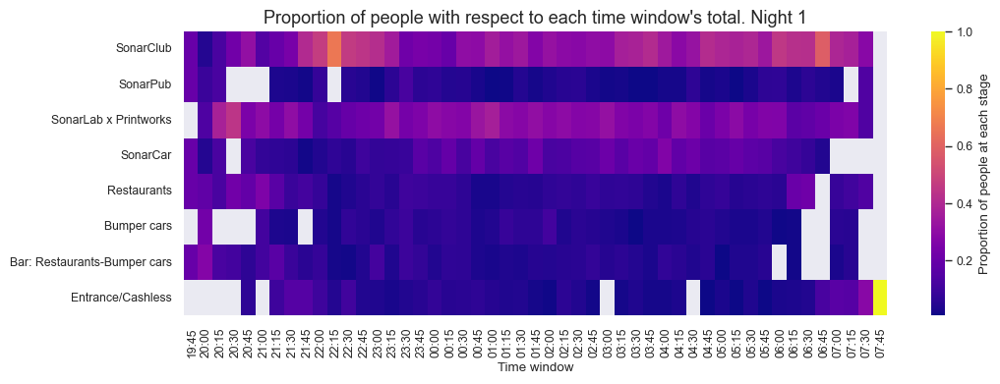

People count time window heatmaps for kmedoids_dtw_1


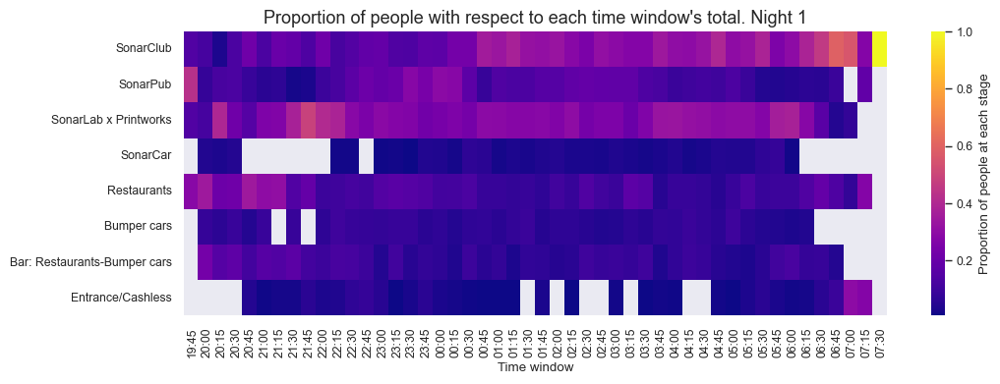

People count time window heatmaps for kmedoids_dtw_2


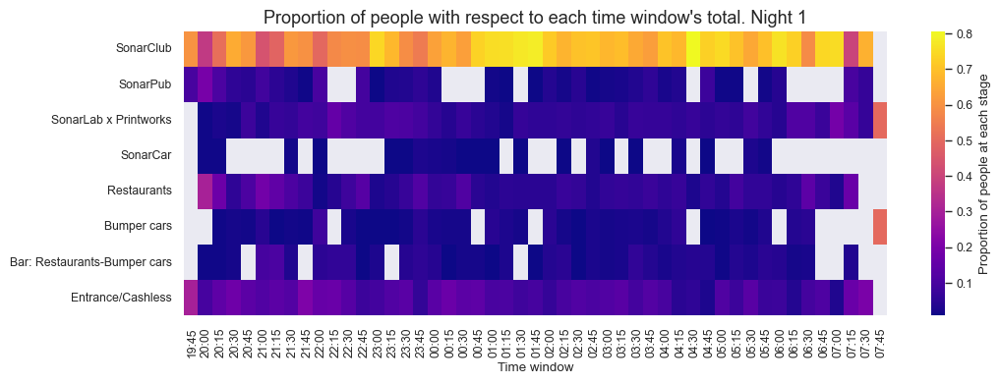

People count time window heatmaps for kmedoids_dtw_3


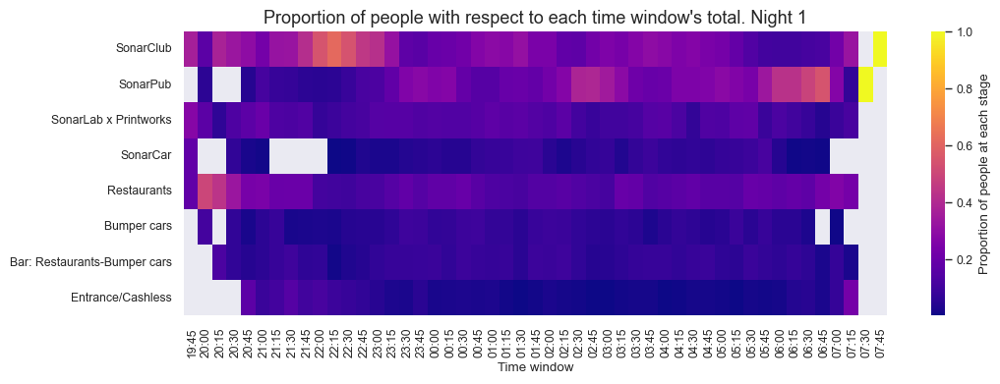

People count time window heatmaps for kmedoids_dtw_4


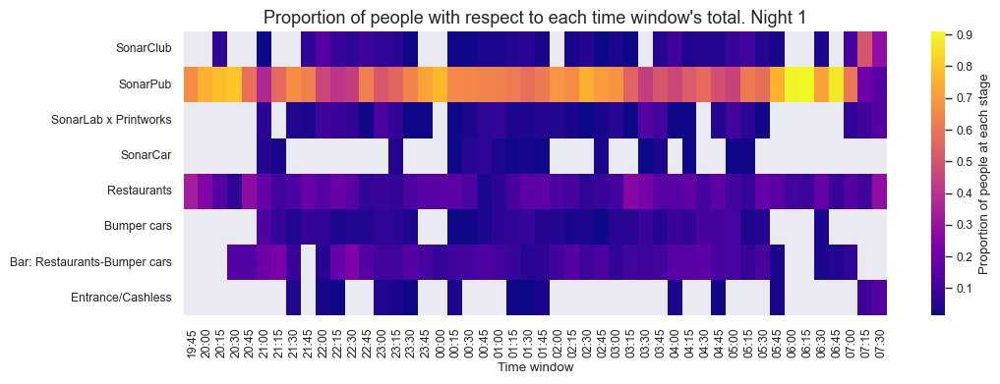

People count time window heatmaps for kmedoids_dtw_5


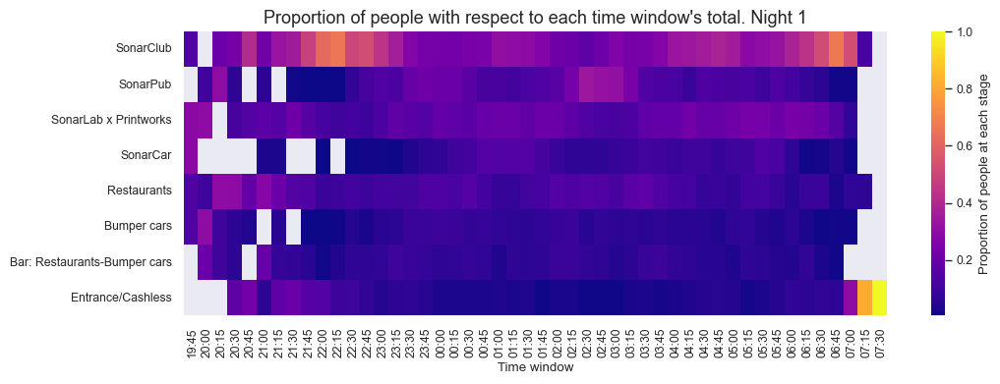

In [228]:
description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='kmedoids_dtw_labels')

## LCSS and GF

### 2D UMAP embeddings (LCSS)

As with the time window euclidean distances, the 2D UMAP embeddings are obtained for visualization.

In [229]:
umaps_lcss_2d_final_filename = os.path.join(path_distances_embeddings,f'umaps_lcss_2d_{n_neighbors_umap}neighbors.pkl')

In [230]:
with open(umaps_lcss_2d_final_filename, 'rb') as f:
    umaps_lcss_2d_final = pickle.load(f)
    print(f'Loaded UMAP distance embeddings from {umaps_lcss_2d_final_filename}')

Loaded UMAP distance embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_lcss_2d_25neighbors.pkl


C:\Camilo\Estudio\Padova\Master thesis\master-thesis-code\distances_calculations.py:584: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



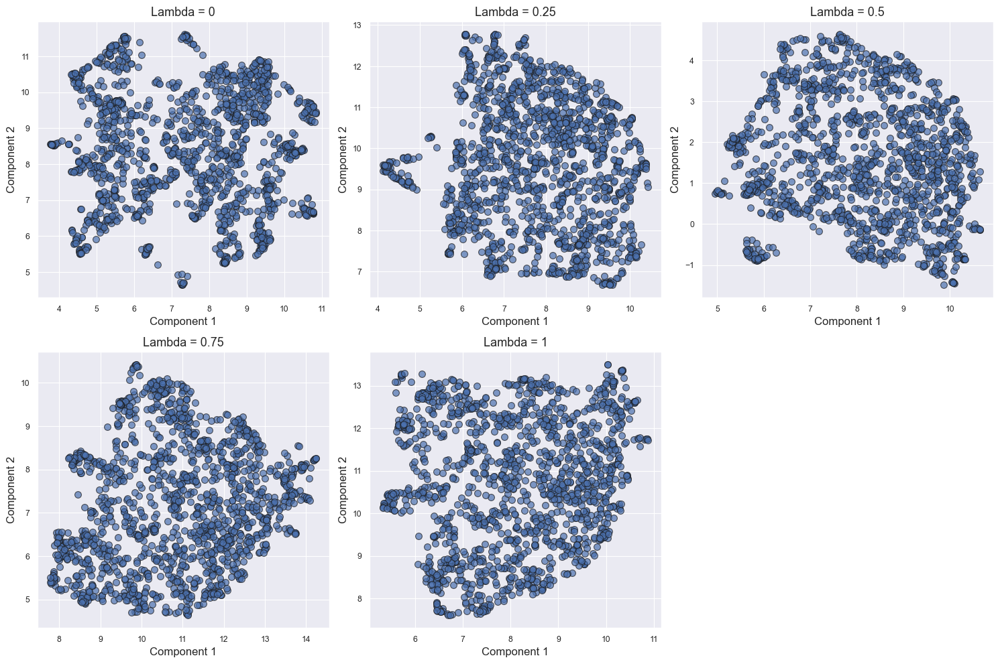

In [231]:
distances_calculations.plot_multiple_embeddings(multi_distances_embeddings=umaps_lcss_2d_final, cols=3)

### Higher-Dimensional UMAP Embeddings

Also, as with the time window euclidean distances, the same higher-dimensional umap embedding is used for clustering.

In [232]:
umaps_lcss_higher_d_final_filename = os.path.join(path_distances_embeddings,f'umaps_lcss_{n_components_umap_clustering}d_{n_neighbors_umap}neighbors.pkl')

In [233]:
with open(umaps_lcss_higher_d_final_filename, 'rb') as f:
        umaps_lcss_higher_d_final = pickle.load(f)
        print(f'Loaded UMAP embeddings from {umaps_lcss_higher_d_final_filename}')

Loaded UMAP embeddings from ..\..\Datasets\Processed\distances_embeddings\night_1\umaps_lcss_5d_25neighbors.pkl


### HDBSCAN

#### Experiment settings

I work with the same hyperparameter options that I used for the time window euclidean distances.

As a rule of thumb to later define the other hyperparameters, I try values from 1% to 5% of the data, which spread on a logarithmic scale.

In [234]:
min_cluster_sizes = generate_log_range_list(min_val = round(n_trajectories*0.01), max_val= 0.05 * n_trajectories, num_values=5)

I set `min_samples` to be proportions of `min_cluster_size`to see what works best.

In [235]:
min_samples_proportions = [0.16, 0.33, 0.66, 0.83, 1]

In [236]:
hdbscan_lcss = hdbscan_experiment.HDBSCANExperiment(multi_distances_embeddings=umaps_lcss_higher_d_final,
                                                   min_cluster_sizes=min_cluster_sizes,
                                                   min_samples_proportions=min_samples_proportions)

print(f'Lambda values for consideration: {list(hdbscan_lcss.multi_distances_embeddings.keys())}')
print(f'min_cluster_size values for consideration: {hdbscan_lcss.min_cluster_sizes}')
print(f'min_samples_proportion values for consideration: {hdbscan_lcss.min_samples_proportions}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
min_cluster_size values for consideration: [16, 23, 35, 52, 78]
min_samples_proportion values for consideration: [0.16, 0.33, 0.66, 0.83, 1]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [237]:
hdbscan_lcss.run_multi_hdbscan()

print('\nHDBSCAN labels and counts:')
for key, labels in hdbscan_lcss.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. HDBSCAN labels_dict was updated.

HDBSCAN labels and counts:
(0, 16, 0.16) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32],
      dtype=int64), array([349,  16,  24,  22,  35,  41,  57,  44,  60,  19,  38,  23,  18,
        56,  69,  16,  24,  21,  23,  57,  78,  22,  61,  35,  42,  16,
        17,  50,  18,  19,  36,  27,  92,  55], dtype=int64))
(0, 16, 0.33) (array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24], dtype=int64), array([345,  16,  24,  22,  44,  35,  40,  53,  54,  58,  18,  36,  56,
    

#### Cluster evaluation

##### DBCV scores

In [238]:
hdbscan_lcss.compute_hdbscan_dbcv_scores()

print('\nHDBSCAN for LCSS - DBCV scores:')
hdbscan_lcss.dbcv_scores_dict

DBCV scores computation is done. HDBSCAN dbcv_scores_dict was updated

HDBSCAN for LCSS - DBCV scores:


{(0, 16, 0.16): 0.43226883778468594,
 (0, 16, 0.33): 0.43382745424415753,
 (0, 16, 0.66): 0.5022021280080844,
 (0, 16, 0.83): 0.4764836283626293,
 (0, 16, 1): 0.5049081917457021,
 (0, 23, 0.16): 0.3144756741421562,
 (0, 23, 0.33): 0.4728589925454016,
 (0, 23, 0.66): 0.5096544096565402,
 (0, 23, 0.83): 0.5064559240174273,
 (0, 23, 1): 0.4626452280823299,
 (0, 35, 0.16): 0.3102323596972171,
 (0, 35, 0.33): 0.46737531717454783,
 (0, 35, 0.66): 0.4509668192013403,
 (0, 35, 0.83): 0.3991785415107116,
 (0, 35, 1): 0.4075171002685277,
 (0, 52, 0.16): 0.2659725467320413,
 (0, 52, 0.33): 0.39458076974835266,
 (0, 52, 0.66): 0.3883929427659446,
 (0, 52, 0.83): 0.36469213838085135,
 (0, 52, 1): 0.1948579889320825,
 (0, 78, 0.16): 0.40343190139282087,
 (0, 78, 0.33): 0.38324342608038026,
 (0, 78, 0.66): 0.16127412246116407,
 (0, 78, 0.83): 0.2225587558081373,
 (0, 78, 1): 0.26310479729878855,
 (0.25, 16, 0.16): 0.2663169821625005,
 (0.25, 16, 0.33): 0.30835280350834776,
 (0.25, 16, 0.66): 0.336850

##### Silhouette scores

In [239]:
hdbscan_lcss.compute_hdbscan_silhouette_scores()

print('\nHDBSCAN for LCSS - silhouette scores:')
hdbscan_lcss.silhouette_scores_dict

Silhouette scores computation is done. HDBSCAN silhouette_scores_dict was updated

HDBSCAN for LCSS - silhouette scores:


{(0, 16, 0.16): 0.26245114,
 (0, 16, 0.33): 0.2567748,
 (0, 16, 0.66): 0.19307424,
 (0, 16, 0.83): 0.18393056,
 (0, 16, 1): 0.22393219,
 (0, 23, 0.16): 0.27742407,
 (0, 23, 0.33): 0.235777,
 (0, 23, 0.66): 0.20075965,
 (0, 23, 0.83): 0.21961017,
 (0, 23, 1): 0.14295201,
 (0, 35, 0.16): 0.18419865,
 (0, 35, 0.33): 0.21001813,
 (0, 35, 0.66): 0.13595724,
 (0, 35, 0.83): 0.14930414,
 (0, 35, 1): 0.117409796,
 (0, 52, 0.16): 0.15595819,
 (0, 52, 0.33): -0.040845085,
 (0, 52, 0.66): -0.043200355,
 (0, 52, 0.83): -0.02135523,
 (0, 52, 1): -0.008196851,
 (0, 78, 0.16): -0.035849422,
 (0, 78, 0.33): -0.04298892,
 (0, 78, 0.66): 0.025444608,
 (0, 78, 0.83): 0.054317866,
 (0, 78, 1): 0.021899983,
 (0.25, 16, 0.16): 0.09408148,
 (0.25, 16, 0.33): 0.09255443,
 (0.25, 16, 0.66): 0.051526845,
 (0.25, 16, 0.83): 0.010702022,
 (0.25, 16, 1): 0.0051893294,
 (0.25, 23, 0.16): 0.10091657,
 (0.25, 23, 0.33): 0.067397974,
 (0.25, 23, 0.66): 0.048529394,
 (0.25, 23, 0.83): 0.011568876,
 (0.25, 23, 1): -0.01

##### Balanced clustering scores

In [240]:
# Compute the entropy of each clustering result
hdbscan_lcss.compute_normalized_entropy()

print('\nHDBSCAN for LCSS - normalized entropies:')
hdbscan_lcss.normalized_entropies_dict

Normalized entropy computation is done. HDBSCAN normalized_entropies_dict was updated

HDBSCAN for LCSS - normalized entropies:


{(0, 16, 0.16): 0.9613383892081813,
 (0, 16, 0.33): 0.9088320064958495,
 (0, 16, 0.66): 0.9697287890669765,
 (0, 16, 0.83): 0.9680611218062326,
 (0, 16, 1): 0.9505376704792657,
 (0, 23, 0.16): 0.9209369278361865,
 (0, 23, 0.33): 0.9313378980959014,
 (0, 23, 0.66): 0.9562765943135308,
 (0, 23, 0.83): 0.9495199412023915,
 (0, 23, 1): 0.9494524325955338,
 (0, 35, 0.16): 0.8400350567326509,
 (0, 35, 0.33): 0.9643905544706602,
 (0, 35, 0.66): 0.9253844211129041,
 (0, 35, 0.83): 0.941910598162271,
 (0, 35, 1): 0.9411018293334743,
 (0, 52, 0.16): 0.8223400778460657,
 (0, 52, 0.33): 0.3668592490407474,
 (0, 52, 0.66): 0.3809465857053901,
 (0, 52, 0.83): 0.38774318105598654,
 (0, 52, 1): 0.856381996648272,
 (0, 78, 0.16): 0.3584467747033072,
 (0, 78, 0.33): 0.37142707700314104,
 (0, 78, 0.66): 0.9051399997047649,
 (0, 78, 0.83): 0.9973806632063373,
 (0, 78, 1): 0.9814538950336537,
 (0.25, 16, 0.16): 0.9631597185621981,
 (0.25, 16, 0.33): 0.9669276320940289,
 (0.25, 16, 0.66): 0.9562184363357489

In [241]:
# Rescale the DBCV of each clustering result
hdbscan_lcss.rescale_dbcv_scores()

print('\nHDBSCAN for LCSS - rescaled DBCV:')
hdbscan_lcss.rescaled_dbcv_scores_dict

Rescaling of DBCV is done. HDBSCAN rescaled_dbcv_scores_dict was updated

HDBSCAN for LCSS - rescaled DBCV:


{(0, 16, 0.16): 0.716134418892343,
 (0, 16, 0.33): 0.7169137271220788,
 (0, 16, 0.66): 0.7511010640040422,
 (0, 16, 0.83): 0.7382418141813146,
 (0, 16, 1): 0.7524540958728511,
 (0, 23, 0.16): 0.6572378370710781,
 (0, 23, 0.33): 0.7364294962727008,
 (0, 23, 0.66): 0.75482720482827,
 (0, 23, 0.83): 0.7532279620087137,
 (0, 23, 1): 0.7313226140411649,
 (0, 35, 0.16): 0.6551161798486085,
 (0, 35, 0.33): 0.7336876585872739,
 (0, 35, 0.66): 0.7254834096006701,
 (0, 35, 0.83): 0.6995892707553558,
 (0, 35, 1): 0.7037585501342638,
 (0, 52, 0.16): 0.6329862733660206,
 (0, 52, 0.33): 0.6972903848741763,
 (0, 52, 0.66): 0.6941964713829722,
 (0, 52, 0.83): 0.6823460691904257,
 (0, 52, 1): 0.5974289944660413,
 (0, 78, 0.16): 0.7017159506964105,
 (0, 78, 0.33): 0.6916217130401902,
 (0, 78, 0.66): 0.580637061230582,
 (0, 78, 0.83): 0.6112793779040686,
 (0, 78, 1): 0.6315523986493943,
 (0.25, 16, 0.16): 0.6331584910812502,
 (0.25, 16, 0.33): 0.6541764017541739,
 (0.25, 16, 0.66): 0.6684250562534086,
 (

In [300]:
# Compute the balanced score

hdbscan_lcss.compute_balanced_clustering_score(weight=0.5)

print('\nHDBSCAN for LCSS - ranked balanced clustering score:')
hdbscan_lcss.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. HDBSCAN ranked_balanced_clustering_scores_dict was updated

HDBSCAN for LCSS - ranked balanced clustering score:


{(0, 16, 0.66): 0.8604149265355093,
 (0, 23, 0.66): 0.8555518995709004,
 (0, 16, 0.83): 0.8531514679937736,
 (0, 16, 1): 0.8514958831760584,
 (0, 23, 0.83): 0.8513739516055525,
 (0, 35, 0.33): 0.8490391065289671,
 (0, 23, 1): 0.8403875233183493,
 (0, 16, 0.16): 0.8387364040502621,
 (0.5, 16, 0.66): 0.8386259497991633,
 (1, 16, 0.83): 0.8364719068216835,
 (1, 23, 0.66): 0.8340948676905444,
 (1, 16, 0.66): 0.83405956645505,
 (0, 23, 0.33): 0.8338836971843011,
 (1, 35, 0.16): 0.8338486513332781,
 (1, 16, 0.33): 0.8334304345564759,
 (0.75, 23, 0.83): 0.832977098439148,
 (0.75, 16, 0.33): 0.8329326112702999,
 (0.75, 23, 1): 0.8306795109560051,
 (0.5, 16, 0.83): 0.8274308629185297,
 (1, 16, 1): 0.8269449976022377,
 (0.5, 16, 0.33): 0.8267469494464751,
 (0, 35, 0.66): 0.8254339153567871,
 (0.75, 35, 0.66): 0.8239537111848653,
 (0.75, 23, 0.66): 0.8235946905139626,
 (1, 52, 0.16): 0.8234134597919855,
 (0, 35, 1): 0.822430189733869,
 (1, 16, 0.16): 0.8211880376589238,
 (0, 35, 0.83): 0.82074993

##### Best parameters based on the scores

Selecting the best parameters based on the DBCV score, the silhouette score and the balanced clustering score.

In [301]:
hdbscan_lcss.update_best_params_and_score()

HDBSCAN updated best_parameters_silhouette are (0, 23, 0.16) with silhouette score = 0.27742406725883484
HDBSCAN updated best_parameters_dbcv are (0.25, 35, 0.83) with DBCV score = 0.6475634482464331
HDBSCAN updated best_parameters_bcs are (0, 16, 0.66) with BCS score = 0.8604149265355093


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the HDBSCAN instance with the best parameters (LCSS):
[-1  0  1]


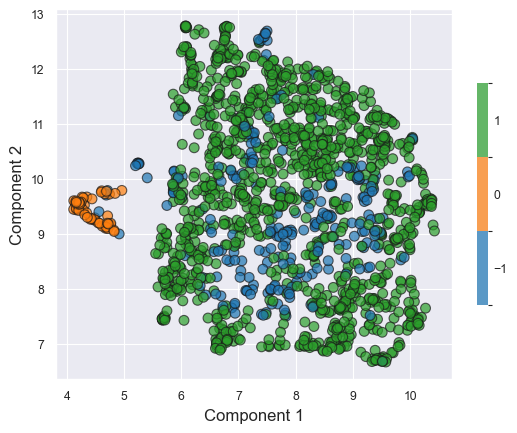

In [302]:
print('Unique labels for the HDBSCAN instance with the best parameters (LCSS):')
print(np.unique(hdbscan_lcss.labels_dict[hdbscan_lcss.best_parameters_dbcv]))


best_lambda = hdbscan_lcss.best_parameters_dbcv[0]
distances_calculations.plot_embeddings(umaps_lcss_2d_final[best_lambda]['embeddings'], 
                                       labels=hdbscan_lcss.labels_dict[hdbscan_lcss.best_parameters_dbcv])

Unique labels for the HDBSCAN instance with the best parameters (LCSS):
[-1  0  1]


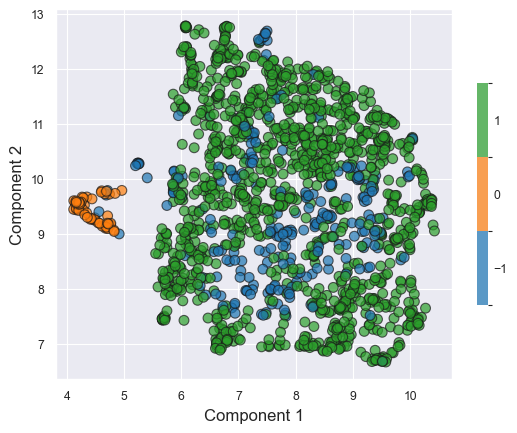

In [245]:
print('Unique labels for the HDBSCAN instance with the best parameters (LCSS):')
print(np.unique(hdbscan_lcss.labels_dict[hdbscan_lcss.best_parameters_dbcv]))


best_lambda = hdbscan_lcss.best_parameters_dbcv[0]
distances_calculations.plot_embeddings(umaps_lcss_2d_final[best_lambda]['embeddings'], 
                                       labels=hdbscan_lcss.labels_dict[hdbscan_lcss.best_parameters_dbcv])

#### Description of the clusters

##### Selecting the results to examine

In [246]:
trajectory_general_measures_night['hdbscan_lcss_labels'] = hdbscan_lcss.labels_dict[hdbscan_lcss.best_parameters_dbcv]

##### Summary statistics by clusters

In [247]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='hdbscan_lcss_labels',
                                             decimals=5)

hdbscan_lcss_labels,-1,0,1
count,249.0,61.0,1270.0
"(tid, mean)",1.0,1.0,1.0
"(tid, std)",0.0,0.0,0.0
"(tid, min)",1.0,1.0,1.0
"(tid, max)",1.0,1.0,1.0
...,...,...,...
"(kmedoids_dtw_labels, max)",5.0,5.0,5.0
"(hdbscan_lcss_labels, mean)",-1.0,0.0,1.0
"(hdbscan_lcss_labels, std)",0.0,0.0,0.0
"(hdbscan_lcss_labels, min)",-1.0,0.0,1.0


##### Arrival and departure times

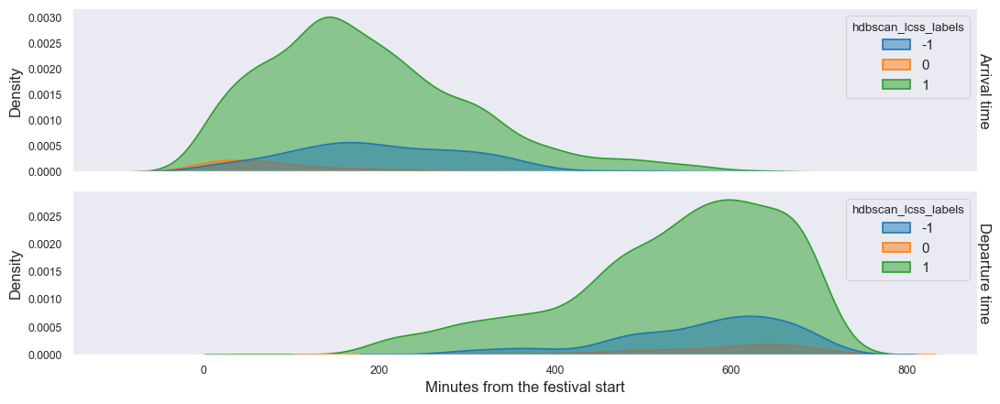

In [248]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='hdbscan_lcss_labels')

#####  Distributions per column of interest

In [249]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [250]:
"""for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_lcss_labels', interest_col=col_interest)"""

"for col_interest in columns_interest_distribution:\n    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_lcss_labels', interest_col=col_interest)"

##### Scatter plots with regression

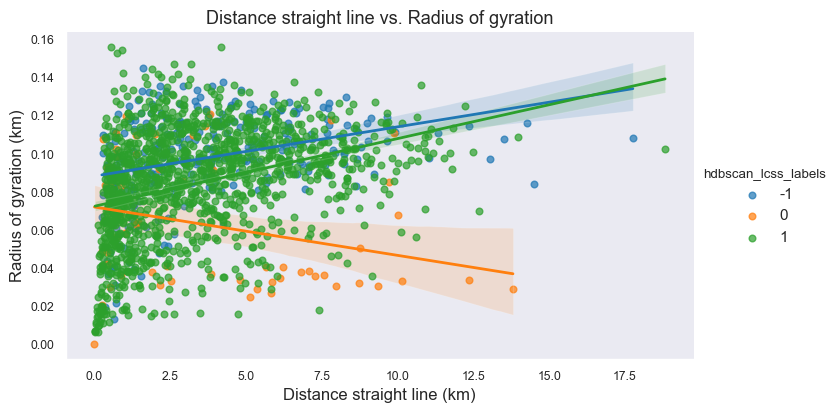

In [251]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_lcss_labels')


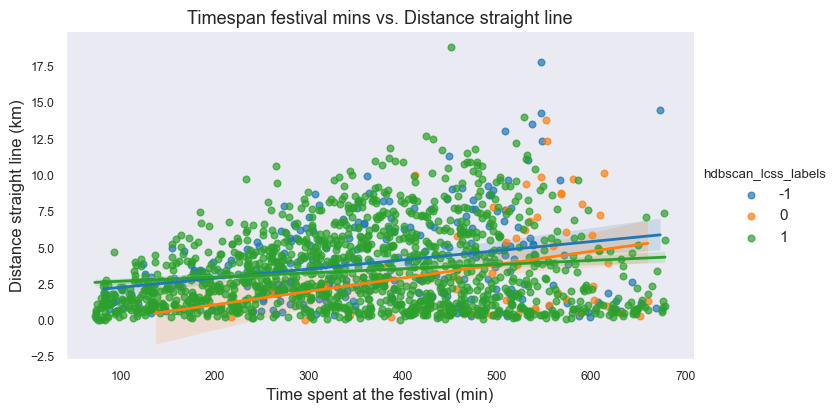

In [252]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='hdbscan_lcss_labels')

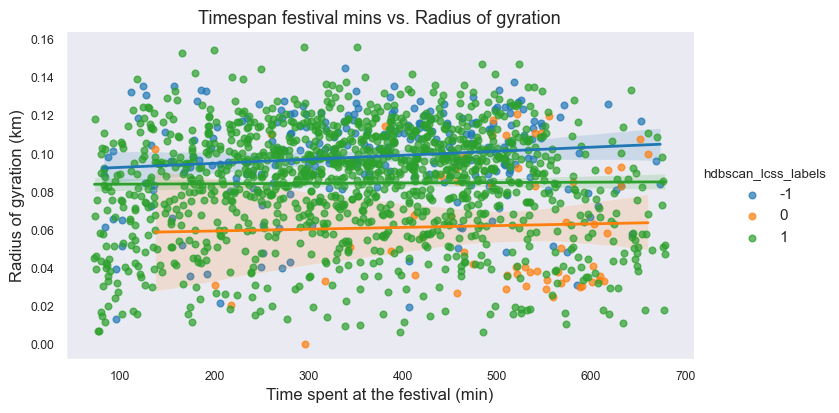

In [253]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='hdbscan_lcss_labels')

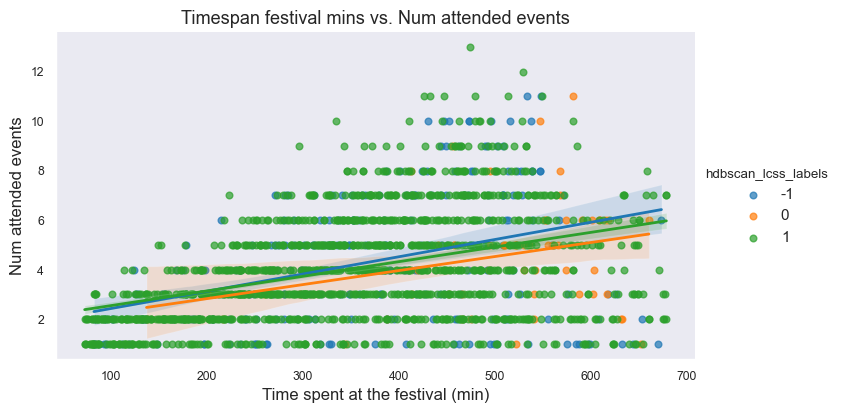

In [254]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='hdbscan_lcss_labels')

##### Event rankings by cluster

In [255]:
"""description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='hdbscan_lcss_labels')"""

"description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,\n                                                     clusters_col='hdbscan_lcss_labels')"

In [256]:
"""description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='hdbscan_lcss_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)"""

"description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,\n                                              clusters_col='hdbscan_lcss_labels',\n                                              path_to_save=path_cluster_description,\n                                              show_plot=False)"

##### H3 counts plots per cluster

In [257]:
"""# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','hdbscan_lcss_labels']],
                                                on=['uid','tid'],
                                                how='left')"""

"# Join the cluster labels to the full trajectory\ntrajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,\n                                                trajectory_general_measures_night[['uid','tid','hdbscan_lcss_labels']],\n                                                on=['uid','tid'],\n                                                how='left')"

Plotting the observation counts by H3 cell and cluster.

In [258]:
"""description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='hdbscan_lcss_labels', 
                                                     path_to_save=path_cluster_description)"""

"description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                     clusters_col='hdbscan_lcss_labels', \n                                                     path_to_save=path_cluster_description)"

Plotting the user counts by H3 cell timeline by cluster.

In [259]:
"""description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='hdbscan_lcss_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)"""

"description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                            clusters_col='hdbscan_lcss_labels',\n                                                            window_duration='15min',\n                                                            path_to_save=path_cluster_description)"

##### Vendor name proportion

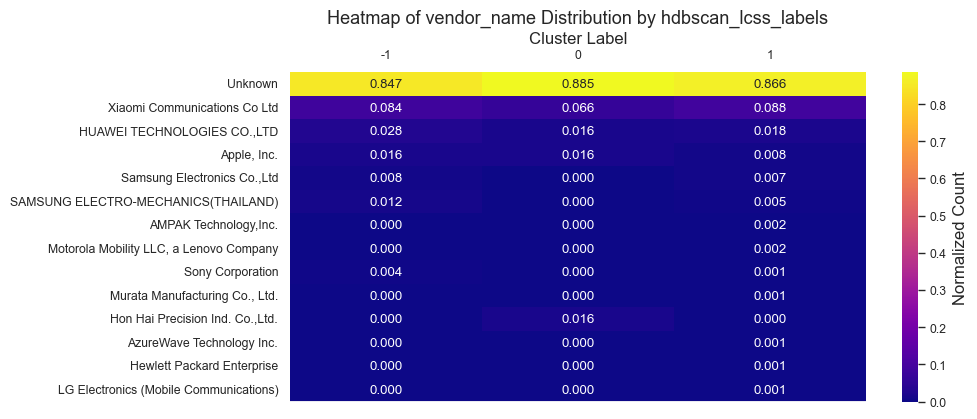

In [260]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'hdbscan_lcss_labels')


##### People counts heatmap by cluster

In [261]:
"""description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='hdbscan_lcss_labels')"""

"description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,\n                                                               clusters_col='hdbscan_lcss_labels')"

### K Medoids

#### Experiment settings

I work with the same hyperparameter options that I used for the time window euclidean distances.

In [262]:
kmedoids_lcss = kmedoids_experiment.KMedoidsExperiment(multi_distances_embeddings=umaps_lcss_higher_d_final,
                                                     k_values=list(range(2,11)))

print(f'Lambda values for consideration: {list(kmedoids_lcss.multi_distances_embeddings.keys())}')
print(f'k values for consideration: {kmedoids_lcss.k_values}')

Lambda values for consideration: [0, 0.25, 0.5, 0.75, 1]
k values for consideration: [2, 3, 4, 5, 6, 7, 8, 9, 10]


#### Performing clustering

Running the function that performs clustering for the set of parameters and updates the object's attributes.

In [263]:
kmedoids_lcss.run_multi_kmedoids()

print('\nK-medoids for LCSS - labels:')
for key, labels in kmedoids_lcss.labels_dict.items():
    print(key,np.unique(labels, return_counts=True))

Performed clustering for combined distance with lambda = 0
Performed clustering for combined distance with lambda = 0.25
Performed clustering for combined distance with lambda = 0.5
Performed clustering for combined distance with lambda = 0.75
Performed clustering for combined distance with lambda = 1
Clustering is done. K-medoids labels_dict was updated.

K-medoids for LCSS - labels:
(0, 2) (array([0, 1], dtype=int64), array([722, 858], dtype=int64))
(0, 3) (array([0, 1, 2], dtype=int64), array([713, 484, 383], dtype=int64))
(0, 4) (array([0, 1, 2, 3], dtype=int64), array([246, 441, 354, 539], dtype=int64))
(0, 5) (array([0, 1, 2, 3, 4], dtype=int64), array([319, 302, 318, 297, 344], dtype=int64))
(0, 6) (array([0, 1, 2, 3, 4, 5], dtype=int64), array([311, 318, 280, 104, 279, 288], dtype=int64))
(0, 7) (array([0, 1, 2, 3, 4, 5, 6], dtype=int64), array([267, 224, 271, 106, 130, 254, 328], dtype=int64))
(0, 8) (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([106, 163, 271, 255, 120

#### Cluster evaluation

##### Silhouette scores

In [264]:
kmedoids_lcss.compute_kmedoids_silhouette_scores()

print('\K-medoids for LCSS - silhouette scores:')
kmedoids_lcss.silhouette_scores_dict

Silhouette scores computation is done. K-medoids silhouette_scores_dict was updated
\K-medoids for LCSS - silhouette scores:


{(0, 2): 0.36522403,
 (0, 3): 0.34327763,
 (0, 4): 0.3204717,
 (0, 5): 0.3352023,
 (0, 6): 0.3564392,
 (0, 7): 0.3415144,
 (0, 8): 0.34066564,
 (0, 9): 0.30625242,
 (0, 10): 0.33565137,
 (0.25, 2): 0.3096586,
 (0.25, 3): 0.28632933,
 (0.25, 4): 0.3053912,
 (0.25, 5): 0.336701,
 (0.25, 6): 0.31000173,
 (0.25, 7): 0.33269402,
 (0.25, 8): 0.30659586,
 (0.25, 9): 0.3291936,
 (0.25, 10): 0.3215194,
 (0.5, 2): 0.23577869,
 (0.5, 3): 0.27030256,
 (0.5, 4): 0.30715,
 (0.5, 5): 0.3469319,
 (0.5, 6): 0.33980784,
 (0.5, 7): 0.32278922,
 (0.5, 8): 0.33195552,
 (0.5, 9): 0.33106658,
 (0.5, 10): 0.31244808,
 (0.75, 2): 0.2589462,
 (0.75, 3): 0.272597,
 (0.75, 4): 0.26501605,
 (0.75, 5): 0.3419072,
 (0.75, 6): 0.35464573,
 (0.75, 7): 0.34153837,
 (0.75, 8): 0.3444934,
 (0.75, 9): 0.3159607,
 (0.75, 10): 0.31443736,
 (1, 2): 0.30788887,
 (1, 3): 0.25226173,
 (1, 4): 0.2750259,
 (1, 5): 0.23964024,
 (1, 6): 0.36235845,
 (1, 7): 0.35299283,
 (1, 8): 0.3484659,
 (1, 9): 0.35058293,
 (1, 10): 0.34365582}

##### DBCV scores

For completeness, the DBCV is. also computed for K-medoids.

In [265]:
kmedoids_lcss.compute_kmedoids_dbcv_scores()

print('\K-medoids for LCSS - DBCV scores:')
kmedoids_lcss.dbcv_scores_dict

DBCV scores computation is done. K-medoids dbcv_scores_dict was updated
\K-medoids for LCSS - DBCV scores:


{(0, 2): -0.937277443924815,
 (0, 3): -0.8551005265469294,
 (0, 4): -0.9577558213527934,
 (0, 5): -0.9781889260116,
 (0, 6): -0.9614399235858858,
 (0, 7): -0.8649345287310484,
 (0, 8): -0.8928913778801046,
 (0, 9): -0.81309805520873,
 (0, 10): -0.8309604355374174,
 (0.25, 2): -0.914737253008056,
 (0.25, 3): -0.9741496180480409,
 (0.25, 4): -0.8905087491533731,
 (0.25, 5): -0.843030108095857,
 (0.25, 6): -0.9001703894699977,
 (0.25, 7): -0.8975223901650676,
 (0.25, 8): -0.9064961542770974,
 (0.25, 9): -0.7171286447758469,
 (0.25, 10): -0.8575811090824973,
 (0.5, 2): -0.9566185013529781,
 (0.5, 3): -0.9711794427609548,
 (0.5, 4): -0.9005941876427284,
 (0.5, 5): -0.9048468031533263,
 (0.5, 6): -0.9154726916337363,
 (0.5, 7): -0.9172274969313154,
 (0.5, 8): -0.8956536241132648,
 (0.5, 9): -0.8933533572927324,
 (0.5, 10): -0.8469390142190241,
 (0.75, 2): -0.9571438858531701,
 (0.75, 3): -0.9599137873537132,
 (0.75, 4): -0.8963071975358168,
 (0.75, 5): -0.924324032238012,
 (0.75, 6): -0.8526

##### Balanced clustering scores

In [266]:
# Compute the entropy of each clustering result
kmedoids_lcss.compute_normalized_entropy()

print('\nK-medoids for LCSS - normalized entropies:')
kmedoids_lcss.normalized_entropies_dict

Normalized entropy computation is done. K-medoids normalized_entropies_dict was updated

K-medoids for LCSS - normalized entropies:


{(0, 2): 0.9946488671232326,
 (0, 3): 0.9694150601313486,
 (0, 4): 0.9722287416723273,
 (0, 5): 0.9991648398625894,
 (0, 6): 0.9737893780610896,
 (0, 7): 0.9696126269736051,
 (0, 8): 0.9721463643741429,
 (0, 9): 0.95828610740803,
 (0, 10): 0.9127617776171814,
 (0.25, 2): 0.9993341449965906,
 (0.25, 3): 0.9836221375085007,
 (0.25, 4): 0.9970136438082877,
 (0.25, 5): 0.9894242913301564,
 (0.25, 6): 0.9779449848667542,
 (0.25, 7): 0.9601082513360136,
 (0.25, 8): 0.9704513815019808,
 (0.25, 9): 0.9565302294230666,
 (0.25, 10): 0.9716610773178107,
 (0.5, 2): 0.959635359511475,
 (0.5, 3): 0.9973101872181229,
 (0.5, 4): 0.9788219633315938,
 (0.5, 5): 0.9744479302359557,
 (0.5, 6): 0.9737649420750991,
 (0.5, 7): 0.9640871495165984,
 (0.5, 8): 0.9848323670262725,
 (0.5, 9): 0.9911074892440408,
 (0.5, 10): 0.9761440502648667,
 (0.75, 2): 0.9995827085958936,
 (0.75, 3): 0.9891915737247383,
 (0.75, 4): 0.9956064522919917,
 (0.75, 5): 0.976271019681677,
 (0.75, 6): 0.9832478668229901,
 (0.75, 7): 0

In [267]:
# Rescale the silhouette of each clustering result
kmedoids_lcss.rescale_silhouette_scores()

print('\nK-medoids for LCSS - rescaled silhouette:')
kmedoids_lcss.rescaled_silhouette_scores_dict

Rescaling of silhouette is done. K-medoids rescaled_silhouette_scores_dict was updated

K-medoids for LCSS - rescaled silhouette:


{(0, 2): 0.6826120167970657,
 (0, 3): 0.6716388165950775,
 (0, 4): 0.6602358520030975,
 (0, 5): 0.667601153254509,
 (0, 6): 0.6782196015119553,
 (0, 7): 0.6707572042942047,
 (0, 8): 0.6703328192234039,
 (0, 9): 0.6531262099742889,
 (0, 10): 0.6678256839513779,
 (0.25, 2): 0.6548292934894562,
 (0.25, 3): 0.6431646645069122,
 (0.25, 4): 0.6526955962181091,
 (0.25, 5): 0.6683505028486252,
 (0.25, 6): 0.6550008654594421,
 (0.25, 7): 0.66634701192379,
 (0.25, 8): 0.6532979309558868,
 (0.25, 9): 0.6645967960357666,
 (0.25, 10): 0.6607597023248672,
 (0.5, 2): 0.6178893446922302,
 (0.5, 3): 0.635151281952858,
 (0.5, 4): 0.6535750031471252,
 (0.5, 5): 0.6734659522771835,
 (0.5, 6): 0.6699039191007614,
 (0.5, 7): 0.6613946110010147,
 (0.5, 8): 0.6659777611494064,
 (0.5, 9): 0.6655332893133163,
 (0.5, 10): 0.6562240421772003,
 (0.75, 2): 0.6294731050729752,
 (0.75, 3): 0.6362984925508499,
 (0.75, 4): 0.6325080245733261,
 (0.75, 5): 0.6709536015987396,
 (0.75, 6): 0.6773228645324707,
 (0.75, 7): 0

In [303]:
# Compute the balanced score

kmedoids_lcss.compute_balanced_clustering_score(weight=0.5)

print('\K-medoids for LCSS - ranked balanced clustering score:')
kmedoids_lcss.ranked_balanced_clustering_scores_dict

Balanced clustering scores computation and ranking is done. K-medoids ranked_balanced_clustering_scores_dict was updated
\K-medoids for LCSS - ranked balanced clustering score:


{(0, 2): 0.8386304419601491,
 (1, 6): 0.8337873323768886,
 (0, 5): 0.8333829965585492,
 (0.75, 6): 0.8302853656777305,
 (0.25, 5): 0.8288873970893909,
 (0.5, 9): 0.8283203892786786,
 (0.25, 2): 0.8270817192430233,
 (0, 6): 0.8260044897865224,
 (0.5, 8): 0.8254050640878394,
 (1, 7): 0.8249641370749441,
 (0.25, 4): 0.8248546200131984,
 (0.5, 5): 0.8239569412565696,
 (0.75, 5): 0.8236123106402082,
 (0.75, 7): 0.8234373179905765,
 (0.5, 6): 0.8218344305879303,
 (0, 8): 0.8212395917987734,
 (1, 2): 0.8205818634058077,
 (0, 3): 0.820526938363213,
 (0.75, 9): 0.8205115613548242,
 (1, 9): 0.8203064934014075,
 (0, 7): 0.8201849156339049,
 (0.75, 8): 0.8195736225600165,
 (1, 10): 0.8168439801177099,
 (0.25, 6): 0.8164729251630982,
 (0, 4): 0.8162322968377125,
 (0.5, 3): 0.8162307345854904,
 (0.25, 10): 0.816210389821339,
 (0.5, 4): 0.8161984832393595,
 (0.5, 10): 0.8161840462210335,
 (0.75, 2): 0.8145279068344344,
 (0.75, 4): 0.814057238432659,
 (0.25, 3): 0.8133934010077064,
 (0.25, 7): 0.81322

Selecting the best parameters based on the silhouette score.

In [304]:
kmedoids_lcss.update_best_params_and_score()

K-medoids updated best_parameters are (0, 2) with silhouette score = 0.36522403359413147
K-medoids updated best_parameters_bcs are (0, 2) with BCS score = 0.8386304419601491


##### Visual assessment

Checking the 2D embedding with the resulting clusters.

Unique labels for the K-medoids instance with the best parameters (LCSS):
[0 1]


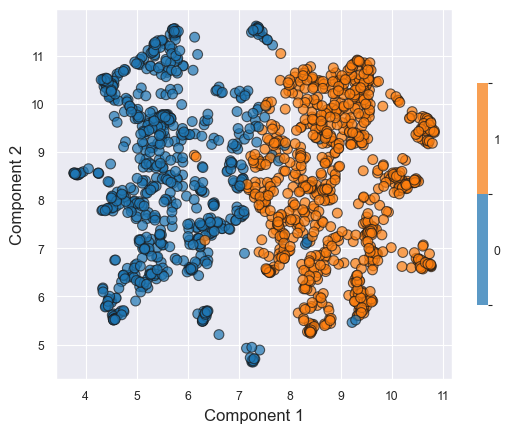

In [305]:
print('Unique labels for the K-medoids instance with the best parameters (LCSS):')
print(np.unique(kmedoids_lcss.labels_dict[kmedoids_lcss.best_parameters_silhouette]))


best_lambda = kmedoids_lcss.best_parameters_silhouette[0]
distances_calculations.plot_embeddings(umaps_lcss_2d_final[best_lambda]['embeddings'], 
                                       labels=kmedoids_lcss.labels_dict[kmedoids_lcss.best_parameters_silhouette])

#### Description of the clusters

##### Selecting the results to examine

In [271]:
trajectory_general_measures_night['kmedoids_lcss_labels'] = kmedoids_lcss.labels_dict[kmedoids_lcss.best_parameters_silhouette]

##### Summary statistics by clusters

In [272]:
description_clusters.summarize_grouped_stats(trajectory_general_measures_df=trajectory_general_measures_night, 
                                             clusters_col='kmedoids_lcss_labels',
                                             decimals=5)

kmedoids_lcss_labels,0,1
count,722.0,858.0
"(tid, mean)",1.0,1.0
"(tid, std)",0.0,0.0
"(tid, min)",1.0,1.0
"(tid, max)",1.0,1.0
...,...,...
"(hdbscan_lcss_labels, max)",1.0,1.0
"(kmedoids_lcss_labels, mean)",0.0,1.0
"(kmedoids_lcss_labels, std)",0.0,0.0
"(kmedoids_lcss_labels, min)",0.0,1.0


##### Arrival and departure times

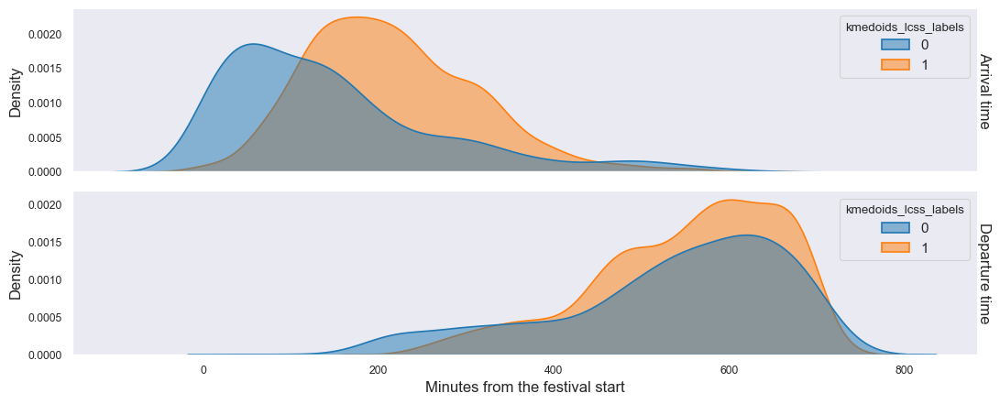

In [273]:
description_clusters.plot_arrival_departure(df=trajectory_general_measures_night, clusters_col='kmedoids_lcss_labels')

#####  Distributions per column of interest

In [274]:
trajectory_general_measures_night.columns

Index(['uid', 'tid', 'observations_user_night_original',
       'confidence_metric_adj', 'timespan_festival_mins',
       'arrival_festival_mins', 'departure_festival_mins',
       'average_cell_density', 'num_attended_events', 'distance_straight_line',
       'radius_of_gyration', 'total_stops_duration_mins',
       'duration_electronic_accessible_share',
       'duration_electronic_hypnotic_share', 'duration_other_genres_share',
       'duration_no_event_share', 'duration_bar_restaurant_share',
       'duration_other_share', 'duration_stage_share',
       'duration_SonarClub_share', 'duration_SonarPub_share',
       'duration_SonarLab x Printworks_share', 'duration_SonarCar_share',
       'duration_Restaurants_share', 'duration_Bumper cars_share',
       'duration_Bar: Restaurants-Bumper cars_share',
       'duration_Entrance/Cashless_share',
       'avg_adj_score_electronic_accessible',
       'avg_adj_score_electronic_hypnotic', 'avg_adj_score_other_genres',
       'adj_score_ev_1'

In [275]:
"""for col_interest in columns_interest_distribution:
    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_dtw_labels', interest_col=col_interest)"""

"for col_interest in columns_interest_distribution:\n    description_clusters.plot_violin_box_by_cluster(df=trajectory_general_measures_night, clusters_col='hdbscan_dtw_labels', interest_col=col_interest)"

##### Scatter plots with regression

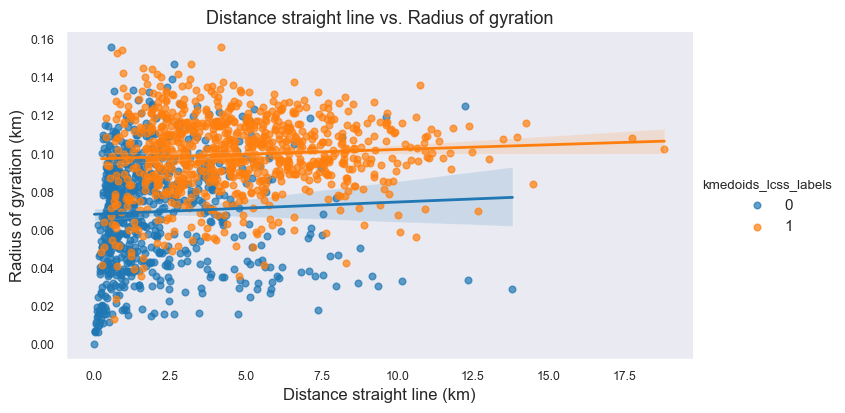

In [276]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='distance_straight_line', 
                                                y_col='radius_of_gyration',
                                                x_label='Distance straight line (km)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_lcss_labels')


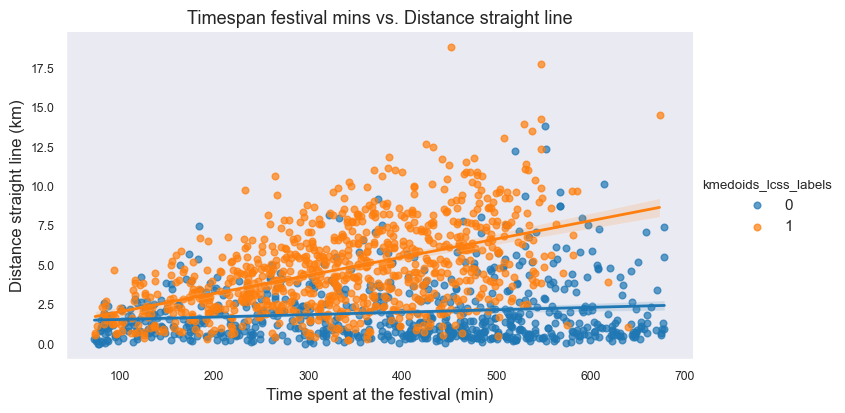

In [277]:
# Example usage:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='distance_straight_line',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Distance straight line (km)',
                                                clusters_col='kmedoids_lcss_labels')

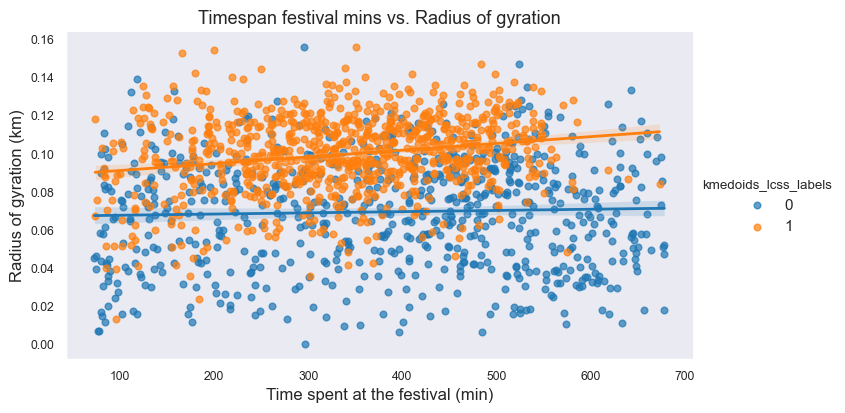

In [278]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='radius_of_gyration',
                                                x_label='Time spent at the festival (min)',
                                                y_label='Radius of gyration (km)',
                                                clusters_col='kmedoids_lcss_labels')

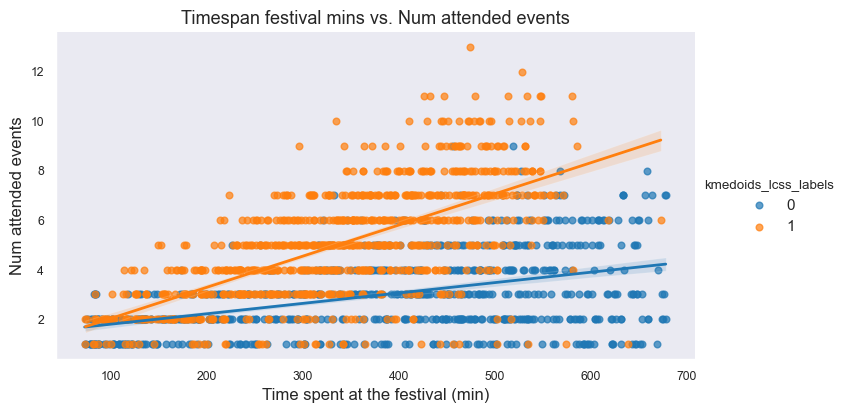

In [279]:
description_clusters.plot_scatter_with_regression(df=trajectory_general_measures_night,
                                                x_col='timespan_festival_mins', 
                                                y_col='num_attended_events',
                                                x_label='Time spent at the festival (min)',
                                                clusters_col='kmedoids_lcss_labels')

##### Event rankings by cluster

In [280]:
"""description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,
                                                     clusters_col='kmedoids_lcss_labels')"""

"description_clusters.user_event_scores_with_clusters(trajectory_general_measures_df=trajectory_general_measures_night,\n                                                     clusters_col='kmedoids_lcss_labels')"

In [281]:
"""description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,
                                              clusters_col='kmedoids_lcss_labels',
                                              path_to_save=path_cluster_description,
                                              show_plot=False)"""

"description_clusters.plot_rankings_by_cluster(trajectory_general_measures_df=trajectory_general_measures_night,\n                                              clusters_col='kmedoids_lcss_labels',\n                                              path_to_save=path_cluster_description,\n                                              show_plot=False)"

##### H3 counts plots per cluster

In [282]:
# Join the cluster labels to the full trajectory
trajectories_events_night_extra_info = pd.merge(trajectories_events_night_extra_info,
                                                trajectory_general_measures_night[['uid','tid','kmedoids_lcss_labels']],
                                                on=['uid','tid'],
                                                how='left')

Plotting the observation counts by H3 cell and cluster.

In [283]:
"""description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                     clusters_col='kmedoids_lcss_labels', 
                                                     path_to_save=path_cluster_description)"""

"description_clusters.plot_record_h3counts_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                     clusters_col='kmedoids_lcss_labels', \n                                                     path_to_save=path_cluster_description)"

Plotting the user counts by H3 cell timeline by cluster.

In [284]:
"""description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, 
                                                            clusters_col='kmedoids_lcss_labels',
                                                            window_duration='15min',
                                                            path_to_save=path_cluster_description)"""

"description_clusters.plot_user_h3counts_timeline_by_cluster(trajectories_df=trajectories_events_night_extra_info, \n                                                            clusters_col='kmedoids_lcss_labels',\n                                                            window_duration='15min',\n                                                            path_to_save=path_cluster_description)"

##### Vendor name proportion

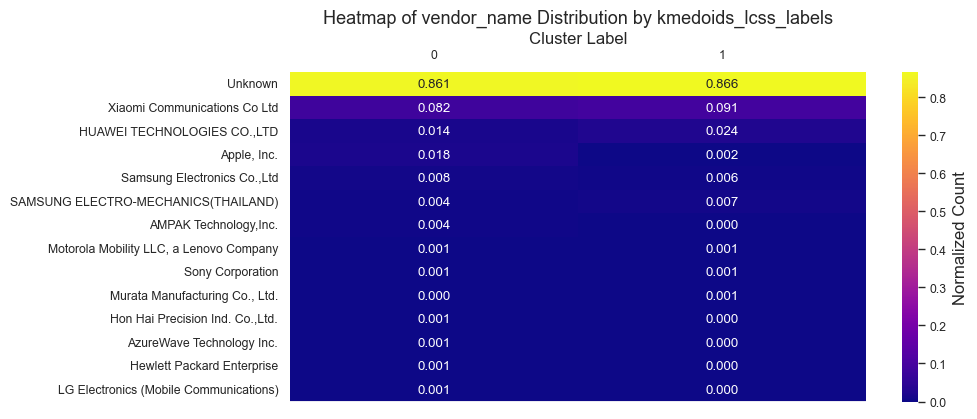

In [285]:
description_clusters.plot_vendor_distribution_heatmap(trajectory_general_measures_night,'kmedoids_lcss_labels')


##### People counts heatmap by cluster

In [286]:
"""description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,
                                                               clusters_col='kmedoids_lcss_labels')"""

"description_clusters.plot_stage_proportion_heatmaps_by_cluster(trajectories_df=trajectories_events_night_extra_info,\n                                                               clusters_col='kmedoids_lcss_labels')"

## Writing the results tables

In [287]:
trajectory_general_measures_night.to_csv(os.path.join(path_clustering_results_tables,f'traj_general_measures_labels_n{night_interest}.csv'), index=False)